# This notebook generates pi0 plots for specific set of pickles

In [1]:
%matplotlib inline
import platform
print(platform.python_version())
from ROOT import TFile,vector
import ROOT

import matplotlib.pyplot as plt
import pickle
import pandas as pd
import numpy as np
from numpy import mean
from math import sqrt,acos,cos,sin,pi,exp,log,isnan,atan2
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from numpy import asarray
from root_pandas import read_root
from matplotlib import gridspec
from scipy import stats
from scipy.optimize import curve_fit
from scipy import asarray as ar,exp
from matplotlib.patches import Rectangle
from matplotlib.collections import PatchCollection
import math


import pickle
import pandas as pd
import numpy as np
from numpy import mean
from math import sqrt,acos,cos,sin,pi,exp,log,isnan,atan2
from numpy import asarray
from root_pandas import read_root
from matplotlib import gridspec
from scipy import stats
from scipy.interpolate import interp1d
from scipy.integrate import quad
from matplotlib.collections import PatchCollection
from matplotlib.patches import Rectangle
from textwrap import wrap
import copy

import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages

3.5.2
Welcome to JupyROOT 6.14/08


In [2]:
# davios functions for plotting...

def Tune1(df):
    return df['xsec_tune1_weight'].values

def CV(df):
    wgt = []
    if 'xsec_corr_weight' in df.columns:
        wgt = df['xsec_corr_weight'].values
    else:
        for i in range(len(df)):
            wgt.append(1.0)
#     if False:
    if 'new_weight' in df.columns:
        tmpweights1 = df['new_weight'].values

    else:
        tmpweights1 = []
        for i in range(len(wgt)):
            tmpweights1.append(1.0)
    
    if 'pot_weight' in df.columns:
#     if False:
        tmpweights2 = df['pot_weight'].values
    else:
        tmpweights2 = []
        for i in range(len(wgt)):
            tmpweights2.append(1.0)
            
    for i in range(len(wgt)):
        wgt[i] = wgt[i]*tmpweights1[i]*tmpweights2[i]
#         
    wgt[wgt == np.inf] = 1
    wgt = np.nan_to_num(wgt)
    wgt[wgt <= 0] = 1
    
    return wgt

def Spline(df):
    wgt = df['spline_weight'].values
    wgt[wgt == np.inf] = 1
    wgt = np.nan_to_num(wgt)
    wgt[wgt <= 0] = 1
    return wgt


class sampHist:

    def __init__(self,samp_df,samp_l,samp_c,samp_wind,samp_s):
        self._df = samp_df.copy()
        self._label = samp_l
        self._color = samp_c
        self._scale = samp_s
        self._wi = samp_wind
        if samp_wind == 0:
            self._wgt = np.ones(len(samp_df))
        if samp_wind == 1:
            self._wgt = CV(samp_df)

    def setweight(self,windex):
        if windex == 0:
            self._wgt = np.ones(len(self._df))
        if windex == 1:
            self._wgt = CV(self._df)

    def dist(self,s_var):
        return self._df[s_var].values

    def cosdist(self,s_var):
        return np.cos(self._df[s_var].values)

    def applycut(self,s_cut):
        newhist = copy.deepcopy(self)
        newhist._df = self._df.query(s_cut)
        newhist.setweight(self._wi)
        return newhist

class SimpleHisto:

    def __init__ (self,df_df,f_scale,i_wgt,s_color,s_label):
        temp_df = df_df.copy()
        temp_df['myscale'] = f_scale
        self.mydf = temp_df
        self.mycolor = s_color
        self.mylabel = s_label
        self.iwgt = i_wgt

        self.mycut = 'Enu_1m1p > 0'

    def AddCut(self,s_cut):
        self.mycut  = s_cut

    def ClearCut(self):
        self.mycut = 'Enu_1m1p > 0'

    def GetHist(self,s_varname):
        temp_df = self.mydf.query(self.mycut)
        if self.iwgt == 1:
            myweight = CV(temp_df)
        elif self.iwgt == 0:
            myweight = np.ones(len(temp_df))
        return temp_df[s_varname].values,myweight,temp_df['myscale'].values,self.mycolor,self.mylabel

def GetErrorsData(xobs,CL=0.6827):
    step    = 0.01
    upperBoundary = int(max(10,xobs+5*np.sqrt(xobs)))
    r = np.arange(0.01,upperBoundary,step)
    s    = PmuGivenX(r,xobs)*step
    PDF1 = interp1d(r,s,bounds_error=False,fill_value=0)
    PPF1 = interp1d(np.cumsum(s),r)
    xobs_low  = float(PPF1((1-CL)/2))
    xobs_high = float(PPF1(1-(1-CL)/2))
    return xobs_low,xobs_high

class StackedHisto:

    def  __init__ (self,a_df_mc,a_df_scale):
        self.mystrata = []
        self.stratalabel = []
        self.stratacolor = []
        self.mylayer = []
        self.layerlabel = []
        self.layercolor = []
        self.layeriwgt = []
        self.stratxweight = []

        temp_a_df = []
        for i in range(len(a_df_mc)):
            temp_df = a_df_mc[i].copy()
            temp_df['myscale'] = a_df_scale[i]
            temp_a_df.append(temp_df)
        self.mymc = pd.concat(temp_a_df)
        self.mycut ='(shower1_E_Y>0 or shower1_E_Y<=0)'


    def ClearCut(self):
        self.mycut = 'Enu_1m1p > 0'

    def AddCut(self,s_cut):
        self.mycut  = s_cut

    def AddLayer(self,df_layer,df_scale,i_wgt,s_label,s_color):
        temp_df = df_layer.copy()
        temp_df['myscale'] = df_scale
        self.mylayer.append(temp_df)
        self.layerlabel.append(s_label)
        self.layercolor.append(s_color)
        self.layeriwgt.append(i_wgt)

    def AddStrata(self,s_strata,s_label,s_color,f_wgt=1.0):
        self.mystrata.append(s_strata)
        self.stratalabel.append(s_label)
        self.stratacolor.append(s_color)
        self.stratxweight.append(f_wgt)

    def GetHists(self,s_varname):
        a_vals = []        # (nxN)
        a_wgts = []
        a_scale = []
        a_cols = []        # (nx1)
        a_labels = []

        # first, run  through strata
        for i in range(len(self.mystrata)):
            # isolate this stratum with current cut
            temp_df = self.mymc.query(self.mystrata[i]+' and '+self.mycut)
            print(len(temp_df))
            a_vals.append(temp_df[s_varname].values)
            a_wgts.append(CV(temp_df) * self.stratxweight[i])   # ah, this is if we want to scale an individual stratum
            a_scale.append(temp_df['myscale'].values)

            a_cols.append(self.stratacolor[i])
            a_labels.append(self.stratalabel[i])

        for i in range(len(self.mylayer)):
            temp_df = self.mylayer[i].query(self.mycut)

            a_vals.append(temp_df[s_varname].values)
            if self.layeriwgt[i] == 1:
                a_wgts.append(CV(temp_df))
            elif self.layeriwgt[i] == 0:
                a_wgts.append(np.ones(len(temp_df)))
            a_scale.append(temp_df['myscale'].values)

            a_cols.append(self.layercolor[i])
            a_labels.append(self.layerlabel[i])

        return  np.asarray(a_vals),np.asarray(a_wgts),np.asarray(a_scale),a_cols,a_labels

    def ClearLayers(self):
        self.mylayer = []
        self.layerlabel = []
        self.layercolor = []
        self.layerwgt = []

    def ClearStrata(self):
        self.mystrata = []
        self.stratalabel = []
        self.stratacolor = []


class distVar:

    def __init__(self,s_name,n_range,s_label='',s_cov=''):
        self.myname = s_name
        self.myrange = n_range
        self.myscov = s_cov
        if s_label == '':
            self.mylabel = s_name
        else:
            self.mylabel = s_label
            
def PmuGivenX(mu,x):

    # Returns the probability density value that the true mean is mu given that you
    # have observed x events. Actually employs a series approximation because the real formula
    # involves a very very large numerator and denominator and overflows even high precision
    # variables if your bins contain more than a few hundred events
    # Approximation is good to O(0.1%) or better at all values

    pi  = np.pi
    c   = [1.,-1./12,1./288,139./51840,-571./2488320,-163879./209018880]

    if x == 0:
        return np.exp(-mu)
    else:
        poly = sum(c[i]/x**(i+0.5) for i in range(len(c)))
        return 1/np.sqrt(2*pi)*np.exp(x+x*np.log(mu/x)-mu)*poly


def distplot_wratio_davio(myvar,nbins,myrange,stackedhists,datahist,stxcoord,m_cov,legpos=0,ymax=-1,normshift=1,fs=(16,11),consFac=0.0):

    #consFac is new and consolidates all MC strata whose contribution is less than a given percent threshold.
    # (my legend was too full of useless stuff)

    vals_mc = np.zeros(nbins)
    vals_mc_raw = np.zeros(nbins)
    yerrsq_mc = np.zeros(nbins)
    yrr_mc_sys = np.zeros(nbins)
    ndof = 0

    a_labels_evts_draw = []
    a_labels_evts_failThresh = []
    a_cols_draw = []
    a_vals_draw = []
    a_wgts_draw = []
    a_vals_failThresh = []
    a_wgts_failThresh = []
    evts_failThresh = 0.0

    gh_vals,gh_wgts,gh_scale,gh_cols,gh_labels = stackedhists.GetHists(myvar)
    data_vals,data_wgt,data_scale,_,data_label = datahist.GetHist(myvar)
    print("hstack gh_weights",np.hstack(gh_wgts))
    print("hstack gh_scale",np.hstack(gh_scale))
    vals_mc_total,binedges = np.histogram(np.hstack(gh_vals),nbins,range=myrange,weights=np.hstack(gh_wgts)*np.hstack(gh_scale))
    mctot = vals_mc_total.sum()
    mcthresh = consFac * mctot


    for i in range(len(gh_vals)):
        h1_raw,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i])     # hist of raw event weights
        h1,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i]*gh_scale[i])
        print("SUM", h1.sum())

        vals_mc_raw += h1_raw
        vals_mc += h1

        scalesort = gh_scale[i].argsort()
        sorted_vals = gh_vals[i][scalesort[::-1]]
        sorted_scale = gh_scale[i][scalesort[::-1]]
        sorted_wgt = gh_wgts[i][scalesort[::-1]]
        for sc in np.unique(sorted_scale):
            subvals = sorted_vals[sorted_scale==sc]
            subwgts = sorted_wgt[sorted_scale==sc]
            subh1,_ = np.histogram(subvals,nbins,range=myrange,weights=subwgts)
            yerrsq_mc += np.power(np.sqrt(subh1)*sc,2)
       
        a_vals_draw.append(gh_vals[i].copy())
        a_wgts_draw.append((gh_wgts[i]*gh_scale[i]).copy())
        a_labels_evts_draw.append(gh_labels[i]+' (%.2f)'%h1.sum())
        a_cols_draw.append(gh_cols[i])

    print("histogram bins",vals_mc_raw)
    vals_data_raw,_ = np.histogram(data_vals,nbins,range=myrange,weights=data_wgt)
    vals_data,_ = np.histogram(data_vals,nbins,range=myrange,weights=np.multiply(data_wgt,data_scale))
    bincenters = np.diff(binedges)/2 + binedges[:-1]

    #jarretbars
    a_obslo = []
    a_obshi = []
    for i in range(nbins):
        obslo,obshi = GetErrorsData(vals_data[i])
        a_obshi.append(obshi-vals_data[i])
        a_obslo.append(vals_data[i]-obslo)

    #m_cov is fractional, so we multiply it by MC
    for i in range(nbins):
        for j in range(nbins):
            if(vals_mc[i] > 0 and vals_mc[j] > 0):
                m_cov[i][j] *= vals_mc[i]*vals_mc[j]
#             else if math.isnan(vals_mc[i]) or math.isnan(vals_mc[j]):
#                 m_cov[i][j] = 0
            else:
                m_cov[i][j] = 0
#             else:
#                 print("uh oh!",vals_mc[i],vals_mc[j] )

    # Normalization uncertainty:
    for i in range(len(m_cov)):
        for j in range(len(m_cov[i])):
            if math.isnan(m_cov[i][j]):
                m_cov[i][j]=0.0000000001
                
    fNorm_squared = m_cov.sum() / np.power(vals_mc.sum(),2)
#     print("first", m_cov)
    print('Normalization Uncertainty:',np.sqrt(fNorm_squared))

    yerr_mc_sys = np.sqrt(np.diag(m_cov))
    yerr_mc_total = np.sqrt(np.diag(m_cov) + yerrsq_mc)
    print("yerr_mc_total", yerr_mc_total)

    yerrsq_data = np.zeros(nbins)
    for i in range(nbins):
        if vals_mc_raw[i] > 0:
            ndof += 1
            if vals_data[i] > 0:
                yerrsq_data[i] += (3.0*vals_data[i]*vals_mc[i]*normshift)/(vals_mc[i]*normshift+2.0*vals_data[i])
            else:
                yerrsq_data[i] += vals_mc[i]*normshift/2.0
            m_cov[i][i] += yerrsq_data[i] + yerrsq_mc[i]
        else:
            m_cov[i][i] += 999

        
    yerr_data = np.sqrt(yerrsq_data)
    print("yerr_data", sum(yerr_data))
    er_rat_line = np.zeros(nbins)
    er_rat_line_sys = np.zeros(nbins)
    er_rat_dotshi = np.zeros(nbins)
    er_rat_dotslo = np.zeros(nbins)

    for i in range(nbins):
        if vals_mc[i] > 0:
            er_rat_line[i] = yerr_mc_total[i]/float(vals_mc[i])
            er_rat_line_sys[i] = yerr_mc_sys[i]/float(vals_mc[i])
            er_rat_dotshi[i] = a_obshi[i]/float(vals_mc[i])
            er_rat_dotslo[i] = a_obslo[i]/float(vals_mc[i])

    chisq = 0.0
    invcov = np.linalg.inv(m_cov)
    print('ERROR HERE')
    print(er_rat_dotslo)
    print(er_rat_dotshi)

    # calc chi2
    print ("chi2 in bins")
    for i in range(nbins):
        for j in range(nbins):
            if vals_mc_raw[i] > 0 and vals_mc_raw[j] > 0:
                chisq += (vals_mc[i] - vals_data[i]) * (vals_mc[j] - vals_data[j]) * invcov[i][j]
#                 if (i==j):
#                     print ((vals_mc[i] - vals_data[i]) * (vals_mc[j] - vals_data[j]) * invcov[i][j])
    pval = 1 - stats.chi2.cdf(chisq, ndof)
    print(chisq/float(ndof),pval)

    fig,ax = plt.subplots(figsize=fs)
    fig.patch.set_alpha(1)
    gs = gridspec.GridSpec(2, 1, height_ratios=[3, .75])
    ax0 = plt.subplot(gs[0])
    plt.xticks(fontsize=20 )
    plt.yticks(fontsize=20 )
    ax1 = plt.subplot(gs[1])

    ymax = max((vals_data+np.asarray(a_obshi)).max(),(vals_mc+yerr_mc_sys).max())*1.4

    ax0.set_ylim(0,ymax)
    ax0.set_xlim(myrange)
    ax1.set_ylim(0,2)
    ax1.set_xlim(myrange)
    ax1.set_xlabel(stxcoord,fontsize=25)
    ax0.set_ylabel('Event Count',fontsize=25)
    ax1.set_ylabel('Data/MC',fontsize=25)
    ax0.set_title('MCC9 Data/MC',fontsize=30)

    ax0.hist(a_vals_draw,nbins,range=myrange,weights=a_wgts_draw,color=a_cols_draw,stacked=True,linewidth=0,label=a_labels_evts_draw,edgecolor=None)
    ax0.hist(np.hstack(a_vals_draw),nbins,range=myrange,weights=np.hstack(a_wgts_draw),histtype='step',zorder=20,color='black',linewidth=2)

    ax0.errorbar(bincenters,vals_data,fmt='o',yerr=(a_obslo,a_obshi),color='black',capsize=5,label=data_label+' (%i)'%vals_data.sum(),markersize=8,zorder=20,elinewidth=2)
    ax0.errorbar(bincenters,vals_data,fmt='o',color='white',zorder=19,markersize=18)

    errboxes_tot = []
    errboxes_sys = []

    for i in range(len(bincenters)):
        rect0 = Rectangle((binedges[i],(vals_mc[i]-yerr_mc_sys[i])),binedges[i+1]-binedges[i],yerr_mc_sys[i]*2)
        errboxes_sys.append(rect0)
        rect1 = Rectangle((binedges[i],(vals_mc[i]-yerr_mc_total[i])),binedges[i+1]-binedges[i],yerr_mc_total[i]*2)
        errboxes_tot.append(rect1)
    pc_sys = PatchCollection(errboxes_tot,facecolor='red', alpha=.3,hatch='X',edgecolor='white')
    pc_sys_outline = PatchCollection(errboxes_tot,facecolor='none', alpha=.9,hatch='X',edgecolor='white',zorder=11)
    pc_tot = PatchCollection(errboxes_sys,facecolor=None,alpha=.1,hatch='/',zorder=12)
    ax0.add_collection(pc_sys)
    ax0.add_collection(pc_sys_outline)
    ax0.add_collection(pc_tot)
#     ax0.hist(np.zeros(1),(1,2),facecolor=None,alpha=.1,hatch='//',zorder=0,label='MC Systematic Error')
    ax0.hist(np.zeros(1),(1,2),facecolor='red', alpha=.3,hatch='X',edgecolor='white',label='Systematic + MC Stat Error')
    ax0.legend(loc='upper right',fontsize=25,frameon=False,ncol=1)

    errboxes_rat_tot = []
    errboxes_rat_sys = []
    for i in range(len(er_rat_dotshi)):
        rect0 = Rectangle((binedges[i],1-er_rat_line[i]),binedges[i+1]-binedges[i],er_rat_line[i]*2)
        errboxes_rat_tot.append(rect0)
        rect1 = Rectangle((binedges[i],1-er_rat_line_sys[i]),binedges[i+1]-binedges[i],er_rat_line_sys[i]*2)
        errboxes_rat_sys.append(rect1)

    pc_rat_tot = PatchCollection(errboxes_rat_tot, facecolor='red', alpha=.3)
    pc_rat_sys = PatchCollection(errboxes_rat_sys, facecolor=None, alpha=.1,hatch='/',zorder=12)
    ax1.add_collection(pc_rat_tot)
    ax1.add_collection(pc_rat_sys)
    ax1.hist(np.zeros(1),(1,2),facecolor=None,alpha=.1,hatch='//',zorder=0)

    ax1.hist(np.zeros(1),(1,2),facecolor='red',alpha=.3,zorder=0)
    ax1.errorbar(bincenters,np.true_divide(vals_data,vals_mc),yerr=(er_rat_dotshi,er_rat_dotslo),fmt='o',color='maroon',capsize=0,markersize=8,elinewidth=2)

    #ax1.legend(loc='lower right',fontsize=15,frameon=False)

    ax1.axhline(1,color='black',linestyle=':')
#     ax0.annotate(r'$\sum$data/$\sum$MC = %.2f '%(vals_data.sum()/float(vals_mc.sum())),xy=(.01,.92),xycoords='axes fraction',fontsize=20,bbox=dict(boxstyle="square", fc="ghostwhite",alpha=.8))
    ax0.annotate(r'$\sum$data/$\sum$MC = %.2f $\pm$ %.2f'%(vals_data.sum()/float(vals_mc.sum()),np.sqrt(fNorm_squared)),xy=(.01,.92),xycoords='axes fraction',fontsize=25,bbox=dict(boxstyle="square", fc="ghostwhite",alpha=.8))

    ax1.annotate(r'$\chi^2_{CNP}/%i  (dof)$: %.3f'%(ndof,chisq/float(ndof))+' p-value: %.3f'%pval,xy=(.5,.7), xycoords='axes fraction',fontsize=25,bbox=dict(boxstyle="round4", fc="w",alpha=.9),zorder=30)

    plt.tight_layout()
    plt.xticks(fontsize=20 )
    plt.yticks(fontsize=20 )
    return fig,ax0,ax1,pval

def distplot_mc(myvar,nbins,myrange,stackedhists,stxcoord,legpos=0,ymax=-1,normshift=1,fs=(16,11),consFac=0.0):

    #for plotting truth variables

    vals_mc = np.zeros(nbins)
    vals_mc_raw = np.zeros(nbins)
    yerrsq_mc = np.zeros(nbins)
    yrr_mc_sys = np.zeros(nbins)
    ndof = 0

    a_labels_evts_draw = []
    a_labels_evts_failThresh = []
    a_cols_draw = []
    a_vals_draw = []
    a_wgts_draw = []
    a_vals_failThresh = []
    a_wgts_failThresh = []
    evts_failThresh = 0.0

    gh_vals,gh_wgts,gh_scale,gh_cols,gh_labels = stackedhists.GetHists(myvar)
    print("hstack gh_weights",np.hstack(gh_wgts))
    print("hstack gh_scale",np.hstack(gh_scale))
    vals_mc_total,binedges = np.histogram(np.hstack(gh_vals),nbins,range=myrange,weights=np.hstack(gh_wgts)*np.hstack(gh_scale))
    print(vals_mc_total)
    mctot = vals_mc_total.sum()
    mcthresh = consFac * mctot


    for i in range(len(gh_vals)):
        h1_raw,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i])     # hist of raw event weights
        h1,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i]*gh_scale[i])

        vals_mc_raw += h1_raw
        vals_mc += h1

        scalesort = gh_scale[i].argsort()
        sorted_vals = gh_vals[i][scalesort[::-1]]
        sorted_scale = gh_scale[i][scalesort[::-1]]
        sorted_wgt = gh_wgts[i][scalesort[::-1]]
        for sc in np.unique(sorted_scale):
            subvals = sorted_vals[sorted_scale==sc]
            subwgts = sorted_wgt[sorted_scale==sc]
            subh1,_ = np.histogram(subvals,nbins,range=myrange,weights=subwgts)
            yerrsq_mc += np.power(np.sqrt(subh1)*sc,2)
       
        a_vals_draw.append(gh_vals[i].copy())
        a_wgts_draw.append((gh_wgts[i]*gh_scale[i]).copy())
        a_labels_evts_draw.append(gh_labels[i]+' (%.2f)'%h1.sum())
        a_cols_draw.append(gh_cols[i])
   
  

   

    fig,ax = plt.subplots(figsize=fs)

    ymax = (vals_mc).max()*1.4

    ax.set_ylim(0,ymax)
    ax.set_xlim(myrange)
    ax.set_xlabel(stxcoord,fontsize=20)
    ax.set_ylabel('Event Count',fontsize=25)
    ax.set_title('MCC9 MC',fontsize=30)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16) 
    
    x_res=[]
    y_res=[]
    for i in range(10):
        x_res.append(0.0)
        y_res.append(i*(ymax)/10.0)
    
    plt.plot(x_res,y_res,'--',color='black',label="resolution = 0.0")

    ax.hist(a_vals_draw,nbins,range=myrange,weights=a_wgts_draw,color=a_cols_draw,stacked=True,linewidth=0,label=a_labels_evts_draw,edgecolor=None)
    ax.hist(np.hstack(a_vals_draw),nbins,range=myrange,weights=np.hstack(a_wgts_draw),histtype='step',zorder=20,color='black',linewidth=2)

    ax.legend(loc='upper right',fontsize=20,frameon=False,ncol=1)

    
    plt.tight_layout()

    return fig,ax

In [3]:
NUMU_R1_POT = 9.083e19
NUMU_R1_1MIL_POT = 1.33678E+21
NUE_R1_POT  = 9.80259e+22

DETVAR_CV_POT =  9.65858292241e+19

NUMU_R3_POT = 8.98773223801e+20
NUE_R3_POT = 4.707047e+22

NUMU_R2_POT = 4.08963968669e+20
NUMU_R2_1MIL_POT = 1.2992E+21
NUE_R2_POT = 9.2085012316e+22

CCPI0_R1_POT = 6.95344e+20
CCPI0_R3_POT = 5.92213e+20
NCPI0_R1_POT = 2.90401e+21
NCPI0_R3a_POT = 2.62745e+20
NCPI0_R3b_POT = 2.22482e+21

DATA_R1_OPEN_POT = 4.403e+19
DATA_R3_OPEN_POT = 8.786e+18

DATA_R1_OPEN_POT = 4.403e+19
DATA_R3_OPEN_POT = 8.786e+18
DATA_R1_PI0FILTER_POT =1.746e+20
DATA_R2D_PI0FILTER_POT = 2.050e+20
DATA_R2E_PI0FILTER_POT = 6.507e+19
DATA_R3F_PI0FILTER_POT = 4.3e+19
DATA_R3G_PI0FILTER_POT = 2e+20

FAKE_DATA_1_RUN1_POT = 1.925e20
FAKE_DATA_1_RUN3_POT = 2.83e20

EXT_R1_PI0FILTER_POT = 22474918.0/41898673.0 * DATA_R1_PI0FILTER_POT 
EXT_R1_OPEN_POT = 22474918.0 / 9776965.0* DATA_R1_OPEN_POT
EXT_R1_FAKE1_POT = 22474918.0 /41898673.0* FAKE_DATA_1_RUN1_POT

EXT_R2D_PI0FILTER_POT =  39566274.0/49422124.0 * DATA_R2D_PI0FILTER_POT
EXT_R2E_PI0FILTER_POT =  39566274.0/19914275.0 * DATA_R2E_PI0FILTER_POT
EXT_R3F_PI0FILTER_POT =  39566274.0/11229268.0 * DATA_R3F_PI0FILTER_POT
EXT_R3G_PI0FILTER_POT =  39566274.0/51705212.0 * DATA_R3G_PI0FILTER_POT
EXT_R3_OPEN_POT = 39566274.0/2263559.0 * DATA_R3_OPEN_POT
EXT_R3_FAKE1_POT = 39566274.0/11229268.0 * FAKE_DATA_1_RUN3_POT

POT_SCALE_FACTOR = 1.0 #if I feel like playing with scaling
# CURRENT TOTAL
DATA_POT_TOTAL = DATA_R1_PI0FILTER_POT+DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT
print("total POT: ",DATA_POT_TOTAL)
print("1", EXT_R1_PI0FILTER_POT)
print("2", EXT_R2E_PI0FILTER_POT+EXT_R2D_PI0FILTER_POT)
print("3", EXT_R3G_PI0FILTER_POT+EXT_R3F_PI0FILTER_POT)

total POT:  6.8767e+20
1 9.365739776054483e+19
2 2.9340153832119832e+20
3 3.045558940373219e+20


In [4]:
NUMU_R1_OPEN_SCALE = (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(NUMU_R1_POT)
NUE_R1_OPEN_SCALE =  (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(NUE_R1_POT)
EXT_R1_OPEN_SCALE =  (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(EXT_R1_OPEN_POT)
CCPI0_R1_OPEN_SCALE = (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(CCPI0_R1_POT)
NCPI0_R1_OPEN_SCALE = (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(NCPI0_R1_POT)


NUMU_R1_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(NUMU_R1_POT)
NUMU_R1_1MIL_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(NUMU_R1_1MIL_POT)
NUE_R1_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(NUE_R1_POT)
EXT_R1_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(EXT_R1_PI0FILTER_POT)
CCPI0_R1_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(CCPI0_R1_POT)
NCPI0_R1_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(NCPI0_R1_POT)

NUMU_R1_FAKE1_SCALE = (POT_SCALE_FACTOR*FAKE_DATA_1_RUN1_POT)/ float(NUMU_R1_POT)
NUE_R1_FAKE1_SCALE =  (POT_SCALE_FACTOR*FAKE_DATA_1_RUN1_POT)/ float(NUE_R1_POT)
EXT_R1_FAKE1_SCALE =  (POT_SCALE_FACTOR*FAKE_DATA_1_RUN1_POT)/ float(EXT_R1_FAKE1_POT)

NUMU_R2D_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(NUMU_R2_POT)
NUE_R2D_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(NUE_R2_POT)
NUMU_R2D_1MIL_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(NUMU_R2_1MIL_POT)
EXT_R2D_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(EXT_R2D_PI0FILTER_POT)
NUMU_R2E_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(NUMU_R2_POT)
NUMU_R2E_1MIL_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(NUMU_R2_1MIL_POT)
NUE_R2E_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(NUE_R2_POT)
EXT_R2E_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(EXT_R2E_PI0FILTER_POT)

NUMU_R3_OPEN_SCALE = (POT_SCALE_FACTOR*DATA_R3_OPEN_POT)/ float(NUMU_R3_POT)
NUE_R3_OPEN_SCALE =  (POT_SCALE_FACTOR*DATA_R3_OPEN_POT)/ float(NUE_R3_POT)
EXT_R3_OPEN_SCALE =  (POT_SCALE_FACTOR*DATA_R3_OPEN_POT)/ float(EXT_R3_OPEN_POT)
NUMU_R3F_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R3F_PI0FILTER_POT)/ float(NUMU_R3_POT)
NUE_R3F_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3F_PI0FILTER_POT)/ float(NUE_R3_POT)
EXT_R3F_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3F_PI0FILTER_POT)/ float(EXT_R3F_PI0FILTER_POT)
NUMU_R3_FAKE1_SCALE = (POT_SCALE_FACTOR*FAKE_DATA_1_RUN3_POT)/ float(NUMU_R3_POT)
NUE_R3_FAKE1_SCALE =  (POT_SCALE_FACTOR*FAKE_DATA_1_RUN3_POT)/ float(NUE_R3_POT)
EXT_R3_FAKE1_SCALE =  (POT_SCALE_FACTOR*FAKE_DATA_1_RUN3_POT)/ float(EXT_R3_FAKE1_POT)
NUMU_R3G_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R3G_PI0FILTER_POT)/ float(NUMU_R3_POT)
NUE_R3G_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3G_PI0FILTER_POT)/ float(NUE_R3_POT)
EXT_R3G_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3G_PI0FILTER_POT)/ float(EXT_R3G_PI0FILTER_POT)

CCPI0_R3F_PI0FILTER_SCALE = (POT_SCALE_FACTOR*(DATA_R3F_PI0FILTER_POT))/ float(CCPI0_R3_POT)
NCPI0_R3F_PI0FILTER_SCALE = (POT_SCALE_FACTOR*(DATA_R3F_PI0FILTER_POT))/ float(NCPI0_R3a_POT+NCPI0_R3b_POT)
CCPI0_R3G_PI0FILTER_SCALE = (POT_SCALE_FACTOR*(DATA_R3G_PI0FILTER_POT))/ float(CCPI0_R3_POT)
NCPI0_R3G_PI0FILTER_SCALE = (POT_SCALE_FACTOR*(DATA_R3G_PI0FILTER_POT))/ float(NCPI0_R3a_POT+NCPI0_R3b_POT)


NUMU_R3_DETVAR_SCALE = (DETVAR_CV_POT)/ float(NUMU_R3_POT)

In [5]:
# Or, we can load from pickles if you, you know, want to.
# Pickle read for easy access later, eh?

tag = 'Nov_20_run1_numu'
df_numu_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
# df_numu_goodruns_pmtprecut = read_root('/media/disk1/kmason/mcc9_v29e_dl_run1_C1_part0_pi0_sideband_dlana_v1_1_4_fvv.root','dlana/FinalVertexVariables')
tag = 'Feb_4_run1_numu'
df_numu_1mil_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Feb_5_run1_numu_dlana'
df_numu_1mil_goodruns_pmtprecut_ana = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_run1_nue'
df_nue_goodruns_pmtprecut = pd.read_pickle('../data/pickles/nue_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_run1_ext'
df_ext_goodruns_pmtprecut = pd.read_pickle('../data/pickles/ext_goodruns_precuts_%s.pickle'%tag)
tag ='Nov_20_open_run1'
df_data_goodruns_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)

tag = 'Nov_20_run2_numu'
df_numu_r2_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Mar_19_run2_numu_1Mil'
df_numu_r2_1mil_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_6_run2_nue'
df_nue_r2_goodruns_pmtprecut = pd.read_pickle('../data/pickles/nue_goodruns_precuts_%s.pickle'%tag)

tag = 'Nov_20_run3_numu'
df_numu_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_run3_nue'
df_nue_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/nue_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_run3_ext'
df_ext_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/ext_goodruns_precuts_%s.pickle'%tag)

tag = 'Jan_15_run1_CCPi0'
df_ccpi0_r1_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
print("all events: ", len(df_ccpi0_r1_goodruns_pmtprecut))
print(" haspi0 events: ", len(df_ccpi0_r1_goodruns_pmtprecut.query("haspi0==1")))
tag = 'Jan_15_run3_CCPi0'
df_ccpi0_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
# tag = 'May_20_run1_NCPi0'
# df_ncpi0_r1_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
# tag = 'May_20_run3_NCPi0'
# df_ncpi0_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)

tag = 'Jan_15_run1_NCPi0'
df_ncpi0_r1_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
tag = 'Jan_15_run3a_NCPi0'
df_ncpi0_r3a_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
tag = 'Jan_15_run3b_NCPi0'
df_ncpi0_r3b_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
# combine r3a,r3b files
df_ncpi0_r3_goodruns_pmtprecut = df_ncpi0_r3a_goodruns_pmtprecut.append(df_ncpi0_r3b_goodruns_pmtprecut)

ccpi0r1pi0=np.ones(len(df_ccpi0_r1_goodruns_pmtprecut))
df_ccpi0_r1_goodruns_pmtprecut["newhaspi0"] = ccpi0r1pi0
ccpi0r3pi0=np.ones(len(df_ccpi0_r3_goodruns_pmtprecut))
df_ccpi0_r3_goodruns_pmtprecut["newhaspi0"] = ccpi0r3pi0

ncpi0r1pi0=np.ones(len(df_ncpi0_r1_goodruns_pmtprecut))
df_ncpi0_r1_goodruns_pmtprecut["newhaspi0"] = ncpi0r1pi0
ncpi0r3pi0=np.ones(len(df_ncpi0_r3_goodruns_pmtprecut))
df_ncpi0_r3_goodruns_pmtprecut["newhaspi0"] = ncpi0r3pi0

tag = 'Nov_20_pi0box_run1'
df_data_r1_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_pi0box_run2D'
df_data_r2D_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_pi0box_run2E'
df_data_r2E_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_pi0box_run3F'
df_data_r3F_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_pi0box_run3G'
df_data_r3G_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)


all events:  3307
 haspi0 events:  3307


In [6]:
# nbins=20
# RSE = ['run','subrun','event']
# sort = 'shower1_E_Y'

# df_ncpi0_r1_goodruns_pmtprecut = df_ncpi0_r1_goodruns_pmtprecut.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
# df_ncpi0_r3_goodruns_pmtprecut = df_ncpi0_r3_goodruns_pmtprecut.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
# # df_ncpi0_r1_goodruns_pmtprecut = df_ncpi0_r1_goodruns_pmtprecut.query(" MC_scedr <=5 and MC_scedr >0")
# # df_ncpi0_r3_goodruns_pmtprecut = df_ncpi0_r3_goodruns_pmtprecut.query(" MC_scedr <=5 and MC_scedr >0")
# df_ncpi0_r1_goodruns_pmtprecut = df_ncpi0_r1_goodruns_pmtprecut.query(" MC_scedr <=5 and MC_scedr >0 and Proton_Edep >= 50 and InFiducial == 1 and gamma_1_true>0 and gamma_2_true>0")
# df_ncpi0_r3_goodruns_pmtprecut = df_ncpi0_r3_goodruns_pmtprecut.query(" MC_scedr <=5 and MC_scedr >0 and Proton_Edep >= 50 and InFiducial == 1 and gamma_1_true>0 and gamma_2_true>0")

# print("len:",len(df_ncpi0_r1_goodruns_pmtprecut)+len(df_ncpi0_r3_goodruns_pmtprecut))

# # scale CV weights:
# def potscale(df,scalefactor=1.0,ext=False,pi0weights=False,typefit=0):
#     pot_weight = []

# #     #poly , type 0

# #     a_NC = 1.7880514067943043e-06
# #     b_NC = -0.0030618894546400556
# #     c_NC= 1.423350491911423 


#     a_NC= 1.3148535274393397e-06
#     b_NC= -0.002448575873076658
#     c_NC= 1.2349717365121429 




#     # exp, type 1
# #     a_NC=  1.9626392307915423
# #     b_NC=  -0.003828134293419718
# #     c_NC=  -0.08572830500953435


#     #line, type 2

# #     a_NC=  -0.00144457389761155
# #     b_NC=  1.2327958121598968

# #     c_NC =0
    
#     #norm, type 3
# #     a_NC = 0.7163444846478344
# #     b_NC = 0
# #     c_NC = 0
    
#     mom = df['pi0_momentum_true'].values
#     wgt = df['xsec_corr_weight'].values
#     for i in range(len(df)):
#         passcut = False
#         if (df['MC_scedr'].values[i] <=5 and df['MC_scedr'].values[i] >0 and df['Proton_Edep'].values[i] >=50 and df['InFiducial'].values[i] ==1 and df['gamma_1_true'].values[i] >0 and df['gamma_2_true'].values[i] >0 ):
#             passcut =True
#         ptot=mom[i]
#         if ext==False and pi0weights==True and typefit==0 and passcut:
#             pot_weight.append(scalefactor*wgt[i]*(a_NC*(ptot**2)+b_NC*ptot+c_NC))
            
#         elif ext==False and pi0weights==True and typefit==1 and passcut:
#             pot_weight.append(scalefactor*wgt[i]*(a_NC*np.exp(b_NC*ptot)+c_NC))
        
#         elif ext==False and pi0weights==True and typefit==2 and passcut:
#             if (ptot <700):
#                 pot_weight.append(scalefactor*wgt[i]*(a_NC * ptot + b_NC))
#             else:
#                 pot_weight.append(scalefactor*wgt[i]*(a_NC * 700 + b_NC))
#         elif ext==False and pi0weights==True and typefit==3 and passcut:
#             pot_weight.append(scalefactor*wgt[i]*(a_NC))
#         else:
#             pot_weight.append(scalefactor*wgt[i])
#     return pot_weight

# # general mc
# w_nc_1 =potscale(df_ncpi0_r1_goodruns_pmtprecut,DATA_R1_PI0FILTER_POT/NCPI0_R1_POT,False,False)
# w_nc_3 =potscale(df_ncpi0_r3_goodruns_pmtprecut,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT),False,False)
# df_ncpi0_r1_goodruns_pmtprecut['pot_weight'] = w_nc_1
# df_ncpi0_r3_goodruns_pmtprecut['pot_weight'] = w_nc_3

# pi0_nc_1 =potscale(df_ncpi0_r1_goodruns_pmtprecut,DATA_R1_PI0FILTER_POT/NCPI0_R1_POT,False,True,0)
# pi0_nc_3 =potscale(df_ncpi0_r3_goodruns_pmtprecut,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT),False,True,0)
# df_ncpi0_r1_goodruns_pmtprecut['pi0_weight'] = pi0_nc_1
# df_ncpi0_r3_goodruns_pmtprecut['pi0_weight'] = pi0_nc_3

# df_ncpi0_total = df_ncpi0_r1_goodruns_pmtprecut.append(df_ncpi0_r3_goodruns_pmtprecut)

# # Make data plots, normalized
# # checking to see if any bins look realyl off
# var_standard = df_ncpi0_total["pi0_momentum_true"].values
# var_pot = df_ncpi0_total["pot_weight"].values
# var_pi0 = df_ncpi0_total["pi0_weight"].values

# # turn into histograms
# standard_Hist,binedges = np.histogram( var_standard, bins = nbins, range = [0,1000],weights = var_pot)
# weight_Hist,binedges = np.histogram( var_standard, bins = nbins, range = [0,1000],weights = var_pi0)

# bincenters = np.ones(len(binedges)-1)
# for i in range(len(binedges)-1):
#     bincenters[i] = binedges[i]+(1000.0/(20.0*2))
    
# a_obslo = []
# a_obshi = []
# errscale = (DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R1_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT+NCPI0_R1_POT)
# for i in range(nbins):
#     obslo,obshi = GetErrorsData(standard_Hist[i])
#     a_obshi.append((obshi-standard_Hist[i])*errscale)
#     a_obslo.append((standard_Hist[i]-obslo)*errscale)
# m_cov2=np.genfromtxt('covar_forXinQuestion_true_v3.txt',delimiter=',')
# m_cov=np.genfromtxt('covar_forXinQuestion_true_v2.txt',delimiter=',')

# print("RATIO HERE")
# fig = plt.figure(figsize=(6, 3.2))
# ax = fig.add_subplot(111)
# plt.imshow(m_cov-m_cov2)
# plt.gca().invert_yaxis()
# ax.set_aspect('equal')
# cax = fig.add_axes([0.12, 0.1, 0.78, 0.8])
# cax.get_xaxis().set_visible(False)
# cax.get_yaxis().set_visible(False)
# cax.patch.set_alpha(0)
# cax.set_frame_on(False)
# plt.colorbar(orientation='vertical')
# plt.show()
# plt.close()


# # m_cov=np.genfromtxt('covar_forXinQuestion.txt',delimiter=',')
# # m_cov=np.zeros((nbins,nbins))

# #m_cov is fractional, so we multiply it by MC
# for i in range(nbins):
#     for j in range(nbins):
#         if(standard_Hist[i] > 0 and standard_Hist[j] > 0):
#             m_cov[i][j] *= standard_Hist[i]*standard_Hist[j]
# #             else if math.isnan(vals_mc[i]) or math.isnan(vals_mc[j]):
# #                 m_cov[i][j] = 0
#         else:
#             m_cov[i][j] = 0
# #             else:
# #                 print("uh oh!",vals_mc[i],vals_mc[j] )

# # Normalization uncertainty:
# for i in range(len(m_cov)):
#     for j in range(len(m_cov[i])):
#         if math.isnan(m_cov[i][j]):
#             m_cov[i][j]=0.0000000001

# yerr_mc_sys = np.sqrt(np.diag(m_cov))
# print(yerr_mc_sys)
# er_rat_dotshi = []
# er_rat_dotslo = []

# for i in range(nbins):
#     if standard_Hist[i] > 0:
#         er_rat_dotshi.append((yerr_mc_sys[i]))
#         er_rat_dotslo.append((yerr_mc_sys[i]))
#     else:
#         er_rat_dotshi.append(0)
#         er_rat_dotslo.append(0)

# yerrsq_data = np.zeros(nbins)
# for i in range(nbins):
#     if standard_Hist[i] > 0:
#         if weight_Hist[i] > 0:
#             yerrsq_data[i] += (3.0*weight_Hist[i]*standard_Hist[i])/(standard_Hist[i]+2.0*weight_Hist[i])
#         else:
#             yerrsq_data[i] += standard_Hist[i]/2.0
#         m_cov[i][i] += yerrsq_data[i]
#     else:
#         m_cov[i][i] += 999

#  # calc chi2
# ndof=20
# chisq = 0.0
# invcov = np.linalg.inv(m_cov)
# # print(invcov)
# for i in range(0,nbins):
#     for j in range(0,nbins):
#         if standard_Hist[i] > 0 and standard_Hist[j] > 0:
#             chisq += (standard_Hist[i] - weight_Hist[i]) * (standard_Hist[j] - weight_Hist[j]) *invcov[i][j]
# pval = 1 - stats.chi2.cdf(chisq, ndof)
# print("Chi2: ",chisq,chisq/ndof,pval)

# plt.errorbar(bincenters,standard_Hist,yerr=(er_rat_dotslo,er_rat_dotshi), fmt='o', color = 'red', ecolor='red', capsize=5,label = 'MC CV weight')
# plt.errorbar(bincenters,weight_Hist,yerr=(a_obslo,a_obshi), fmt='o', color = 'black', ecolor='black', capsize=5,label = 'MC DL Pi0 weight')
# plt.title("true pi0 events, only simple selection weighted")
# plt.legend(loc='upper right',fontsize=15,frameon=False,ncol=1)
# plt.show()
# plt.close()
# print(bincenters)

# for i in range(nbins):
#     print("bin: ",i+1,"fractional error = ",er_rat_dotslo[i]/float(standard_Hist[i]))
    


In [7]:
# df = df_ncpi0_r1_goodruns_pmtprecut
# file1 = open("2021May25_pi0selection_NCPi0_run1.txt","w")
# file1.write("[run,subrun,event,pi0_momentum_true,weight,MC_scedr,Proton_Edep,InFiducial,shower_energy_true,secondshower_energy_true]\n")
# for event in range(len(df)):
#     teststr = "[" +str(df['run'].values[event])+","+str(df['subrun'].values[event])+","+str(df['event'].values[event])
#     teststr2 = ","+ str(df['pi0_momentum_true'].values[event])+","+ str(df['pi0_weight'].values[event])
#     teststr3 = ","+ str(df['MC_scedr'].values[event])+","+ str(df['Proton_Edep'].values[event])+","+ str(df['InFiducial'].values[event])+","+ str(df['gamma_1_true'].values[event])+","+ str(df['gamma_2_true'].values[event])+"]"+"\n"
#     file1.write(teststr+teststr2+teststr3)
# file1.close()


# df = df_ncpi0_r3_goodruns_pmtprecut
# file1 = open("2021May25_pi0selection_NCPi0_run3.txt","w")
# file1.write("[run,subrun,event,pi0_momentum_true,weight]\n")
# for event in range(len(df_ncpi0_r3_goodruns_pmtprecut)):
#     teststr = "[" +str(df['run'].values[event])+","+str(df['subrun'].values[event])+","+str(df['event'].values[event])
#     teststr2 = ","+ str(df['pi0_momentum_true'].values[event])+","+ str(df['pi0_weight'].values[event])
#     teststr3 = ","+ str(df['MC_scedr'].values[event])+","+ str(df['Proton_Edep'].values[event])+","+ str(df['InFiducial'].values[event])+","+ str(df['gamma_1_true'].values[event])+","+ str(df['gamma_2_true'].values[event])+"]"+"\n"
#     file1.write(teststr+teststr2+teststr3)
# file1.close()

In [8]:
# start with classic pi0 cuts on each df
precuts= ' PassPMTPrecut ==1 and PassShowerReco ==1 and InFiducial ==1 and NTracks ==2 and _pi0mass>0 and _pi0mass<400 and Proton_Edep>60.0  and Electron_Edep>35.0'
# cut on new shower variables separately
cuts_new = 'PassPMTPrecut ==1 and PassShowerReco ==1 and InFiducial ==1 and _pi0mass_new<400 and DeltaMass_new >0 and DeltaMass_new <1400 and NTracks ==2 and Proton_Edep>60.0  and Electron_Edep>35.0  and shower1_E_Y_new>80 and ChargeNearTrunk >250 and Electron_ThetaRecoB_e1ep <1.5 and _shower_alpha <2.5 and _pi0mass_new>0 and BDTscore_1e1p<.7 '
# cuts_new=precuts
cuts_2 = 'PassPMTPrecut ==1 and PassShowerReco ==1 and InFiducial ==1 and _pi0mass_new<400 and DeltaMass_new >0 and DeltaMass_new <1400 and NTracks ==2 and Proton_Edep>60.0  and Electron_Edep>35.0  and shower1_E_Y_new>80 and ChargeNearTrunk >250 and Electron_ThetaRecoB_e1ep <1.5 and _shower_alpha <2.5 and _pi0mass_new>0 and BDTscore_1e1p<.7 '

RSE = ['run','subrun','event']
sort = 'shower1_E_Y_new'

# precuts for open run 1 test
df_numu_pre = df_numu_goodruns_pmtprecut.query(precuts+ 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_pre = df_numu_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_nue_pre = df_nue_goodruns_pmtprecut.query(precuts+ ' and not (nu_interaction_ccnc==0 and abs(nu_pdg)==14)')
df_nue_pre = df_nue_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ext_pre = df_ext_goodruns_pmtprecut.query(precuts)
df_ext_pre = df_ext_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r1_open_pre = df_data_goodruns_pmtprecut.query(precuts)
df_data_r1_open_pre = df_data_r1_open_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print(len(df_data_r1_open_pre)/len(df_numu_pre))


df_ccpi0_r1_pre = df_ccpi0_r1_goodruns_pmtprecut.query(precuts)
df_ccpi0_r1_pre = df_ccpi0_r1_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ncpi0_r1_pre = df_ncpi0_r1_goodruns_pmtprecut.query(precuts)
df_ncpi0_r1_pre = df_ncpi0_r1_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()

# now apply cuts
df_numu_pi0 = df_numu_goodruns_pmtprecut.query(cuts_new+ 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_pi0 = df_numu_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_numu_1mil_pi0 = df_numu_1mil_goodruns_pmtprecut.query(cuts_new+ 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_1mil_pi0 = df_numu_1mil_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print(df_numu_goodruns_pmtprecut['xsec_corr_weight'].values)
df_nue_pi0 = df_nue_goodruns_pmtprecut.query(cuts_new + ' and not (nu_interaction_ccnc==0 and abs(nu_pdg)==14)')
df_nue_pi0 = df_nue_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ext_pi0 = df_ext_goodruns_pmtprecut.query(cuts_new)
df_ext_pi0 = df_ext_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r1_open_pi0 = df_data_goodruns_pmtprecut.query(cuts_new)
df_data_r1_open_pi0 = df_data_r1_open_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print(len(df_data_r1_open_pi0)/len(df_numu_pi0))

df_numu_r2_pi0 = df_numu_r2_goodruns_pmtprecut.query(cuts_new + 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_r2_pi0 = df_numu_r2_pi0.sort_values(sort,ascending=False).drop_duplicates('CVIndex').sort_index()
df_numu_r2_1mil_pi0 = df_numu_r2_1mil_goodruns_pmtprecut.query(cuts_new + 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_r2_1mil_pi0 = df_numu_r2_1mil_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_nue_r2_pi0 = df_nue_r2_goodruns_pmtprecut.query(cuts_new)
df_nue_r2_pi0 = df_nue_r2_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print(len(df_nue_r2_pi0))

df_numu_r3_pi0 = df_numu_r3_goodruns_pmtprecut.query(cuts_new+ 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_r3_pi0 = df_numu_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_nue_r3_pi0 = df_nue_r3_goodruns_pmtprecut.query(cuts_new+ 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==14)')
df_nue_r3_pi0 = df_nue_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ext_r3_pi0 = df_ext_r3_goodruns_pmtprecut.query(cuts_new)
df_ext_r3_pi0 = df_ext_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()

df_data_r1_pi0filter_pi0 = df_data_r1_pi0filter_pmtprecut.query(cuts_new)
df_data_r1_pi0filter_pi0 = df_data_r1_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r2D_pi0filter_pi0 = df_data_r2D_pi0filter_pmtprecut.query(cuts_new)
df_data_r2D_pi0filter_pi0 = df_data_r2D_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r2E_pi0filter_pi0 = df_data_r2E_pi0filter_pmtprecut.query(cuts_new)
df_data_r2E_pi0filter_pi0 = df_data_r2E_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r3F_pi0filter_pi0 = df_data_r3F_pi0filter_pmtprecut.query(cuts_new)
df_data_r3F_pi0filter_pi0 = df_data_r3F_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r3G_pi0filter_pi0 = df_data_r3G_pi0filter_pmtprecut.query(cuts_new)
df_data_r3G_pi0filter_pi0 = df_data_r3G_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()


df_data_r2_pi0filter_pi0 = df_data_r2D_pi0filter_pi0.append(df_data_r2E_pi0filter_pi0)
df_data_r3_pi0filter_pi0 = df_data_r3F_pi0filter_pi0.append(df_data_r3G_pi0filter_pi0)

# mc pi0 samples
df_ccpi0_r1_pi0 = df_ccpi0_r1_goodruns_pmtprecut.query(cuts_new)
df_ccpi0_r1_pi0 = df_ccpi0_r1_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ccpi0_r3_pi0 = df_ccpi0_r3_goodruns_pmtprecut.query(cuts_2)
df_ccpi0_r3_pi0 = df_ccpi0_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ncpi0_r1_pi0 = df_ncpi0_r1_goodruns_pmtprecut.query(cuts_2)
df_ncpi0_r1_pi0 = df_ncpi0_r1_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ncpi0_r3_pi0 = df_ncpi0_r3_goodruns_pmtprecut.query(cuts_2)
df_ncpi0_r3_pi0 = df_ncpi0_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print("pi0 lengths: ", len(df_ccpi0_r1_pi0), len(df_ccpi0_r3_pi0), len(df_ncpi0_r1_pi0), len(df_ncpi0_r3_pi0))

0.1280952380952381
[1.         1.         1.         ... 1.17870595 1.14509094 1.53516845]
0.10013908205841446
2532
pi0 lengths:  1121 1011 1134 1174


In [9]:
# # print list of pi0 events for aaroosh
file1 = open("2021Aug4_pi0events_run3_data.txt","w")
file1.write("[run, subrun, event, vtx_x, vtx_y, vtx_z]\n")
for event in range(len(df_data_r3_pi0filter_pi0)):
    teststr = "[" +str(df_data_r3_pi0filter_pi0['run'].values[event])+","+str(df_data_r3_pi0filter_pi0['subrun'].values[event])+","+str(df_data_r3_pi0filter_pi0['event'].values[event])
    teststr2 = ","+ str(df_data_r3_pi0filter_pi0['Xreco'].values[event])+","+str(df_data_r3_pi0filter_pi0['Yreco'].values[event])+","+str(df_data_r3_pi0filter_pi0['Zreco'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()

file1 = open("2021Aug17_pi0events_run1_data.txt","w")
file1.write("[run, subrun, event, vtx_x, vtx_y, vtx_z]\n")
for event in range(len(df_data_r1_pi0filter_pi0)):
    teststr = "[" +str(df_data_r1_pi0filter_pi0['run'].values[event])+","+str(df_data_r1_pi0filter_pi0['subrun'].values[event])+","+str(df_data_r1_pi0filter_pi0['event'].values[event])
    teststr2 = ","+ str(df_data_r1_pi0filter_pi0['Xreco'].values[event])+","+str(df_data_r1_pi0filter_pi0['Yreco'].values[event])+","+str(df_data_r1_pi0filter_pi0['Zreco'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()


file1 = open("2021Aug17_pi0events_run2_data.txt","w")
file1.write("[run, subrun, event, vtx_x, vtx_y, vtx_z]\n")
for event in range(len(df_data_r2_pi0filter_pi0)):
    teststr = "[" +str(df_data_r2_pi0filter_pi0['run'].values[event])+","+str(df_data_r2_pi0filter_pi0['subrun'].values[event])+","+str(df_data_r2_pi0filter_pi0['event'].values[event])
    teststr2 = ","+ str(df_data_r2_pi0filter_pi0['Xreco'].values[event])+","+str(df_data_r2_pi0filter_pi0['Yreco'].values[event])+","+str(df_data_r2_pi0filter_pi0['Zreco'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()

In [10]:
# # print some values
# print(len(df_numu_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_1mil_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_r2_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_r3_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")))
# print(len(df_ccpi0_r1_pi0))
# print(len(df_ccpi0_r3_pi0))
# print()

# print(len(df_numu_pi0.query("newhaspi0==1 and ccnc==1 and (MC_parentPDG ==14)")))
# print(len(df_numu_1mil_pi0.query("newhaspi0==1 and ccnc==1 and (MC_parentPDG ==14)")))
# print(len(df_numu_r2_pi0.query("newhaspi0==1 and ccnc==1 and (MC_parentPDG ==14)")))
# print(len(df_numu_r3_pi0.query("newhaspi0==1 and ccnc==1 and (MC_parentPDG ==14)")))
# print(len(df_ncpi0_r1_pi0))
# print(len(df_ncpi0_r3_pi0))
# print()
# print(len(df_numu_pi0.query("newhaspi0==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_1mil_pi0.query("newhaspi0==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_r2_pi0.query("newhaspi0==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_r3_pi0.query("newhaspi0==0 and (MC_parentPDG ==14)")))

# tot=0
# # loop through original sample
# numu_orig = df_numu_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")
# numu_high = df_numu_1mil_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")
# numu_ana = df_numu_1mil_goodruns_pmtprecut_ana.query("haspi0==1 and ccnc==0 and (MC_parentPDG ==14)")
# print('run subrun event vtx_x vtx_y vtx_z _pi0mass shower1_E_Y shower2_E_Y Proton_Edep Electron_Edep Electron_ThetaRecoB_1e1p BDTscore_1e1p')

# for i in range(len(numu_orig)):
#     r_old = numu_orig['run'].values[i]
#     s_old = numu_orig['subrun'].values[i]
#     e_old = numu_orig['event'].values[i]
#     found =False
#     for ii in range(len(numu_high)):
#         r_high = numu_high['run'].values[ii]
#         s_high = numu_high['subrun'].values[ii]
#         e_high= numu_high['event'].values[ii]
#         if(r_old==r_high and s_old==s_high and e_old==e_high):
#             found=True
#     if True:
#         tot+=1
#         #now loop through the dlanafiles to get match
#         foundana=False
#         for ii in range(len(numu_ana)):
#             r_ana = numu_ana['run'].values[ii]
#             s_ana = numu_ana['subrun'].values[ii]
#             e_ana = numu_ana['event'].values[ii]
#             if(r_old==r_ana and s_old==s_ana and e_old==e_ana):
#                 foundana=True
#                 print("500k",r_old,s_old,e_old,numu_orig['vtx_x'].values[i],numu_orig['vtx_y'].values[i],numu_orig['vtx_z'].values[i],numu_orig['_pi0mass'].values[i],numu_orig['shower1_E_Y'].values[i],numu_orig['shower2_E_Y'].values[i],numu_orig['Proton_Edep'].values[i],numu_orig['Electron_Edep'].values[i],numu_orig['Electron_ThetaRecoB_e1ep'].values[i],numu_orig['BDTscore_1e1p'].values[i])
#                 print("1Mil",r_ana,s_ana,e_ana,numu_ana['vtx_x'].values[i],numu_ana['vtx_y'].values[i],numu_ana['vtx_z'].values[i],numu_ana['_pi0mass'].values[ii],numu_ana['shower1_E_Y'].values[ii],numu_ana['shower2_E_Y'].values[ii],numu_ana['Proton_Edep'].values[ii],numu_ana['Electron_Edep'].values[ii],numu_ana['Electron_ThetaRecoB_e1ep'].values[ii],numu_ana['BDTscore_1e1p'].values[ii])
#                 print()
# # import json
# # # print('number of events in 3 and not 4', tot)
# # f_bnb_run1_1mil_1= open("../data/truthvariables_numu1_1mil_1.json", "r")
# # truthdata_bnb_run1_1mil_1 = json.load(f_bnb_run1_1mil_1)
# # f_bnb_run1_1mil_2= open("../data/truthvariables_numu1_1mil_2.json", "r")
# # truthdata_bnb_run1_1mil_2 = json.load(f_bnb_run1_1mil_2)
# # for i in range(len(numu_orig)):
# #     r_old = numu_orig['run'].values[i]
# #     s_old = numu_orig['subrun'].values[i]
# #     e_old = numu_orig['event'].values[i]
# #     found =False
# #     for i in range(len(truthdata_bnb_run1_1mil_1["entries"])):
# #         if found ==False:
# #             truth_run = truthdata_bnb_run1_1mil_1["entries"][i]["run"]
# #             truth_subrun = truthdata_bnb_run1_1mil_1["entries"][i]["subrun"]
# #             truth_event = truthdata_bnb_run1_1mil_1["entries"][i]["event"]
# #             # check to see if json entry matches df entry
# #             if (truth_run ==r_old and truth_subrun ==s_old and truth_event ==e_old ):
# #                 found = True
# #     if found==False:
# #         for i in range(len(truthdata_bnb_run1_1mil_2["entries"])):
# #             if found ==False:
# #                 truth_run = truthdata_bnb_run1_1mil_2["entries"][i]["run"]
# #                 truth_subrun = truthdata_bnb_run1_1mil_2["entries"][i]["subrun"]
# #                 truth_event = truthdata_bnb_run1_1mil_2["entries"][i]["event"]
# #                 # check to see if json entry matches df entry
# #                 if (truth_run ==r_old and truth_subrun ==s_old and truth_event ==e_old ):
# #                     found = True
# #     if found==False:
# #         tot+=1
    
# print('number of events in 3 and not 4', tot)

In [11]:
# if I want simple variables

# file1 = open("Nov9_pi0selection_bnb_overlay_run1.txt","w")
# file1.write("run subrun event Enu_true haspi0 \n")
# for event in range(len(df_numu_pi0)):
#     teststr = str(df_numu_pi0['run'].values[event])+" "+str(df_numu_pi0['subrun'].values[event])+" "+str(df_numu_pi0['event'].values[event])+" "+str(df_numu_pi0['Enu_true'].values[event])+" "+str(df_numu_pi0['haspi0'].values[event])+"\n"
#     file1.write(teststr)
# file1.close()

# file2 = open("Nov9_pi0selection_bnb_overlay_run2.txt","w")
# file2.write("run subrun event Enu_true haspi0 \n")
# for event in range(len(df_numu_r2_pi0)):
#     teststr = str(df_numu_r2_pi0['run'].values[event])+" "+str(df_numu_r2_pi0['subrun'].values[event])+" "+str(df_numu_r2_pi0['event'].values[event])+" "+str(df_numu_r2_pi0['Enu_true'].values[event])+" "+str(df_numu_r2_pi0['haspi0'].values[event])+"\n"
#     file2.write(teststr)
# file2.close()

# file3 = open("Nov9_pi0selection_bnb_overlay_run3.txt","w")
# file3.write("run subrun event Enu_true haspi0 \n")
# for event in range(len(df_numu_r3_pi0)):
#     teststr = str(df_numu_r3_pi0['run'].values[event])+" "+str(df_numu_r3_pi0['subrun'].values[event])+" "+str(df_numu_r3_pi0['event'].values[event])+" "+str(df_numu_r3_pi0['Enu_true'].values[event])+" "+str(df_numu_r3_pi0['haspi0'].values[event])+"\n"
#     file3.write(teststr)
# file3.close()

In [12]:
#  print out counts ratios
# print("data Ratios (normalized to 1e20)")
# d1 = float(len(df_data_r1_pi0filter_pi0)*(1e20/DATA_R1_PI0FILTER_POT))
# d2 = float((len(df_data_r3F_pi0filter_pi0)+len(df_data_r3G_pi0filter_pi0))*(1e20/(DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)))
# d3 = float((len(df_data_r2D_pi0filter_pi0)+len(df_data_r2E_pi0filter_pi0))*(1e20/(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT))) 
# print("run1/run3: (",d1,")/(",d3,")")
# print("      = ", d1/d3 )
# print("run1/run2: (",d1,")/(",d2,")")
# print("      = ",d1/d2)
# print("run2/run3: (",d2,")/(",d3,")")
# print("      = ", d2/d3)
# print(" ")
# print("MC Ratios")
# print("run1/run3: (",len(df_numu_pi0)*(1e20/(NUMU_R1_POT)),"),(",len(df_numu_r3_pi0)*(1e20/(NUMU_R3_POT)),")")
# print("      = ", float(len(df_numu_pi0)*(1e20/(NUMU_R1_POT)))/float(len(df_numu_r3_pi0)*(1e20/(NUMU_R3_POT))))
# print("run1/run2: (",len(df_numu_pi0)*(1e20/(NUMU_R1_POT)),"),(",len(df_numu_r2_pi0)*(1e20/(NUMU_R2_POT)),")")
# print("      = ", float(len(df_numu_pi0)*(1e20/(NUMU_R1_POT)))/float(len(df_numu_r2_pi0)*(1e20/(NUMU_R2_POT))))
# print("run2/run3: (",len(df_numu_r2_pi0)*(1e20/(NUMU_R2_POT)),"),(",len(df_numu_r3_pi0)*(1e20/(NUMU_R3_POT)),")")
# print("      = ", float(len(df_numu_r2_pi0)*(1e20/(NUMU_R2_POT)))/float(len(df_numu_r3_pi0)*(1e20/(NUMU_R3_POT))))

# pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)
# cols = df_nue_pi0.columns.tolist()
# print("")
# print("Variables in DF:")
# print(cols)

In [13]:
#seperate out truth types

# first preselection:
# df_bnb_ncpi0_pre = df_numu_pre.query('haspi0==1 and ccnc==1 and MC_scedr<5 ')
# df_bnb_ccpi0_pre = df_numu_pre.query("haspi0==1 and ccnc!=1 and MC_scedr<5") 
# df_bnb_pi0_offvtx_pre = df_numu_pre.query("haspi0==1 and MC_scedr>=5 ") 
# df_bnb_other_offvtx_pre = df_numu_pre.query("haspi0==0 and MC_scedr>=5 ")
# df_bnb_other_good_pre = df_numu_pre.query("haspi0==0 and MC_scedr<5")

df_bnb_ncpi0_pre = df_ncpi0_r1_pre.query('MC_scedr<5 ')
df_bnb_ccpi0_pre = df_ccpi0_r1_pre.query("MC_scedr<5") 
df_bnb_ccpi0_offvtx_pre = df_ccpi0_r1_pre.query("MC_scedr>=5 ") 
df_bnb_ncpi0_offvtx_pre = df_ncpi0_r1_pre.query("MC_scedr>=5 ")
df_bnb_other_offvtx_pre = df_numu_pre.query("haspi0==0 and MC_scedr>=5 ")
df_bnb_other_good_pre = df_numu_pre.query("haspi0==0 and MC_scedr<5")


# now all cuts
df_bnb_ncpi0 = df_ncpi0_r1_pi0.query('MC_scedr<5 ')
df_bnb_ccpi0 = df_ccpi0_r1_pi0.query("MC_scedr<5") 
df_bnb_ccpi0_offvtx = df_ccpi0_r1_pi0.query("MC_scedr>=5 ") 
df_bnb_ncpi0_offvtx = df_ncpi0_r1_pi0.query("MC_scedr>=5 ") 
df_bnb_other_offvtx = df_numu_1mil_pi0.query("haspi0==0 and MC_scedr>=5 ")
df_bnb_other_good = df_numu_1mil_pi0.query("haspi0==0 and MC_scedr<5")


# df_bnb_ncpi0 = df_numu_pi0.query('haspi0==1 and ccnc==1 and MC_scedr<5 ')
# df_bnb_ccpi0 = df_numu_pi0.query("haspi0==1 and ccnc!=1 and MC_scedr<5") 
# df_bnb_pi0_offvtx = df_numu_pi0.query("haspi0==1 and MC_scedr>=5 ") 
# df_bnb_other_offvtx = df_numu_pi0.query("haspi0==0 and MC_scedr>=5 ")
# df_bnb_other_good = df_numu_pi0.query("haspi0==0 and MC_scedr<5")

df_bnb_ncpi0_r2 = df_numu_r2_1mil_pi0.query('haspi0==1 and ccnc==1 and MC_scedr<5 ')
df_bnb_ccpi0_r2 = df_numu_r2_1mil_pi0.query("haspi0==1 and ccnc!=1 and MC_scedr<5") 
df_bnb_pi0_offvtx_r2 = df_numu_r2_1mil_pi0.query("haspi0==1 and MC_scedr>=5 ") 
df_bnb_other_offvtx_r2 = df_numu_r2_1mil_pi0.query("haspi0==0 and MC_scedr>=5 ")
df_bnb_other_good_r2 = df_numu_r2_1mil_pi0.query("haspi0==0 and MC_scedr<5")

df_bnb_ncpi0_r3 = df_ncpi0_r3_pi0.query('MC_scedr<5 ')
df_bnb_ccpi0_r3 = df_ccpi0_r3_pi0.query("MC_scedr<5") 
df_bnb_ccpi0_offvtx_r3 = df_ccpi0_r3_pi0.query("MC_scedr>=5 ") 
df_bnb_ncpi0_offvtx_r3 = df_ncpi0_r3_pi0.query("MC_scedr>=5 ") 
df_bnb_other_offvtx_r3 = df_numu_r3_pi0.query("haspi0==0 and MC_scedr>=5 ")
df_bnb_other_good_r3 = df_numu_r3_pi0.query("haspi0==0 and MC_scedr<5")

In [14]:
# plot box cut variables at preselection.
vartest_list = []
varname_list = []
myrange_list = []
detvar_list  = []
sys_list = []
bins_list = []

vartest_list.append('_pi0mass')
varname_list.append('Pi0 mass (MeV)')
myrange_list.append((0.0,400.0))
bins_list.append(20)

vartest_list.append('shower1_E_Y')
varname_list.append('shower1 energy (MeV)')
myrange_list.append((0.0,800.0))
bins_list.append(20)

vartest_list.append('ChargeNearTrunk')
varname_list.append('Charge within 5 cm of vertex')
myrange_list.append((0.0,1000.0))
bins_list.append(20)

vartest_list.append('Electron_ThetaRecoB_e1ep')
varname_list.append('Leading Shower Theta (radians)')
myrange_list.append((0.0,3.2))
bins_list.append(20)

vartest_list.append('_shower_alpha')
varname_list.append('3D angle between showers (radians)')
myrange_list.append((0.0,3.2))
bins_list.append(20)

vartest_list.append('DeltaMass_new')
varname_list.append('DeltaMass (MeV)')
myrange_list.append((750.0,2000))
bins_list.append(20)

847
2802


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



9908
6035
2816
12284
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
SUM 12.842039111435573
SUM 479.669364149131
SUM 94.9293703754977
SUM 53.84510439039617
SUM 174.880565709803
SUM 6.308396934029263
SUM 156.60601742796126
histogram bins [  36.50083912  638.1752972  1360.13726651 2066.09401107 2784.92782836
 2911.63106643 2980.27230617 2974.59118729 2849.73193574 2528.97563331
 2101.70918707 1969.12076256 1714.78859998 1558.92450311 1770.66316372
 1479.92631143 1559.02412932 1293.59459161 1479.52301818 1342.10300389]
Normalization Uncertainty: 0.0
yerr_mc_total [1.53508134 3.64835418 4.84938728 5.2914989  6.69985761 7.13261298
 7.66979264 7.63384593 6.73754962 4.67975673 3.58081877 2.8648629
 2.44759053 1.75475311 2.02337441 1.72271715 2.03828193 1.05036385
 1.4222211  1.25061251]
yerr_data 109.23133378341883
ERROR HERE
[0.24009671 0.10115765 0.08759402 0.0801769  0.06358677 0.05927127
 0.04910686 0.050167

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



847
2802
9908
6035
2816
12284
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
SUM 12.675259382715625
SUM 473.2012814687201
SUM 90.86159497894377
SUM 51.66322936610448
SUM 170.31801854164107
SUM 5.029731092086825
SUM 153.9959171374952
histogram bins [ 191.45506764 1516.70921571 2224.2222621  2626.7674612  2716.4954541
 2637.59319653 2305.72881664 2096.19820124 2063.55060654 1548.52166604
 1535.95983628 1375.97215815 1157.83996354 1047.16199465 1039.47296678
  909.88332859  907.92603487  809.0682469   802.05901582  679.78596475]
Normalization Uncertainty: 0.0
yerr_mc_total [3.20599262 7.01939701 8.4672813  8.00145041 7.25567733 6.02688045
 4.56312512 4.67148397 3.7073209  3.66124403 2.96585914 2.49477745
 2.49297472 1.83582528 1.46068167 1.28321694 1.24642815 0.79170857
 0.90125506 1.19447391]
yerr_data 99.99641965575299
ERROR HERE
[0.08815836 0.0736587  0.04716589 0.0545052  0.05560907 0.06583414
 0.087923

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



847
2802
9908
6035
2816
12284
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
SUM 12.43267068639572
SUM 470.4321311826141
SUM 94.59307928248533
SUM 53.63772248481046
SUM 173.2916381301194
SUM 6.230462456437013
SUM 154.8659505676506
histogram bins [ 906.47327439  414.56569308  824.16659524 1755.2037133  2887.00216872
 4546.80464595 5010.31194557 4873.756228   4152.27989208 3760.60544188
 2414.8480879  1570.71783484 1244.05574823  825.65301755  514.41504426
  401.88768135  329.44109723  217.53996948  180.58340608  123.96060183]
Normalization Uncertainty: 0.0
yerr_mc_total [2.59568803 0.91043002 1.9073348  2.7801535  3.20641681 6.54653321
 7.10991272 7.7494933  6.73024434 6.52267542 5.41136204 4.76661959
 4.40373373 3.62364466 3.4574816  2.41615178 2.21873745 2.10294218
 1.37787053 1.80392426]
yerr_data 105.41285063265806
ERROR HERE
[ 0.21782354  0.83119614  0.32565139  0.20391072  0.17372417  0.06527841
  0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



847
2802
9908
6035
2816
12284
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
SUM 12.735906556795621
SUM 471.83673830976795
SUM 88.5573614262226
SUM 50.24002216439553
SUM 168.90483691126778
SUM 5.565042914728116
SUM 139.20534882485444
histogram bins [ 663.63709212 1653.23468315 2559.07449527 2984.91971808 2492.87926998
 2389.7239289  1823.50082062 1838.23784597 1708.65434485 1465.14587962
 1361.78008333 1383.5002484  1300.14439156 1419.69028675 1680.5780108
 1854.60101864 1858.49310889 1425.23901002  844.98953533  141.3930961 ]
Normalization Uncertainty: 0.0
yerr_mc_total [3.47324841 5.41478254 6.96985835 7.35646888 6.65503892 5.96831496
 5.90012967 4.7459061  5.24722943 3.76681524 3.2998983  3.15496291
 2.15922078 2.11469527 2.2956011  2.79931501 2.49251471 2.01152523
 1.35974453 0.63447886]
yerr_data 108.88510071413012
ERROR HERE
[0.0504196  0.04645    0.04097526 0.04905809 0.05090092 0.06086964
 0.0452

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



847
2802
9908
6035
2816
12284
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
SUM 12.84203911143558
SUM 479.6693641491272
SUM 94.92937037549841
SUM 53.84510439039609
SUM 174.88056570980294
SUM 6.3083969340293296
SUM 156.6060174279613
histogram bins [   0.            0.         7771.35555889 5531.57128072 3988.60215753
 3077.40462598 2451.09122101 2160.28416752 1815.18897068 1552.24384061
 1445.38210365 1311.98155162 1097.97125153  997.28117724  900.8615702
  807.76743046  651.8225912   744.85396834  823.76744023  270.98373469]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.         5.50576323 6.08189386 6.02987736 6.35549345
 6.08193635 5.98591125 5.50234824 5.26405009 4.69856385 4.50420031
 3.96196494 3.95949509 3.72509506 3.20970683 2.98704948 1.89455363
 2.47638305 1.38711466]
yerr_data 111.70879576485348
ERROR HERE
[0.         0.         0.07188951 0.06542533 0.06618958 0.05441933
 0.06211

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:424: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



847
2802
9908
6035
2816
12284
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
SUM 12.81171552439557
SUM 479.6374732917123
SUM 93.28684334147196
SUM 53.205230309133626
SUM 173.74984595512535
SUM 5.896961367314028
SUM 155.30096728272827
histogram bins [   0.            0.            0.           86.42639494 1239.45450841
 2407.04802804 3170.53738319 3591.2599148  3888.38474011 3755.15857035
 3360.16649644 2742.46980448 2507.35968692 1912.20268176 1656.12960581
 1423.12275824 1064.11852398  913.93772029  684.35823486  577.24141205]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.         0.         2.22652408 6.35536167 8.78074952
 9.46753273 7.70149116 6.48203327 5.33163236 4.42081445 3.26942146
 2.65842847 2.08498427 1.91556864 1.3308682  1.11437167 1.12284403
 0.19538165 0.83584115]
yerr_data 91.39736632648474
ERROR HERE
[0.         0.         0.         0.06882194 0.07453723 0.05386326
 0.0390

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:424: RuntimeWarning: invalid value encountered in true_divide


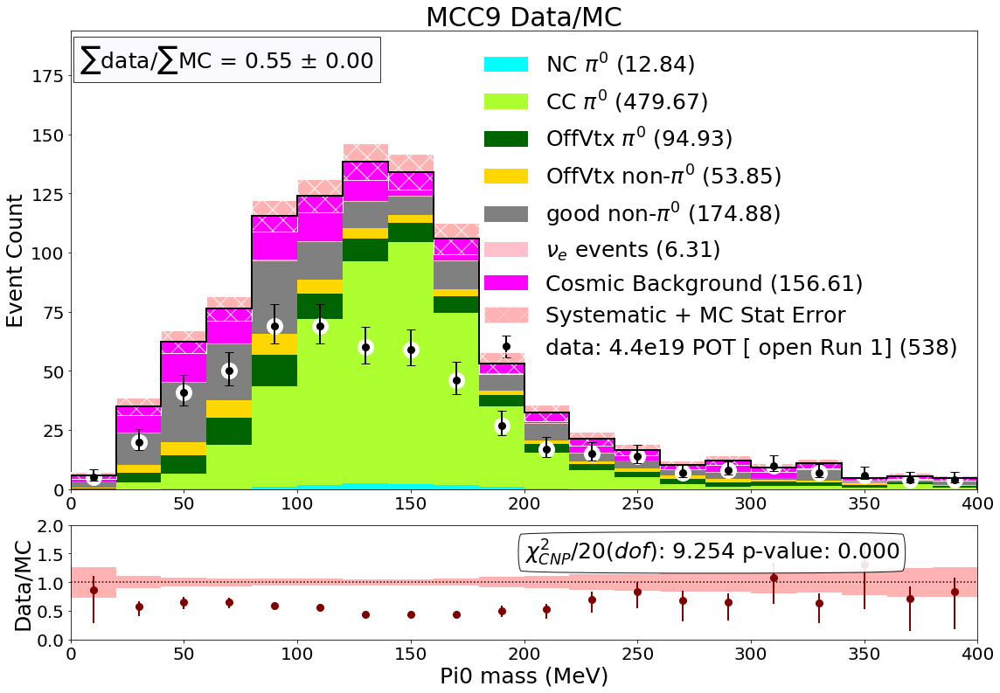

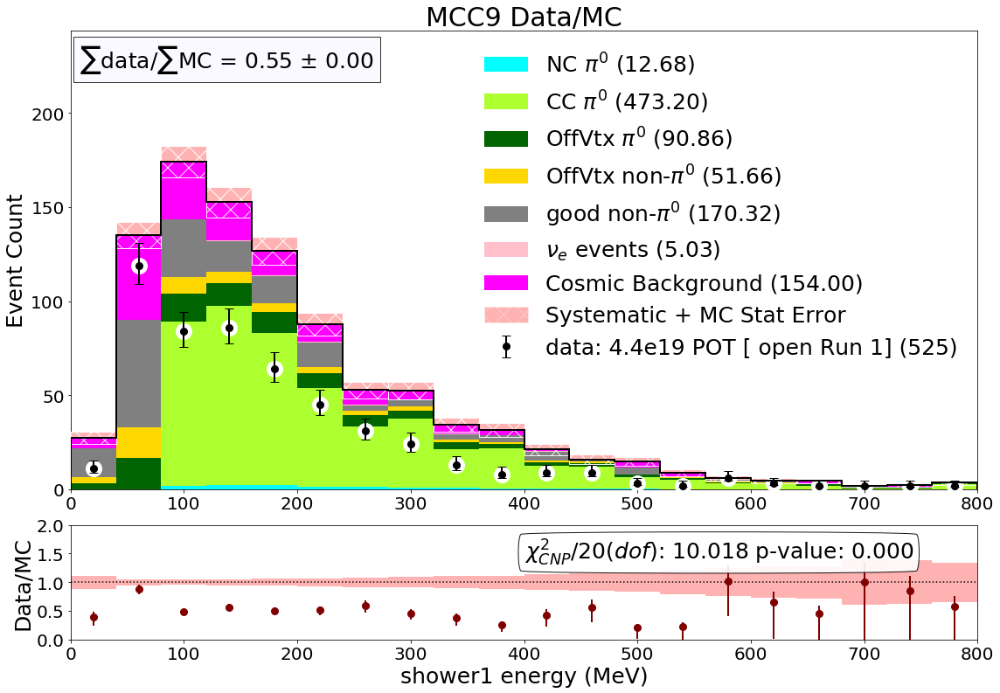

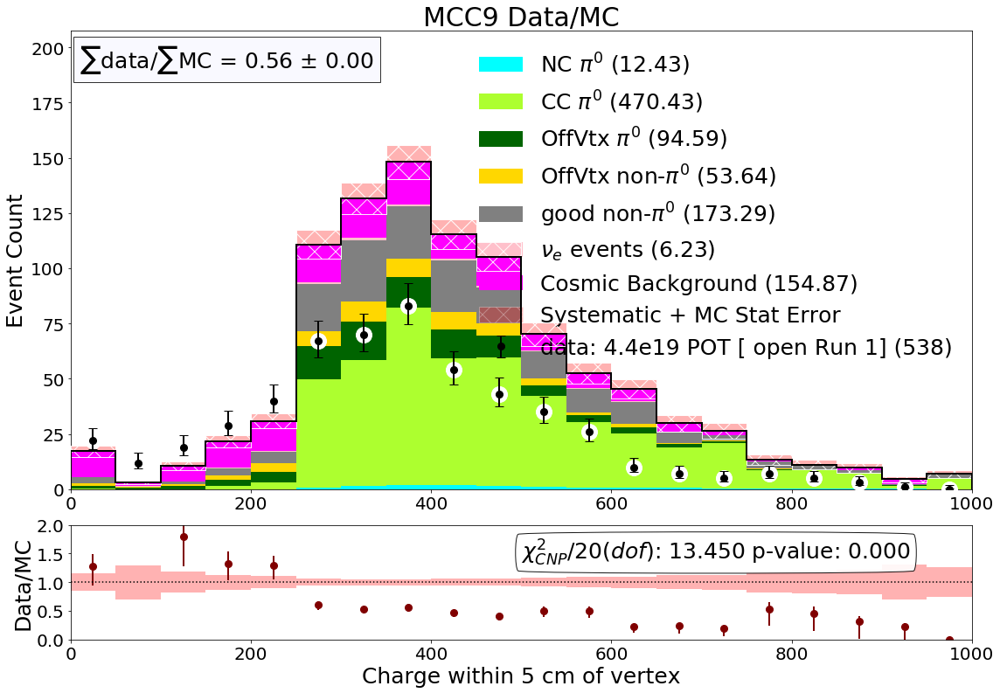

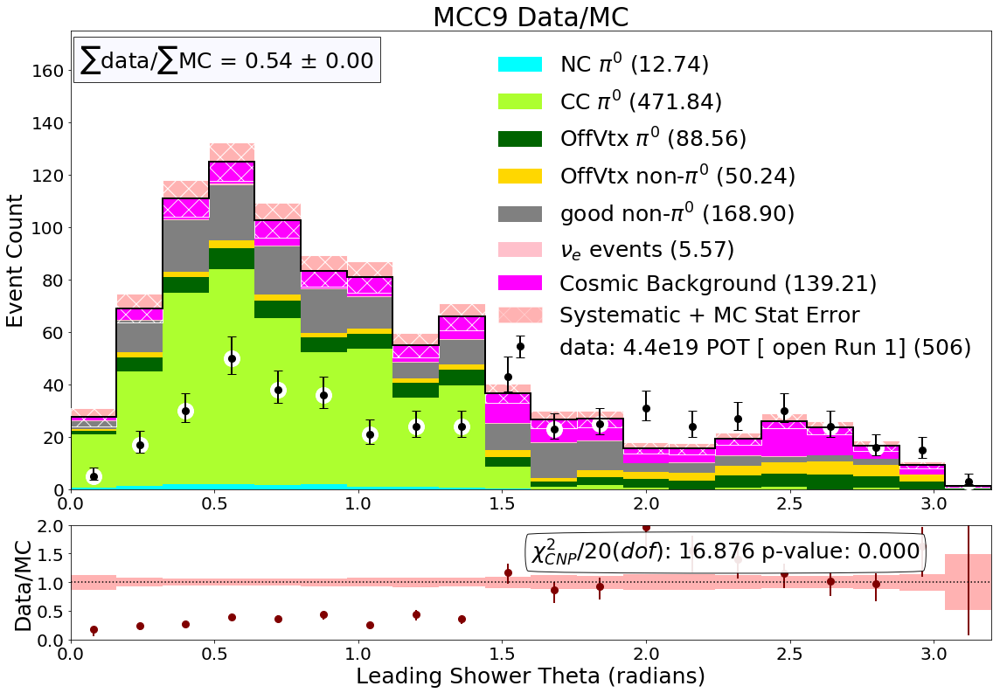

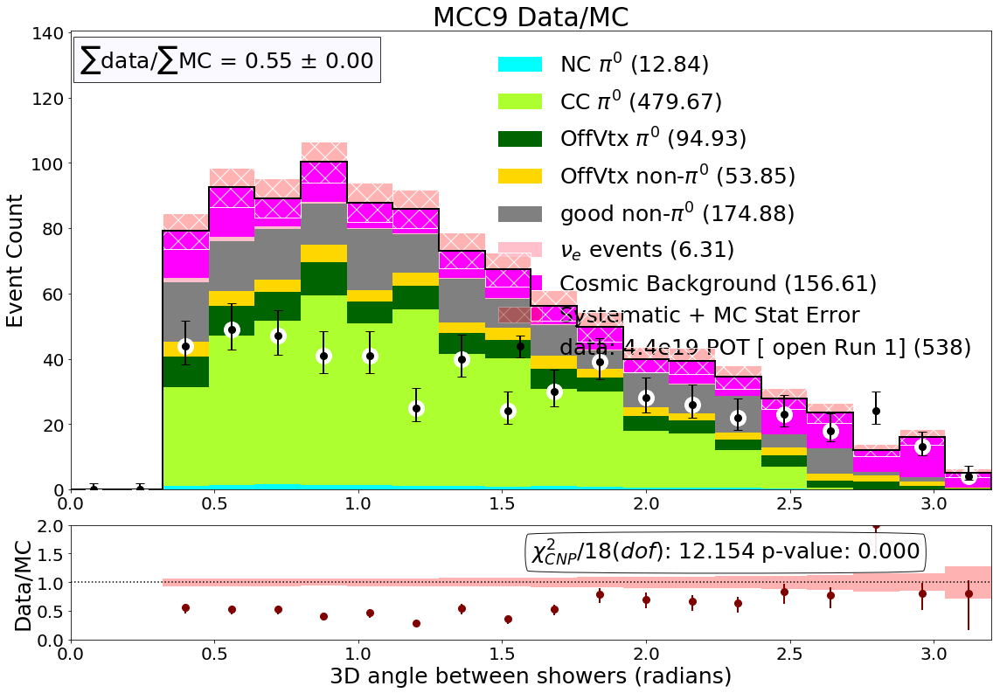

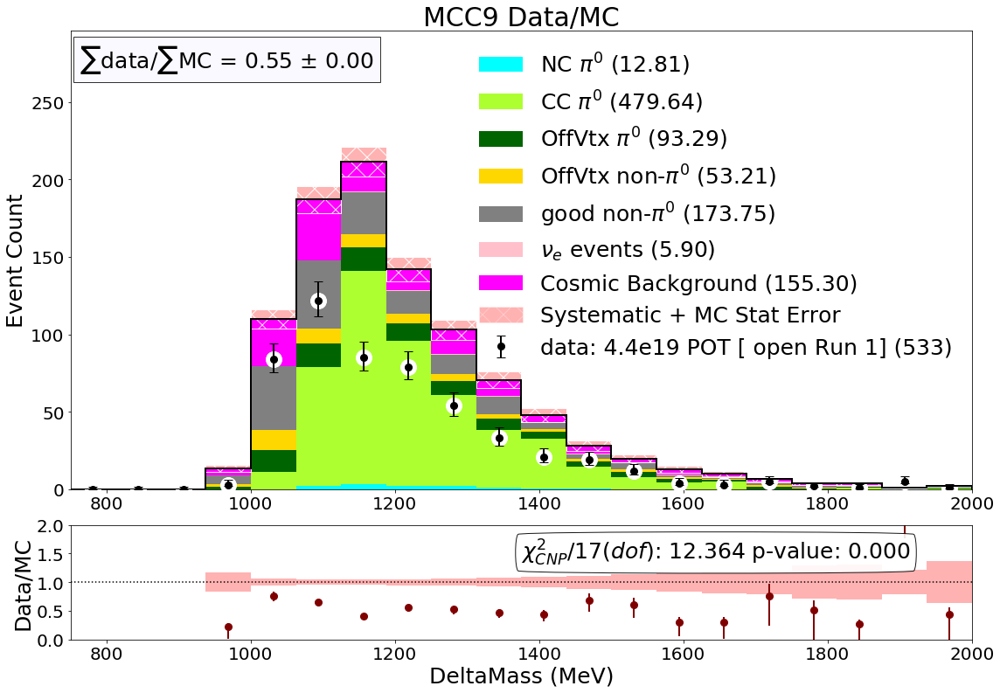

In [15]:
norm = 1.0
with PdfPages('output_preselection_210512.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]
        cov = np.zeros((nbins,nbins))
        
        run1_open_Hists = StackedHisto((df_bnb_ncpi0_pre,df_bnb_ccpi0_pre,df_bnb_ncpi0_offvtx_pre,df_bnb_ccpi0_offvtx_pre,df_bnb_other_offvtx_pre,df_bnb_other_good_pre,df_nue_pre),(NCPI0_R1_OPEN_SCALE*norm,NUMU_R1_OPEN_SCALE*norm,CCPI0_R1_OPEN_SCALE*norm,NCPI0_R1_OPEN_SCALE*norm,CCPI0_R1_OPEN_SCALE*norm,NUMU_R1_OPEN_SCALE*norm,NUE_R1_OPEN_SCALE*norm))
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_open_Hists.AddStrata(' MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run1_open_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run1_open_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run1_open_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run1_open_Hists.AddLayer(df_ext_pre,EXT_R1_OPEN_SCALE*norm,0,'Cosmic Background','fuchsia')
        run1_open_DataHist = SimpleHisto(df_data_r1_open_pre,1.0,0,'','data: 4.4e19 POT [ open Run 1]')
        fig1,ax1,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_open_Hists,run1_open_DataHist,varname,m_cov=cov)

In [16]:
# plot all of the seperate pi0  distributions
vartest_list = []
varname_list = []
myrange_list = []
detvar_list  = []
sys_list = []
bins_list = []

vartest_list.append('_pi0mass')
varname_list.append('Pi0 mass (MeV)')
myrange_list.append((0.0,400.0))
# detvar_list.append('../systematics/detvar_pi0mass_cov.txt')
sys_list.append('none')
detvar_list.append('none')
bins_list.append(20)

vartest_list.append('DeltaMass_new')
varname_list.append('Delta mass (MeV)')
myrange_list.append((1000.0,1400.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(10)

vartest_list.append('pi0_energy_reco_new')
varname_list.append('Pi0 Energy (MeV)')
myrange_list.append((100.0,800.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)

vartest_list.append('pi0_momentum_reco_new')
varname_list.append('Pi0 Momentum (MeV)')
myrange_list.append((100.0,800.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)

vartest_list.append('shower1_E_Y_new')
varname_list.append('shower1 energy (MeV)')
myrange_list.append((80.0,450.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)

vartest_list.append('shower2_E_Y_new')
varname_list.append('shower2 energy (MeV)')
myrange_list.append((35.0,350.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)


In [17]:
# norm = 1.0
# with PdfPages('output_201109.pdf') as pdf:

#     for i in range(len(vartest_list)):
#         vartest = vartest_list[i]
#         varname = varname_list[i]
#         myrange = myrange_list[i]
#         nbins =bins_list[i]
#         s_cov = np.zeros((nbins,nbins))
#         if detvar_list[i] == 'none':
#             d_cov = np.zeros((nbins,nbins))
#         else:
#             d_cov = np.genfromtxt(detvar_list[i],delimiter=',')


#         cov = np.zeros((nbins,nbins))
#         run1_pi0filter_Hists = StackedHisto((df_bnb_ncpi0,df_bnb_ccpi0,df_bnb_ncpi0_offvtx,df_bnb_ccpi0_offvtx,df_bnb_other_offvtx,df_bnb_other_good,df_nue_pi0),(NCPI0_R1_PI0FILTER_SCALE*norm,CCPI0_R1_PI0FILTER_SCALE*norm,NCPI0_R1_PI0FILTER_SCALE*norm,CCPI0_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUE_R1_PI0FILTER_SCALE*norm))
#         run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
#         run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
#         run1_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr>=5 ',r"OffVtx NC$\pi^0$",'darkblue')
#         run1_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==0 and MC_scedr>=5 ',r"OffVtx CC$\pi^0$",'darkgreen')
#         run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
#         run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
#         run1_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
#         run1_pi0filter_Hists.AddLayer(df_ext_pi0,EXT_R1_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
#         run1_pi0filter_DataHist = SimpleHisto(df_data_r1_pi0filter_pi0,1.0,0,'','data: 1.7e20 POT [ pi0filter Run 1]')
#         fig3,ax3,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_pi0filter_Hists,run1_pi0filter_DataHist,varname,m_cov=cov)

# #         cov = np.zeros((nbins,nbins))
# #         run2D_pi0filter_Hists = StackedHisto((df_bnb_ncpi0_r2,df_bnb_ccpi0_r2,df_bnb_pi0_offvtx_r2,df_bnb_other_offvtx_r2,df_bnb_other_good_r2,df_nue_r2_pi0),(NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUE_R2D_PI0FILTER_SCALE*norm))
# #         run2D_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
# #         run2D_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
# #         run2D_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
# #         run2D_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
# #         run2D_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
# #         run2D_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
# #         run2D_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R2D_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
# #         run2D_pi0filter_DataHist = SimpleHisto(df_data_r2D_pi0filter_pi0,1.0,0,'','data: 2.05e20 POT [ pi0filter Run 2D]')
# #         fig4,ax4,_,a = distplot_wratio_davio(vartest,nbins,myrange,run2D_pi0filter_Hists,run2D_pi0filter_DataHist,varname,m_cov=cov)
        
# #         cov = np.zeros((nbins,nbins))
# #         run2E_pi0filter_Hists = StackedHisto((df_bnb_ncpi0_r2,df_bnb_ccpi0_r2,df_bnb_pi0_offvtx_r2,df_bnb_other_offvtx_r2,df_bnb_other_good_r2,df_nue_r2_pi0),(NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUE_R2E_PI0FILTER_SCALE*norm))
# #         run2E_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
# #         run2E_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
# #         run2E_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
# #         run2E_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
# #         run2E_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
# #         run2E_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
# #         run2E_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R2E_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
# #         run2E_pi0filter_DataHist = SimpleHisto(df_data_r2E_pi0filter_pi0,1.0,0,'','data: 6.51e19 POT [ pi0filter Run 2E]')
# #         fig5,ax5,_,a = distplot_wratio_davio(vartest,nbins,myrange,run2E_pi0filter_Hists,run2E_pi0filter_DataHist,varname,m_cov=cov)

# #         cov = np.zeros((nbins,nbins))
# #         run3F_pi0filter_Hists = StackedHisto((df_bnb_ncpi0_r3,df_bnb_ccpi0_r3,df_bnb_pi0_offvtx_r3,df_bnb_other_offvtx_r3,df_bnb_other_good_r3,df_nue_r3_pi0),(NUMU_R3F_PI0FILTER_SCALE*norm,NUMU_R3F_PI0FILTER_SCALE*norm,NUMU_R3F_PI0FILTER_SCALE*norm,NUMU_R3F_PI0FILTER_SCALE*norm,NUMU_R3F_PI0FILTER_SCALE*norm,NUE_R3F_PI0FILTER_SCALE*norm))
# #         run3F_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
# #         run3F_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
# #         run3F_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
# #         run3F_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
# #         run3F_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
# #         run3F_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
# #         run3F_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R3F_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
# #         run3F_pi0filter_DataHist = SimpleHisto(df_data_r3F_pi0filter_pi0,1.0,0,'','data: 4.3e19 POT [ pi0filter Run 3F]')
# #         fig6,ax6,_,a = distplot_wratio_davio(vartest,nbins,myrange,run3F_pi0filter_Hists,run3F_pi0filter_DataHist,varname,m_cov=cov)

#         cov = np.zeros((nbins,nbins))
#         run3G_pi0filter_Hists = StackedHisto((df_bnb_ncpi0_r3,df_bnb_ccpi0_r3,df_bnb_ccpi0_offvtx_r3,df_bnb_ccpi0_offvtx_r3df_bnb_other_offvtx_r3,df_bnb_other_good_r3,df_nue_r3_pi0),(NUMU_R3G_PI0FILTER_SCALE*norm,NUMU_R3G_PI0FILTER_SCALE*norm,NUMU_R3G_PI0FILTER_SCALE*norm,NUMU_R3G_PI0FILTER_SCALE*norm,NUMU_R3G_PI0FILTER_SCALE*norm,NUE_R3G_PI0FILTER_SCALE*norm))
#         run3G_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
#         run3G_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
#         run3G_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
#         run3G_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
#         run3G_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
#         run3G_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
#         run3G_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R3G_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
#         run3G_pi0filter_DataHist = SimpleHisto(df_data_r3G_pi0filter_pi0,1.0,0,'','data: 2e20 [ pi0filter Run 3G]')
#         fig7,ax7,_,a = distplot_wratio_davio(vartest,nbins,myrange,run3G_pi0filter_Hists,run3G_pi0filter_DataHist,varname,m_cov=cov)
        
#         #save to pdf file of plots
#         pdf.savefig(fig1)
#         pdf.savefig(fig3)
#         pdf.savefig(fig4)
#         pdf.savefig(fig5)
# #         pdf.savefig(fig6)
# #         pdf.savefig(fig7)

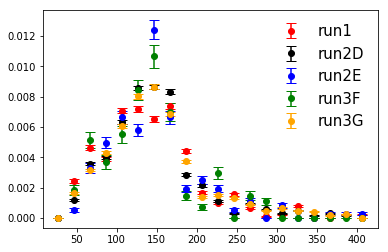

In [18]:
# Make data plots, normalized
# checking to see if any bins look realyl off
var_r1 = df_data_r1_pi0filter_pi0["_pi0mass_new"].values
var_r2D = df_data_r2D_pi0filter_pi0["_pi0mass_new"].values
var_r2E = df_data_r2E_pi0filter_pi0["_pi0mass_new"].values
var_r3F = df_data_r3F_pi0filter_pi0["_pi0mass_new"].values
var_r3G = df_data_r3G_pi0filter_pi0["_pi0mass_new"].values

# turn into histograms
r1_Hist,binedges = np.histogram( var_r1, bins = 20, range = [0,400],density = True)
bincenters = np.ones(len(binedges)-1)
for i in range(len(binedges)-1):
    bincenters[i] = binedges[i]+(400.0/15.0)
    
r2D_Hist,_ = np.histogram( var_r2D, bins = 20, range = [0,400],density = True)
r2E_Hist,_ = np.histogram( var_r2E, bins = 20, range = [0,400],density = True)
r3F_Hist,_ = np.histogram( var_r3F, bins = 20, range = [0,400],density = True)
r3G_Hist,_ = np.histogram( var_r3G, bins = 20, range = [0,400],density = True)

err_1 = [sqrt(float(i))/float(len(var_r1)) for i in r1_Hist]
err_2d = [sqrt(float(i))/float(len(var_r2D)) for i in r2D_Hist]
err_2e = [sqrt(float(i))/float(len(var_r2E)) for i in r2E_Hist]
err_3f = [sqrt(float(i))/float(len(var_r3F)) for i in r3F_Hist]
err_3g = [sqrt(float(i))/float(len(var_r3G)) for i in r3G_Hist]


plt.errorbar(bincenters,r1_Hist, yerr=err_1,  fmt='o', color = 'red', ecolor='red', capsize=5,label = 'run1')
plt.errorbar(bincenters,r2D_Hist, yerr=err_2d,  fmt='o', color = 'black', ecolor='black', capsize=5,label = 'run2D')
plt.errorbar(bincenters,r2E_Hist, yerr=err_2e,  fmt='o', color = 'blue', ecolor='blue', capsize=5,label = 'run2E')
plt.errorbar(bincenters,r3F_Hist, yerr=err_3f,  fmt='o', color = 'green', ecolor='green', capsize=5,label = 'run3F')
plt.errorbar(bincenters,r3G_Hist, yerr=err_3g,  fmt='o', color = 'orange', ecolor='orange', capsize=5,label = 'run3G')

plt.legend(loc='upper right',fontsize=15,frameon=False,ncol=1)
plt.show()
plt.close()

# Make "DPF plots"

In [19]:
# # list of variables to plot:
# vars = ['Xreco','Yreco','Zreco','OpenAng','Thetas','Phis','ChargeNearTrunk','Enu_1e1p','PhiT_1e1p','AlphaT_1e1p','PT_1e1p','PTRat_1e1p','BjXB_1e1p','BjYB_1e1p','Q2_1e1p','SphB_1e1p','Q0_1e1p','Q3_1e1p','Lepton_PhiReco','Lepton_ThetaReco','Lepton_TrackLength','Muon_Edep','Proton_PhiReco','Proton_ThetaReco','Proton_TrackLength','Proton_Edep','Proton_CosTheta','Lepton_CosTheta']
# # list of ranges
# ranges = [(15,241.25),(-101.5,101.),(15,1021.8),(.6,2.8),(0,6.3),(1.5,4),(0,600),(200,1200),(0,1),(0,np.pi),(0,320),(0,1),(0,1.8),(0.05,.75),(0,6e5),(0,1200),(70,600),(200,1000),(-np.pi,np.pi),(.2,2.8),(20,200),(50,600),(-np.pi,np.pi),(0,2),(5,100),(50,500),(-1,1),(-1,1),]
# print(vars)
# print(ranges)
# nbins =20

# for i in range(len(vars)):
#     vartest = vars[i]
#     varname = vars[i]
#     myrange = ranges[i]
#     norm = len(df_data_r1_pi0filter_pi0)/(len(df_numu_pi0)*NUMU_R1_PI0FILTER_SCALE+ len(df_nue_pi0)*NUE_R1_PI0FILTER_SCALE +len(df_ext_pi0)*EXT_R1_PI0FILTER_SCALE)
#     print("Norm", norm)
#     run1Hists = StackedHisto((df_bnb_ncpi0,df_bnb_ccpi0,df_bnb_pi0_offvtx,df_bnb_other_offvtx,df_bnb_other_good,df_nue_pi0),(NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUE_R1_PI0FILTER_SCALE*norm))
#     run1Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
#     run1Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
#     run1Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
#     run1Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
#     run1Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
#     run1Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
#     run1Hists.AddLayer(df_ext_pi0,EXT_R1_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
#     run1DataHist = SimpleHisto(df_data_r1_pi0filter_pi0,1.0,0,'','data: 1.7e20 POT [Run 1]')
#     cov = np.zeros((nbins,nbins))
#     fig,ax0,_ ,a= distplot_wratio_davio(vartest,nbins,myrange,run1Hists,run1DataHist,varname,m_cov=cov)

# Start of combined plots...

In [20]:
# add all of the data frames
# df_data_total = df_fakedata1_run1_pi0.append(df_fakedata1_run3_pi0)
df_data_total_1 = df_data_r1_pi0filter_pi0.append(df_data_r2D_pi0filter_pi0)
df_data_total_2 = df_data_total_1.append(df_data_r2E_pi0filter_pi0)
df_data_total_3 = df_data_total_2.append(df_data_r3F_pi0filter_pi0)
df_data_total = df_data_total_3.append(df_data_r3G_pi0filter_pi0)

print("total number of data pi0: ",len(df_data_total['_pi0mass'].values))
# scale CV weights:
def potscale(df,scalefactor=1.0,ext=False):
    pot_weight = []
    for i in range(len(df)):
        if ext==False:
            pot_weight.append(scalefactor)
        else:
            pot_weight.append(scalefactor)
    return pot_weight

# general mc
w_mu_1 =potscale(df_numu_pi0,DATA_R1_PI0FILTER_POT/NUMU_R1_POT)
w_mu_1_1mil =potscale(df_numu_1mil_pi0,DATA_R1_PI0FILTER_POT/NUMU_R1_1MIL_POT)
w_mu_2 =potscale(df_numu_r2_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/NUMU_R2_POT)
w_mu_2_1mil =potscale(df_numu_r2_1mil_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/NUMU_R2_1MIL_POT)
w_mu_3 =potscale(df_numu_r3_pi0,(DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)/NUMU_R3_POT)
df_numu_pi0['pot_weight'] = w_mu_1
df_numu_1mil_pi0['pot_weight'] = w_mu_1_1mil
df_numu_r2_pi0['pot_weight'] = w_mu_2
df_numu_r2_1mil_pi0['pot_weight'] = w_mu_2_1mil
df_numu_r3_pi0['pot_weight'] = w_mu_3

# df_numu_total_1 = df_numu_pi0.append(df_numu_r2_pi0)
df_numu_total_1 = df_numu_1mil_pi0.append(df_numu_r2_1mil_pi0)
df_numu_total = df_numu_total_1.append(df_numu_r3_pi0)

w_e_1 =potscale(df_nue_pi0,DATA_R1_PI0FILTER_POT/NUE_R1_POT)
w_e_2 =potscale(df_nue_r2_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/NUE_R2_POT)
w_e_3 =potscale(df_nue_r3_pi0,(DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)/NUE_R3_POT)
df_nue_pi0['pot_weight'] = w_e_1
df_nue_r2_pi0['pot_weight'] = w_e_2
df_nue_r3_pi0['pot_weight'] = w_e_3
df_nue_total_1 = df_nue_pi0.append(df_nue_r2_pi0)
df_nue_total = df_nue_total_1.append(df_nue_r3_pi0)
print('xsec_corr_weight' in df_nue_total.keys())


df_ext_r3_2_pi0 = df_ext_r3_pi0
df_ext_r3_3_pi0 = df_ext_r3_pi0
w_ext_1 =potscale(df_ext_pi0,DATA_R1_PI0FILTER_POT/EXT_R1_PI0FILTER_POT,True)
w_ext_2 =potscale(df_ext_r3_2_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/(EXT_R2D_PI0FILTER_POT+EXT_R2E_PI0FILTER_POT),True)
w_ext_3 =potscale(df_ext_r3_3_pi0,(DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)/(EXT_R3F_PI0FILTER_POT+EXT_R3G_PI0FILTER_POT),True)
df_ext_pi0['pot_weight'] = w_ext_1
df_ext_r3_2_pi0['pot_weight'] = w_ext_2
df_ext_r3_2_pi0['pot_weight'] = w_ext_3
df_ext_total_1 = df_ext_pi0.append(df_ext_r3_2_pi0)
df_ext_total = df_ext_total_1.append(df_ext_r3_3_pi0)

# df_bnb_ncpi0_r2 = df_numu_r2_pi0.query('haspi0==1 and ccnc==1 and MC_scedr<5 and MC_parentPDG ==14')
# df_bnb_ccpi0_r2 = df_numu_r2_pi0.query("haspi0==1 and ccnc!=1 and MC_scedr<5 and MC_parentPDG ==14")

# df_bnb_offvtx_pi0_r2 = df_numu_r2_pi0.query("haspi0==1 and  MC_scedr>=5 and MC_parentPDG ==14")
# w_off_2 =potscale(df_bnb_offvtx_pi0_r2,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/NUMU_R2_POT)
# df_bnb_offvtx_pi0_r2['pot_weight'] = w_off_2

w_cc_1 =potscale(df_ccpi0_r1_pi0,DATA_R1_PI0FILTER_POT/CCPI0_R1_POT)
w_cc_3 =potscale(df_ccpi0_r3_pi0,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(CCPI0_R3_POT))
w_cc_2 =potscale(df_ccpi0_r3_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/(CCPI0_R3_POT))
df_ccpi0_r1_pi0['pot_weight'] = w_cc_1
df_ccpi0_r3_pi0['pot_weight'] = w_cc_3
df_ccpi0_r2_pi0 = df_ccpi0_r3_pi0
df_ccpi0_r2_pi0['pot_weight'] = w_cc_2
df_ccpi0_total1 = df_ccpi0_r1_pi0.append(df_ccpi0_r2_pi0)
df_ccpi0_total = df_ccpi0_total1.append(df_ccpi0_r3_pi0)

w_nc_1 =potscale(df_ncpi0_r1_pi0,DATA_R1_PI0FILTER_POT/NCPI0_R1_POT)
w_nc_3 =potscale(df_ncpi0_r3_pi0,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT))
w_nc_2 =potscale(df_ncpi0_r3_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT))
df_ncpi0_r1_pi0['pot_weight'] = w_nc_1
df_ncpi0_r3_pi0['pot_weight'] = w_nc_3
df_ncpi0_r2_pi0 = df_ncpi0_r3_pi0
df_ncpi0_r2_pi0['pot_weight'] = w_nc_2
df_ncpi0_total1 = df_ncpi0_r1_pi0.append(df_ncpi0_r2_pi0)
df_ncpi0_total = df_ncpi0_total1.append(df_ncpi0_r3_pi0)

n=float(len(df_numu_total.query('newhaspi0==1') ))
print(sqrt(n)/n)
a = float(len(df_ncpi0_total)+len(df_ccpi0_total))
print(sqrt(a))
print(abs((234+1028+462)-(242+1039+472))/(234+1028+462))
                 
# tot1 = 0
# for i in range(len(df_numu_total)):
#     tot1+=df_numu_total['pot_weight'].values[i]*df_numu_total['xsec_corr_weight'].values[i]
# tot2 = 0
# for i in range(len(df_nue_total)):
#     tot2+=df_nue_total['pot_weight'].values[i]*df_nue_total['xsec_corr_weight'].values[i]
# print(tot1+tot2)
# tot3 = 0
# for i in range(len(df_ext_total)):
#     tot3+=df_ext_total['pot_weight'].values[i]
# print(tot3)


# # #specific categories
# df_bnb_ncpi0_total = df_numu_total.query('MC_parentPDG ==14 and haspi0==1 and ccnc==1 and MC_scedr<5 ')
# tot4 = 0
# for i in range(len(df_bnb_ncpi0_total)):
#     tot4+=df_bnb_ncpi0_total['pot_weight'].values[i]*df_bnb_ncpi0_total['xsec_corr_weight'].values[i]
# print(tot4)
                 
# df_bnb_ccpi0_total = df_ccpi0_total.query(" MC_scedr<5 ") 
# df_bnb_ncpi0_total = df_ncpi0_total.query(" MC_scedr<5 ") 
# df_bnb_ccpi0_offvtx_total = df_ccpi0_total.query("MC_scedr>=5 ") 
# df_bnb_ncpi0_offvtx_total = df_ncpi0_total.query("MC_scedr>=5 ") 
# df_bnb_other_offvtx_total = df_numu_total.query("haspi0==0 and MC_scedr>=5 ")
# df_bnb_other_good_total = df_numu_total.query("haspi0==0 and MC_scedr<5")



# print(df_numu_pi0['xsec_corr_weight'].values)

total number of data pi0:  2016


/home/kmason/.local/lib/python3.5/site-packages/pandas/core/frame.py:6692: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


True
0.011177545850247397
81.39410298049853
0.016821345707656612


In [21]:
NUMU_POT_TOTAL = NUMU_R1_1MIL_POT+NUMU_R2_1MIL_POT+NUMU_R3_POT
NUE_POT_TOTAL = NUE_R1_POT+NUE_R2_POT+NUE_R3_POT
EXT_POT_TOTAL = EXT_R1_PI0FILTER_POT+EXT_R2D_PI0FILTER_POT+EXT_R2E_PI0FILTER_POT+EXT_R3F_PI0FILTER_POT+EXT_R3G_PI0FILTER_POT
CCPI0_POT_TOTAL = CCPI0_R1_POT+CCPI0_R3_POT
NCPI0_POT_TOTAL = NCPI0_R1_POT+NCPI0_R3a_POT+NCPI0_R3b_POT

# DATA_POT_TOTAL = FAKE_DATA_1_RUN1_POT + FAKE_DATA_1_RUN3_POT
DATA_POT_TOTAL = DATA_R1_PI0FILTER_POT+ DATA_R2D_PI0FILTER_POT+ DATA_R2E_PI0FILTER_POT+ DATA_R3F_PI0FILTER_POT+ DATA_R3G_PI0FILTER_POT
DATA_R2_POT_TOTAL = DATA_R2D_PI0FILTER_POT+ DATA_R2E_PI0FILTER_POT
print("pot total:",DATA_POT_TOTAL)
POT_SCALE_FACTOR = DATA_POT_TOTAL
NUMU_SCALE_TOTAL = POT_SCALE_FACTOR / float(NUMU_POT_TOTAL)
NUE_SCALE_TOTAL = POT_SCALE_FACTOR / float(NUE_POT_TOTAL)
CCPI0_SCALE_TOTAL =POT_SCALE_FACTOR / float(CCPI0_POT_TOTAL)
NCPI0_SCALE_TOTAL = POT_SCALE_FACTOR / float(NCPI0_POT_TOTAL)
EXT_SCALE_TOTAL = POT_SCALE_FACTOR / float(EXT_POT_TOTAL)
DATA_SCALE_TOTAL = POT_SCALE_FACTOR / float(DATA_POT_TOTAL)
print(CCPI0_SCALE_TOTAL)

# make some lists of bin values:
numu_test=df_numu_total.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14')
var_numu=numu_test['_pi0mass_new'].values
weights_numu =[numu_test['pot_weight'].values[i]*numu_test['xsec_corr_weight'].values[i] for i in range(len(var_numu))]
numu_Hist,_ = np.histogram( var_numu, bins = 20, range = [30,300],weights=weights_numu)

nue_test=df_nue_total.query('MC_parentPDG ==12')
var_nue=nue_test['_pi0mass_new'].values
weights_nue =[nue_test['pot_weight'].values[i]*nue_test['xsec_corr_weight'].values[i] for i in range(len(var_nue))]
nue_Hist,_ = np.histogram( var_nue, bins = 20, range = [30,300],weights=weights_nue)

ccpi0_test=df_ccpi0_total
var_ccpi0=ccpi0_test['_pi0mass_new'].values
weights_ccpi0 =[ccpi0_test['pot_weight'].values[i]*ccpi0_test['xsec_corr_weight'].values[i] for i in range(len(var_ccpi0))]
ccpi0_Hist,_ = np.histogram( var_ccpi0, bins = 20, range = [30,300],weights=weights_ccpi0)

ncpi0_test=df_ncpi0_total
var_ncpi0=ncpi0_test['_pi0mass_new'].values
weights_ncpi0 =[ncpi0_test['pot_weight'].values[i]*ncpi0_test['xsec_corr_weight'].values[i] for i in range(len(var_ncpi0))]
ncpi0_Hist,_ = np.histogram( var_ncpi0, bins = 20, range = [30,300],weights=weights_ncpi0)

ext_test=df_ext_total
var_ext=ext_test['_pi0mass_new'].values
weights_ext =[ext_test['pot_weight'].values[i] for i in range(len(var_ext))]
ext_Hist,_ = np.histogram( var_ext, bins = 20, range = [30,300],weights=weights_ext)

data_test=df_data_total
var_data=data_test['_pi0mass_new'].values
data_Hist,_ = np.histogram( var_data, bins = 20, range = [30,300])

def GetErrorsData(xobs,CL=0.6827):
    step    = 0.01
    upperBoundary = int(max(10,xobs+5*np.sqrt(xobs)))
    r = np.arange(0.01,upperBoundary,step)
    s    = PmuGivenX(r,xobs)*step
    PDF1 = interp1d(r,s,bounds_error=False,fill_value=0)
    PPF1 = interp1d(np.cumsum(s),r)
    xobs_low  = float(PPF1((1-CL)/2))
    xobs_high = float(PPF1(1-(1-CL)/2))
    return xobs_low,xobs_high

errdatalow=[]
errdatahigh=[]

for i in range(20):
    elow,ehigh=GetErrorsData(data_Hist[i])
    errdatalow.append(data_Hist[i] -elow)
    errdatahigh.append(ehigh-data_Hist[i])

numu = []
ext = []
total = []

for i in range(20):
    numu.append(numu_Hist[i]+nue_Hist[i]+ccpi0_Hist[i]+ncpi0_Hist[i])
    ext.append(ext_Hist[i])
    total.append(numu_Hist[i]+nue_Hist[i]+ccpi0_Hist[i]+ncpi0_Hist[i]+ext_Hist[i])
    
print(numu,sum(numu))
print(ext,sum(ext))
print(total,sum(total))
print(data_Hist,sum(data_Hist))
print(errdatalow)
print(errdatahigh)

pot total: 6.8767e+20
0.5340889762550319
[47.117627448234586, 70.33873243614818, 97.63130750879412, 140.73932352853038, 170.88819438274447, 236.6686027974058, 246.10844757434342, 260.2470159715978, 256.70775776976325, 182.58945959384718, 95.72462997887123, 56.09886196174314, 47.130430195730824, 33.13246481561536, 24.365081153458775, 19.273660080235395, 11.609852448779272, 13.119085674046291, 10.70942173832437, 18.61509556203697] 2038.815052620251
[15.704271867078154, 17.568513285000126, 15.435796643523261, 24.741918586170843, 20.2230952266245, 28.470401422014792, 15.972747090633046, 13.034604778491506, 9.574597166202462, 12.512739478344, 7.978830971835386, 3.4600076122890466, 5.324249030211016, 5.0557738066561235, 7.188490448132985, 1.5957661943670773, 6.6515400010232, 1.5957661943670773, 1.5957661943670773, 1.5957661943670773] 215.2806421916988
[62.82189931531274, 87.9072457211483, 113.06710415231738, 165.48124211470122, 191.11128960936898, 265.1390042194206, 262.08119466497646, 273.2

In [22]:
# plot all of the seperate pi0  distributions
vartest_list = []
varname_list = []
myrange_list = []
detvar1_list  = []
detvar3_list  = []
sys_list = []
bins_list = []

vartest_list.append('_pi0mass_new')
varname_list.append(r'$\pi^0$ mass (MeV)')
myrange_list.append((30.0,350.0))
sys_list.append('../systematics/covar_cv_weighted__pi0_mass_reco.txt')
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys__pi0mass_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys__pi0mass_new_run3_cov.csv')
bins_list.append(20)

vartest_list.append('DeltaMass_new')
varname_list.append('Delta mass (MeV)')
myrange_list.append((1000,1400))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_DeltaMass_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_DeltaMass_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__Delta_mass_reco.txt')
bins_list.append(20)

vartest_list.append('pi0_energy_reco_new')
varname_list.append('Pi0 Energy (MeV)')
myrange_list.append((100.0,750.0))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_energy_reco_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_energy_reco_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__pi0_energy_reco.txt')
bins_list.append(20)

vartest_list.append('pi0_momentum_reco_new')
varname_list.append('Pi0 Momentum (MeV)')
myrange_list.append((100.0,700.0))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_momentum_reco_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_momentum_reco_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__pi0_momentum_reco.txt')
bins_list.append(20)

vartest_list.append('shower1_E_Y_new')
varname_list.append('Leading Shower E (MeV)')
myrange_list.append((80.0,450.0))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower1_E_Y_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower1_E_Y_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__shower1_energy_reco.txt')
bins_list.append(20)

vartest_list.append('shower2_E_Y_new')
varname_list.append('Sub-leading Shower E (MeV)')
myrange_list.append((35.0,300.0))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower2_E_Y_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower2_E_Y_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__shower2_energy_reco.txt')
bins_list.append(20)


vartest_list.append('MPID_muon')
varname_list.append('MPID muon score')
myrange_list.append((0,1))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_MPID_muon_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_MPID_muon_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__mpid_muon_score.txt')
bins_list.append(20)

vartest_list.append('Enu_1e1p')
varname_list.append('Reco Neutrino Energy (MeV)')
myrange_list.append((0,1200))
detvar1_list.append('none')
detvar3_list.append('none')
sys_list.append('none')
bins_list.append(20)


vartest_list.append('Proton_Edep')
varname_list.append('Reco Proton Energy (MeV)')
myrange_list.append((0,450))
detvar1_list.append('none')
detvar3_list.append('none')
sys_list.append('none')
bins_list.append(20)

vartest_list.append('Zreco')
varname_list.append(r'Z reco')
myrange_list.append((0.0,1000.0))
sys_list.append('none')
detvar1_list.append('none')
detvar3_list.append('none')
bins_list.append(20)

# 

782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
SUM 49.6870477922737
SUM 243.20883273021485
SUM 106.86938092810323
SUM 35.24839298037381
SUM 45.293265226425234
SUM 6.6361117047297595
SUM 87.61934664233257
histogram bins [18.33024485 28.39657302 35.57712618 55.83667603 66.49836929 72.22160975
 69.05123497 62.70081579 43.62064686 21.07688433 19.67637342  9.13024064
 11.29274109  5.28189576  3.91294214  3.56797067  3.99364163  1.27239428
  2.02543563  0.47921502]


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



Normalization Uncertainty: 0.0
yerr_mc_total [5.76043585 6.57639334 6.74379051 8.40767818 8.88117952 9.33134428
 8.45734184 7.91838467 7.48315623 4.5909568  5.4385621  3.02162881
 4.32653779 2.29823753 2.52751621 1.88890727 1.99840977 1.12800456
 1.423178   0.69225358]
yerr_data 87.25484543281341
ERROR HERE
[ 0.17312315  0.14820764  0.11637705  0.09683561  0.08744727  0.08000534
  0.08554849  0.0987703   0.11061574  0.17363045  0.08422959  0.24869399
  0.12771878  0.22051318  0.289914    0.08314127  0.15968528  1.3937776
 -0.0857621  -0.36247948]
[0.25777315 0.20747872 0.16737119 0.12945229 0.11555129 0.10571766
 0.11401619 0.13051335 0.15213273 0.26808029 0.17032644 0.46680442
 0.27117266 0.59785682 0.7070152  0.64381718 0.65928581 2.95927028
 0.92228432 3.89809883]
chi2 in bins
1.844120263943622 0.01208774025926207


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 102.02928637137833
SUM 422.1481036971761
SUM 205.00980132067048
SUM 71.85593467705685
SUM 75.53236393492294
SUM 22.027863452909227
SUM 75.47929069054904
histogram bins [ 33.3857605   46.38336321  76.82882913  98.63627302 119.12637222
 137.45213601 130.45796689 119.22224791  72.82960765  33.96997122
  21.1740369   18.95877962  16.32572274  12.69045793  12.55006938
   8.21861577   9.32988955   4.59388968   3.43351483   5.03584929]
Normalization Uncertainty: 0.0
yerr_mc_total [ 5.71158208  6.75424108  8.67765221  9.85439454 10.80905178 11.69138766
 11.37492593 10.88387143  8.49816069  5.78893918  4.58490117  4.31895165
  4.02156743  3.4755698   3.52098726  2.8400524   3.02938466  2.14333611
  1.81129697  2.2097808 ]
yerr_data 117.00636562317206
ERROR HERE
[0.12928314 0.12369722 0.08

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



789
1284
978
504
598
1319
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 91.48288129173561
SUM 390.2233740039454
SUM 172.33761277462193
SUM 52.44324274611965
SUM 59.67920153820309
SUM 9.489390696782293
SUM 65.42641396905016
histogram bins [ 25.33825644  42.91065051  65.64741911  77.73608217 111.99058227
 115.40389076 128.67373942 104.79546776  66.47531294  30.43615912
  21.71367472  15.35447231   9.59663875  10.79844847   6.08874493
   5.28115144   8.03632778   3.92044401   3.28795313   4.17028703]
Normalization Uncertainty: 0.0
yerr_mc_total [ 4.84988078  6.41043974  7.87487101  8.60826676 10.32181398 10.65771917
 11.23076406 10.14783499  8.06360854  5.4171959   4.62063764  3.82461857
  3.03862735  3.0569459   2.39277294  2.21760431  2.77000816  1.98001111
  1.71013759  1.95112902]
yerr_data 110.13597072303764
ERROR HERE
[0.19760383 0.13753473 0.09949958 0.0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
SUM 50.18876756595384
SUM 245.1376402437174
SUM 107.7140619886593
SUM 35.81193372199542
SUM 46.69150071949072
SUM 6.84393950131495
SUM 91.34782947817651
histogram bins [ 2.02398294  7.56713608 13.26845495 23.41189721 32.83321411 37.62438271
 37.62132799 51.70119063 45.01206182 37.3901216  32.6537539  38.04463207
 27.7935726  31.13003246 26.53818097 22.82243234 21.27906242 18.34137432
 18.85999959 15.47103304]
Normalization Uncertainty: 0.0
yerr_mc_total [2.12117397 3.53806843 4.268401   5.77178321 6.9054754  6.5249655
 6.13362275 7.68943293 7.41037422 6.11474624 6.13225456 6.92432064
 5.27196098 6.5959846  6.03653586 5.27003078 5.35772812 4.82619586
 4.87963029 4.23632259]
yerr_data 98.92829155622015
ERROR HERE
[0.10270865 0.24426947 0.2293488  0.11939341 0.13091234 0.11771046
 0.1322

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 103.0686567531517
SUM 423.8817076628923
SUM 207.31987882779225
SUM 72.47841588421447
SUM 79.08875069719217
SUM 22.33856173110795
SUM 75.47929069054905
histogram bins [ 1.5903207   8.36081211 20.36664545 39.3495305  58.51653386 69.54608382
 76.49399721 77.7275231  85.55707539 70.81216958 77.74849058 64.36879792
 57.83886239 47.9798646  50.41313641 42.85128025 44.22610821 35.15757586
 30.22124739 31.04991621]
Normalization Uncertainty: 0.0
yerr_mc_total [1.19900066 2.86497713 4.44474667 6.24852737 7.58948121 8.29352116
 8.71109205 8.76420072 9.18342694 8.37862143 8.75668109 8.01349361
 7.54470368 6.90466714 7.05707191 6.49926209 6.61573532 5.85160381
 5.45555616 5.50330133]
yerr_data 129.6898065788558
ERROR HERE
[0.60852954 0.32622535 0.18253622 0.12484635 0.11815884 0.1019057
 0.0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



789
1284
978
504
598
1319
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 92.13218637946264
SUM 392.35184421340927
SUM 176.63603270034162
SUM 52.751373409908005
SUM 62.253813562902096
SUM 9.884840652906126
SUM 65.42641396905017
histogram bins [ 2.30133199  8.24650526 20.74761444 30.99475429 46.54925924 64.99145102
 60.66883928 79.39172206 70.5179703  63.69389306 61.0138615  58.77996689
 48.03195871 44.69204223 49.3406176  39.33458686 32.09893485 34.43819629
 26.46338686 25.71319818]
Normalization Uncertainty: 0.0
yerr_mc_total [1.39210252 2.80768992 4.39250318 5.50163514 6.66100322 7.9482412
 7.69514841 8.78700328 8.22258535 7.88925616 7.64657986 7.64307427
 6.77138563 6.63063173 6.92004966 6.15475886 5.56855342 5.67960394
 5.03718564 4.88838269]
yerr_data 122.38181552380156
ERROR HERE
[0.43795719 0.28226334 0.18353788 0.14849935 0.14409494 0.09787628
 0.10689

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
SUM 49.637288879591715
SUM 241.8531046714481
SUM 107.08990485204535
SUM 35.81193372199541
SUM 46.26206341740881
SUM 6.463403621165671
SUM 91.34782947817651
histogram bins [13.24977536 60.87309626 76.34135194 72.34567877 61.89504496 60.74178021
 48.37193682 35.68619687 24.37180137 21.4928431  14.93733727 14.05122949
  9.72834933  6.66877521  4.79301595  3.46398163  3.21583032  1.03412034
  1.20911162  1.64644235]
Normalization Uncertainty: 0.0
yerr_mc_total [4.81158598 9.2534889  9.67828107 9.33798989 8.61812191 8.40496071
 7.30224136 6.75187242 4.93678047 5.14233753 3.86488516 4.35913083
 3.49338595 3.02393308 2.18929577 2.43708385 1.79327363 1.01691707
 1.09959612 1.2831377 ]
yerr_data 86.7674986226476
ERROR HERE
[0.17734604 0.09107011 0.09827802 0.10514561 0.09032773 0.07752663
 0.0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 102.44503452408767
SUM 420.21903975670773
SUM 205.46297340754668
SUM 72.0671079141017
SUM 78.54163599364519
SUM 21.48589357114936
SUM 77.32024900007464
histogram bins [ 22.03850904 104.33983253 139.37540141 147.67104032 116.00906157
 102.15800351  70.6116424   62.07641796  54.85740749  39.867432
  35.22457163  20.51683441  18.76107082  14.37953796  11.4624092
   8.03982919   5.98523558   4.73670233   3.21078564   2.89996019]
Normalization Uncertainty: 0.0
yerr_mc_total [ 4.66187439 10.12458468 11.69526371 12.07635801 10.69962057 10.04670386
  8.35751469  7.85945174  7.37558493  6.27768091  5.89630539  4.51266177
  4.31373999  3.79203612  3.34020553  2.78107766  2.44647411  2.17639664
  1.79186652  1.65748064]
yerr_data 116.26435368925944
ERROR HERE
[0.19492305 0.08933373 0.074974

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



789
1284
978
504
598
1319
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 90.66967266994058
SUM 389.4997737926819
SUM 174.91446438361874
SUM 52.043127639721476
SUM 61.71428001953382
SUM 9.23640767921449
SUM 67.02218016341725
histogram bins [ 17.9285963   86.43897975 123.88728303 113.47885825 110.54881492
 100.83949539  69.53094375  52.50280596  43.71751111  40.49574911
  28.16841744  18.57175532  13.87129314   8.50342475   9.31302699
   9.51475382   4.4188484    4.36552189   4.05232412   1.92932273]
Normalization Uncertainty: 0.0
yerr_mc_total [ 4.14750903  9.05971241 10.84941378 10.44596896 10.33997047  9.89608179
  8.22885356  7.19555702  6.52896343  6.27738811  5.20367848  4.26712699
  3.67531095  2.91606323  2.93023239  2.9644542   2.10210571  2.08938314
  2.01303853  1.25137531]
yerr_data 108.70088620571222
ERROR HERE
[ 0.18305746  0.10086905  0.08217919 

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
SUM 47.23233848341542
SUM 226.47246403817738
SUM 97.6683435508508
SUM 32.802616267179246
SUM 43.4336848626895
SUM 6.350809704500298
SUM 80.16238097064468
histogram bins [53.35654925 75.22571264 60.03783165 57.34009889 54.859164   39.93146701
 35.69081984 26.74600546 21.88293541 15.67946307 14.69576934  8.81201951
 11.08153023  6.50851883  3.84482876  5.13907768  2.14514875  1.71635739
  0.82082068  1.44613852]
Normalization Uncertainty: 0.0
yerr_mc_total [8.1076217  9.62047219 8.65391287 8.20010263 8.6407368  6.6994223
 6.17788118 5.6299909  5.41379013 3.95973018 4.14381049 2.96850459
 4.00403826 2.99731795 1.96082349 2.75943359 1.46463263 1.31009824
 0.90599154 1.202555  ]
yerr_data 83.96808417064936
ERROR HERE
[0.11440982 0.08593254 0.11454037 0.11068742 0.07498805 0.09039395
 0.119

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 97.20198625949382
SUM 395.2738184787752
SUM 192.98061430380065
SUM 62.576848970910284
SUM 72.41699988470782
SUM 21.053424979552233
SUM 70.87689491673507
histogram bins [109.01437047 124.39651901 129.50961129 104.88493605  85.94629752
  70.08138676  55.00501494  53.33021999  39.99094179  32.54322948
  28.84422759  19.69744348  15.94056955  15.83324005   9.78251088
   6.69026027   5.05053767   5.27771627   4.32593688   2.35872294]
Normalization Uncertainty: 0.0
yerr_mc_total [10.36023509 11.057055   11.27236095 10.17400968  9.26248236  8.31655445
  7.36487775  7.28181184  6.29964329  5.66436891  5.32785822  4.42094168
  3.97339294  3.95986388  3.12770057  2.52682093  2.24734013  2.29732807
  2.07988867  1.53581344]
yerr_data 112.82940404631447
ERROR HERE
[0.0798179  0.07570458 0.07

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



789
1284
978
504
598
1319
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 85.62231137273804
SUM 369.2892128764915
SUM 165.60141819806105
SUM 45.93141021749227
SUM 57.25742492164076
SUM 8.753895113475217
SUM 61.43699848313247
histogram bins [ 93.97945867 106.48795667 106.35439563  92.04603511  80.43208009
  69.68394604  52.95097058  46.10370858  37.02191     28.99920175
  24.67058242  17.87182615  10.38919055  10.74826675   8.60030457
   6.93986292   5.23594188   3.62466094   3.49445485   3.82091854]
Normalization Uncertainty: 0.0
yerr_mc_total [ 9.48589745 10.06978653 10.02697734  9.42208003  8.94811139  8.21606053
  7.15080819  6.73624105  6.0245452   5.28290205  4.85596898  4.18430921
  3.16635563  3.22255864  2.93262759  2.49260863  2.28821806  1.90385423
  1.8693461   1.954717  ]
yerr_data 105.20701197831193
ERROR HERE
[0.0852037  0.09188822 0.08813115 0.0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
SUM 48.55506120131239
SUM 237.5540481548957
SUM 105.40686755451978
SUM 35.2657255852083
SUM 45.73961394928393
SUM 5.98148313958237
SUM 87.61934664233257
histogram bins [67.61601882 70.90231658 52.05249788 57.1595046  46.93393881 43.31411452
 35.29378636 27.32750887 19.36194922 17.1228832  20.9674429  15.48981094
 10.31836159  8.23888561  9.36013396  6.59535721  5.04606382  4.21578759
  4.2145572   3.9718799 ]
Normalization Uncertainty: 0.0
yerr_mc_total [9.61093021 9.78040271 7.55005232 8.48598144 7.70135827 6.94729492
 6.72275023 5.68139956 4.4002215  4.13798057 5.09099549 4.23853831
 3.21222066 3.27326774 3.0594336  3.01176913 2.24634455 2.05323832
 2.05293868 2.53914867]
yerr_data 89.82065806832438
ERROR HERE
[0.0956171  0.0878022  0.13445362 0.09478097 0.09209634 0.11234386
 0.091

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 100.57416783689555
SUM 409.5791619231064
SUM 202.88644728098814
SUM 70.48901558392272
SUM 76.25367354792293
SUM 19.6027356540545
SUM 75.47929069054904
histogram bins [114.76775241 116.07595332 114.35651389 100.40263239  93.7710224
  70.53154416  62.71982826  60.01271835  40.48780642  32.80083159
  29.87003072  27.27119508  17.08364746  18.54763125  14.64731105
  13.38157385  12.06859596   8.92560547   8.09678716   5.56622064]
Normalization Uncertainty: 0.0
yerr_mc_total [10.66296045 10.65985287 10.61492414  9.95896016  9.59641199  8.3435745
  7.88092353  7.6774795   6.33895655  5.71385277  5.4373334   5.178131
  4.13323692  4.30669609  3.8071765   3.61609425  3.45193827  2.98757518
  2.8454854   2.35928393]
yerr_data 117.56252685684123
ERROR HERE
[0.08666925 0.0769754  0.07606048

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



789
1284
978
504
598
1319
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 88.1193757710553
SUM 380.03986267939206
SUM 171.37552533998547
SUM 50.79064740285246
SUM 59.650481836232835
SUM 8.258274065812824
SUM 65.42641396905017
histogram bins [ 87.40802512 109.37530994 104.48814761  85.08473693  75.62369865
  67.08603507  55.29327431  50.48349541  38.64986976  37.64716693
  26.74161792  26.81457884  13.30974383  14.0418894   13.01737278
  10.79906046   7.97219306   7.4658926    4.1661994    4.76585908]
Normalization Uncertainty: 0.0
yerr_mc_total [ 9.21218471 10.1765018  10.02451692  9.06519037  8.4632435   8.05640985
  7.33755709  6.92385857  6.15817381  6.1060449   5.10047574  5.07192578
  3.64825216  3.74725091  3.55724475  3.17368797  2.75840724  2.73237856
  2.04112699  2.18308476]
yerr_data 112.44722739958962
ERROR HERE
[0.10157558 0.08928972 0.0758916  0.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
SUM 49.21642256026087
SUM 237.3333274101213
SUM 102.55439593126104
SUM 32.80261345110327
SUM 43.28089233161854
SUM 6.539585984626175
SUM 83.89086380648864
histogram bins [82.10138452 90.3301204  65.7641349  60.99730413 46.62976626 36.88671876
 30.01449864 26.63941705 20.25095272 14.02112344 11.24191643  9.26836708
  6.01961244  3.76421921  3.91266185  3.92559776  1.65038685  0.90804984
  1.18351905  1.21748635]
Normalization Uncertainty: 0.0
yerr_mc_total [10.21665058 11.1796988   8.40921679  8.56587908  7.35227546  6.46819224
  5.47854895  6.04491533  5.02013395  4.06159076  3.35289672  3.42691744
  2.45348985  2.49792219  1.97804496  2.53001854  1.28467383  0.95291649
  1.08789662  1.10339764]
yerr_data 83.18565086452388
ERROR HERE
[ 0.08947603  0.07350967  0.10440585  0.09796191  0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 97.4626421601352
SUM 402.14726267549634
SUM 201.45019481230705
SUM 68.23781725229942
SUM 74.17816489503723
SUM 21.408446473786288
SUM 67.1949782976839
histogram bins [153.51148171 158.16563583 129.84443176 101.77927153  89.94637519
  69.81329529  49.26770381  44.41437291  30.20805173  29.62173052
  18.58026077  14.7148689   14.09076582   8.22032206   6.27333375
   4.84132463   3.64362034   6.41645746   2.80833246   1.7228918 ]
Normalization Uncertainty: 0.0
yerr_mc_total [12.27231997 12.50332029 11.32097754 10.05065574  9.42747836  8.3279734
  6.98638314  6.64145591  5.4683284   5.41445235  4.27490638  3.83599647
  3.73336948  2.84035278  2.5046624   2.16531903  1.90882695  2.50274636
  1.62960558  1.31258973]
yerr_data 111.02738611769844
ERROR HERE
[0.06691157 0.06554327 0.07311

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



789
1284
978
504
598
1319
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 88.49620930739582
SUM 379.58573528711946
SUM 169.96950273802003
SUM 49.29092339014108
SUM 55.17640517321885
SUM 9.253804690204793
SUM 58.24546609439831
histogram bins [137.87699369 125.35043019 110.94508973  82.60943666  77.12828315
  66.05537873  54.17502954  40.69533003  31.48677036  24.76202597
  18.84721913  13.85890542  10.88298296  10.14122146   3.47327366
   4.40359561   3.98984403   4.01867037   2.54652322   1.52557666]
Normalization Uncertainty: 0.0
yerr_mc_total [11.44433157 10.99953815 10.34156088  8.98846616  8.63623791  8.06010118
  7.28593727  6.32206967  5.54617032  4.90257696  4.25681266  3.72275509
  3.24339335  3.12695361  1.86367209  2.01002812  1.99745939  1.9118807
  1.47754548  1.23514237]
yerr_data 104.2071468668869
ERROR HERE
[ 0.07034997  0.07977545  0.08404569  

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
SUM 50.18876756595382
SUM 245.13764024371747
SUM 107.7140619886594
SUM 35.81193372199541
SUM 46.69150071949071
SUM 6.843939501314943
SUM 93.21207089609848
histogram bins [30.68913531 20.74003862 21.48277674 16.57236681 15.17571279 16.98363065
 20.68428683 19.04790855 18.79541954 19.19625367 16.33317088 19.51877028
 22.91965468 24.59274018 23.60258672 33.51150415 34.55570065 49.82117455
 55.17419237 62.99081976]
Normalization Uncertainty: 0.0
yerr_mc_total [6.17376089 4.81823979 5.14135866 4.07091719 4.20132227 4.41123868
 4.81245082 4.63932157 4.61202945 4.91396437 4.04143179 5.42405333
 5.03935023 5.43539624 4.85824935 6.58886093 6.8507431  8.34412027
 8.06695585 9.23414232]
yerr_data 98.87771742037269
ERROR HERE
[0.10334548 0.20605301 0.07640407 0.15469894 0.21443513 0.12722166
 0.1

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 103.06865675315171
SUM 423.8817076628918
SUM 207.3198788277926
SUM 72.47841588421446
SUM 79.08875069719215
SUM 22.33856173110796
SUM 77.32024900007464
histogram bins [ 59.85280272  44.1350876   34.847607    34.53788162  26.33929325
  31.7574839   36.27742183  27.44706777  31.20116842  29.8959665
  32.16114705  33.18791561  42.01319254  45.82249615  48.00922487
  51.10831698  69.5762672   94.24465704 108.87394209 110.88703141]
Normalization Uncertainty: 0.0
yerr_mc_total [ 7.67701074  6.62039662  5.86425209  5.85084997  5.10233839  5.62181161
  5.98492     5.1950855   5.57211363  5.46772041  5.67107988  5.74762538
  6.44631974  6.72395893  6.87354597  7.11689276  8.30454061  9.6051716
 10.34607774 10.41362288]
yerr_data 131.56226048948298
ERROR HERE
[0.08240393 0.10734051 0.138901

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


789
1284
978
504
598
1319
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 92.13218637946255
SUM 392.3518442134093
SUM 176.6360327003418
SUM 52.75137340990802
SUM 62.253813562902096
SUM 9.884840652906128
SUM 67.02218016341723
histogram bins [52.34075012 33.08463207 30.17063351 32.3420014  33.72760855 30.1909364
 33.28923211 31.85368588 32.5526169  25.32637955 24.05549092 30.46983596
 35.65621647 30.96319711 38.25465437 40.77287321 58.71074504 84.06672731
 98.39475214 93.7871219 ]
Normalization Uncertainty: 0.0
yerr_mc_total [7.08240459 5.68839757 5.39263255 5.62274277 5.74463606 5.46146078
 5.67442371 5.54648882 5.6735557  5.03253212 4.90463973 5.48693479
 5.87929152 5.43228008 6.03636824 6.29942263 7.56684973 8.90745497
 9.69712129 9.37939235]
yerr_data 123.49448067973721
ERROR HERE
[0.09232528 0.13050063 0.11634071 0.12747011 0.12798261 0.13901412
 0.11522263

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
SUM 50.06852004614503
SUM 244.7559291399453
SUM 107.23987115026742
SUM 35.5196949484103
SUM 46.52328815147127
SUM 6.594236195672115
SUM 93.2120708960985
histogram bins [  0.           0.           0.          33.95565091  97.76411711
 108.30144748  89.5621433   61.66810392  48.40836043  28.08093498
  23.67415184  17.89608104   7.4668145    9.46323637   5.16107599
   3.79736672   2.71767189   1.05075865   1.0075171    0.7261074 ]
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          0.          5.82714775 11.18004802 11.74760402
 10.09649066  8.45988701  7.13328511  5.29914474  6.0042595   5.27234912
  2.73254725  4.10967451  3.17991637  2.95772866  2.27883039  1.02506519
  1.00375151  0.85211936]
yerr_data 77.64200610643327
ERROR HERE
[ 0.          0.          0.     

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:424: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 103.06865675315183
SUM 421.4127655636259
SUM 206.0374403688335
SUM 71.8530326214883
SUM 78.84616605862351
SUM 21.761871588420917
SUM 77.32024900007463
histogram bins [  0.           0.           0.          66.18269198 178.81996775
 198.50230994 173.3447747  115.39205028  80.86380236  55.96494261
  34.17595668  24.72133724  16.84242021   8.03308933  11.58799842
   9.2276274    6.11638699   4.15763793   2.46728106   0.57965808]
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          0.          8.08820755 13.32086726 13.99664609
 13.08459862 10.65642683  8.94987216  7.44003159  5.80670322  4.94124488
  4.08530318  2.80719989  3.33614209  2.98700371  2.37870398  1.96270265
  1.52136877  0.76135279]
yerr_data 102.33296719615397
ERROR HERE
[ 0.          0.          0. 

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:424: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through t

789
1284
978
504
598
1319
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 91.42754577498563
SUM 391.7873970499283
SUM 175.78041101433305
SUM 51.933317839229794
SUM 62.055763073257936
SUM 9.468472817273732
SUM 67.02218016341723
histogram bins [  0.           0.           0.          51.25259711 161.29912933
 173.52921808 152.48148966 104.00926616  70.10004702  45.80180754
  34.48353255  22.25730366  13.80250075   8.11761673  10.92461309
   5.22298999   5.25591375   4.81211668   1.85233298   1.2504325 ]
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          0.          7.03105144 12.57094612 12.93644907
 12.14059858  9.98241831  8.26336095  6.65945022  5.77870097  4.64010113
  3.66594029  2.78464256  3.13599512  2.12043035  2.04102084  2.02122526
  1.22022556  1.11822739]
yerr_data 95.62932496128315
ERROR HERE
[ 0.          0.          0.        

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:424: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
SUM 49.81766015930494
SUM 242.73701324870052
SUM 103.18832398254092
SUM 34.031221656976975
SUM 45.71809872182447
SUM 6.545924150017162
SUM 74.56965671687878
histogram bins [ 0.          0.         19.76113254 75.2024168  76.51297528 66.74218475
 53.08482097 42.258075   40.15933304 36.270626   23.11954831 20.13415284
 18.26996168  9.7473233  11.39854778  8.86691093  6.13689483  5.01524779
  4.2879115   5.07017857]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.         4.44534954 9.4897204  9.81407886 9.03297078
 7.9363975  7.04870649 7.075374   6.42039081 5.05914463 5.00848729
 4.27433757 3.12207036 3.37617354 3.71721711 2.93467049 2.23947489
 2.07072729 2.74692094]
yerr_data 85.57361620894325
ERROR HERE
[0.         0.         0.16827481 0.07959816 0.07830529 0.0988294
 0.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:424: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 102.86078267679706
SUM 415.8143608889845
SUM 202.34438557801985
SUM 69.62309344459734
SUM 78.31043221588322
SUM 21.173670813955688
SUM 65.35401998815833
histogram bins [  0.           0.          34.31533244 145.57149011 141.72433324
 122.05400906 106.50944637  78.22576167  66.89110092  63.9622012
  45.79084681  33.48059159  34.45022328  23.21146322  15.74471766
  13.35387357  12.44688586  11.02638599   6.0789916    6.28907105]
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          5.83180042 12.02726824 11.84048783 10.97151355
 10.25353516  8.77519326  8.16000396  7.94014436  6.72160504  5.77302983
  5.81716003  4.80195222  3.9292851   3.63333943  3.506304    3.29752451
  2.43439386  2.47716631]
yerr_data 113.75256378068308
ERROR HERE
[0.         0.         0.132

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:424: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through t

789
1284
978
504
598
1319
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 90.88470568839493
SUM 385.6974969133168
SUM 171.87431204201147
SUM 49.24950162819882
SUM 61.18194888679555
SUM 9.346981864957597
SUM 56.64969990003124
histogram bins [  0.           0.          36.12611285 129.04154707 120.70362217
 100.83857535  94.59368689  77.43547254  62.1604914   52.15242306
  41.80868195  29.46225933  21.27688225  19.69677204  13.87659017
  14.07342552   7.21919583   9.6235305    4.15066776   4.99501034]
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          5.9497351  11.26327003 10.81987969  9.84080114
  9.55631958  8.63298396  7.83796697  7.06909667  6.35257048  5.39433747
  4.4523423   4.39697504  3.62626875  3.70270752  2.6183608   3.04304912
  1.94609486  2.15212169]
yerr_data 106.51983652809928
ERROR HERE
[0.         0.         0.1054202  0.0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:424: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
SUM 49.51704135978294
SUM 242.87775161305422
SUM 106.39301778491904
SUM 35.550708987932964
SUM 46.691500719490705
SUM 6.773810231034095
SUM 91.34782947817651
histogram bins [15.99113031 18.22886145 21.52282935 29.17314142 22.41131135 24.88283492
 26.64410733 29.94737978 27.19903354 34.73631057 34.21295149 39.39890034
 42.81336759 32.62357594  6.77082681 30.5694701  29.33809543 26.19396088
 22.66067626 21.48506585]
Normalization Uncertainty: 0.0
yerr_mc_total [4.57623453 4.26952708 5.14525232 5.84156944 4.73405866 5.46201676
 5.39624901 5.90746747 5.44742413 6.29977005 6.45283966 7.69428807
 7.42902066 6.89027955 3.42368499 5.95988777 6.26415834 5.58074843
 5.01358877 5.14158127]
yerr_data 99.80025199232746
ERROR HERE
[0.07816042 0.1554925  0.17509166 0.13801257 0.13775454 0.16380375
 

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control t

450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 100.8972641407894
SUM 420.77501915088044
SUM 205.42589985988738
SUM 72.44060436073957
SUM 78.63753002933558
SUM 22.241815025264962
SUM 77.32024900007467
histogram bins [27.55782436 37.07284667 31.38215943 52.22208742 45.56882675 44.12720712
 53.48558373 62.86299822 56.22626341 56.80390181 63.54520297 67.1673384
 78.78569285 46.9273412  11.61506771 58.92492797 50.40027105 47.83662154
 52.68504229 39.22092767]
Normalization Uncertainty: 0.0
yerr_mc_total [5.24955468 5.97481243 5.5471873  7.15213678 6.69367135 6.63132634
 7.27149993 7.90933385 7.46780483 7.50638045 7.88484241 8.14884948
 8.80703968 6.80562038 3.40808857 7.61633896 7.05616033 6.87209932
 7.23737563 6.21369899]
yerr_data 133.00435409897324
ERROR HERE
[0.14411256 0.10065662 0.13420226 0.10716956 0.11563166 0.14059713
 

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


789
1284
978
504
598
1319
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 91.04650620628122
SUM 390.70820747362416
SUM 174.14798088897814
SUM 52.722984084881766
SUM 61.98344502769772
SUM 9.562038086569586
SUM 67.02218016341725
histogram bins [24.83080385 35.94979208 29.18415864 53.59286979 40.09215012 39.8340746
 56.316421   46.59091128 46.79845876 41.5715056  52.48749679 57.53478528
 69.36777828 36.88619872  8.70385625 55.91251783 45.51493446 44.44992833
 41.61153561 36.94098449]
Normalization Uncertainty: 0.0
yerr_mc_total [4.98305166 5.71658543 5.26598788 7.14487172 6.18669842 6.2825705
 7.40694881 6.7723073  6.76079219 6.3624962  7.01548671 7.46444053
 8.15234431 5.95253463 2.95022986 7.33022663 6.63787648 6.55716387
 6.39411999 5.95713473]
yerr_data 125.52455188312732
ERROR HERE
[0.1516587  0.15066427 0.16324692 0.10163514 0.13157822 0.11462145
 0.1011219

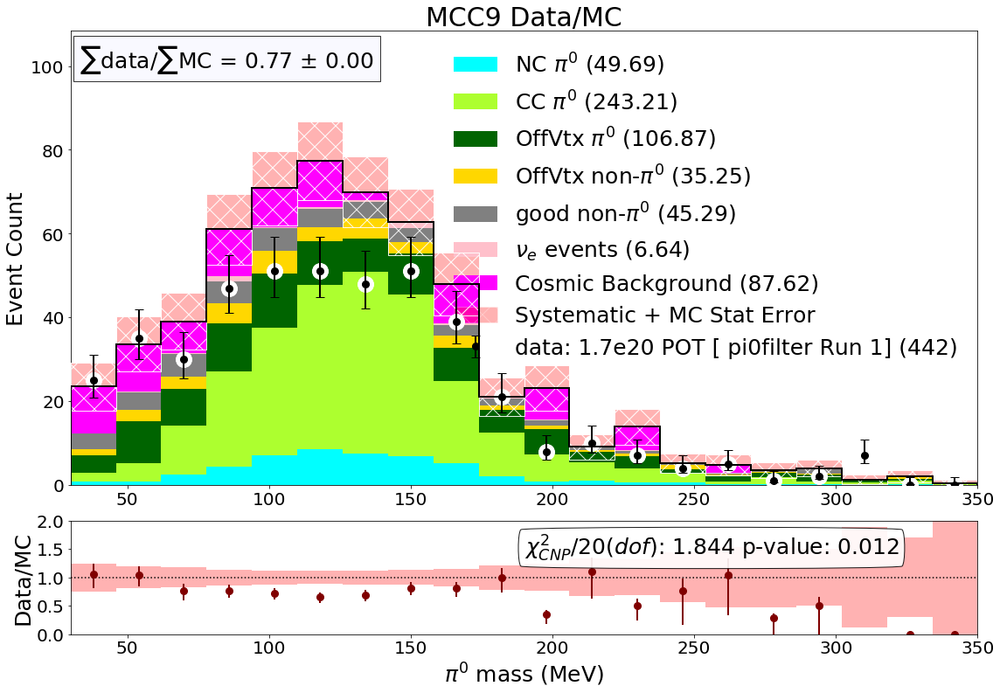

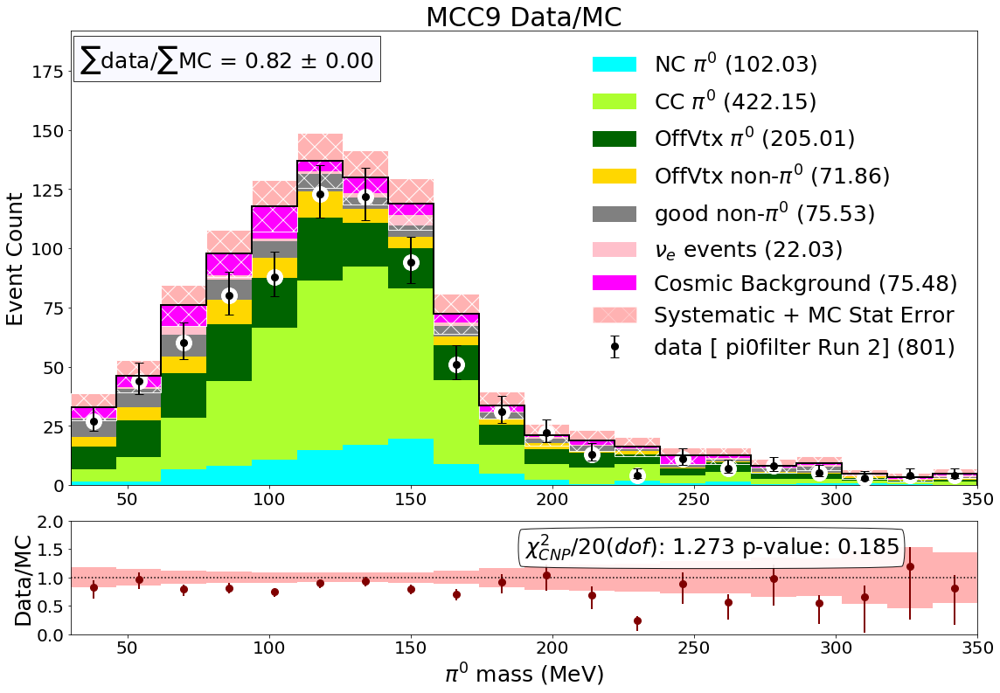

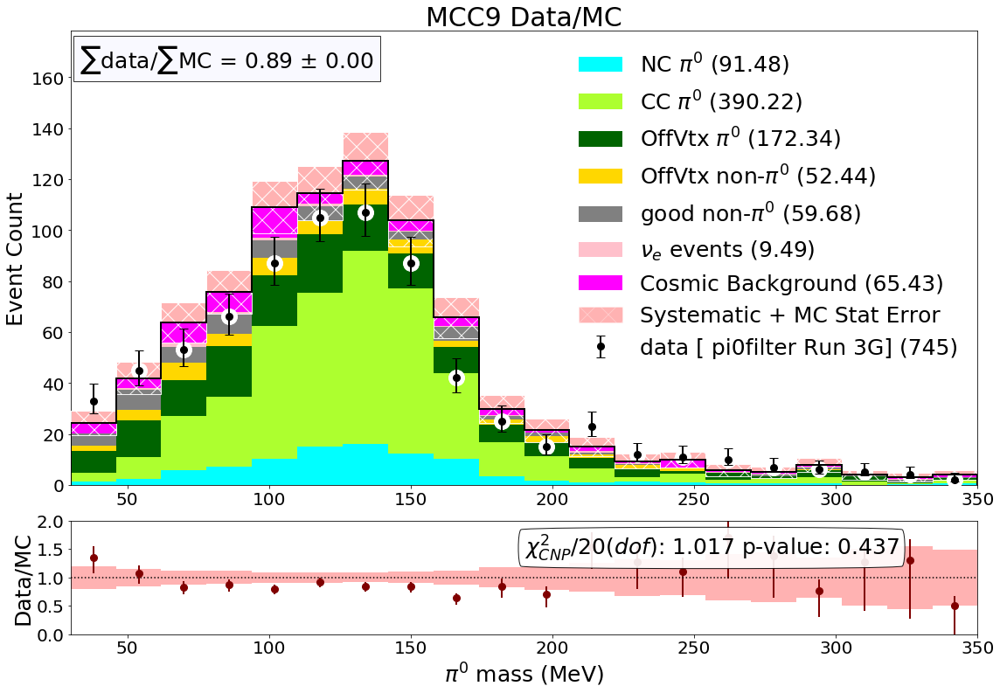

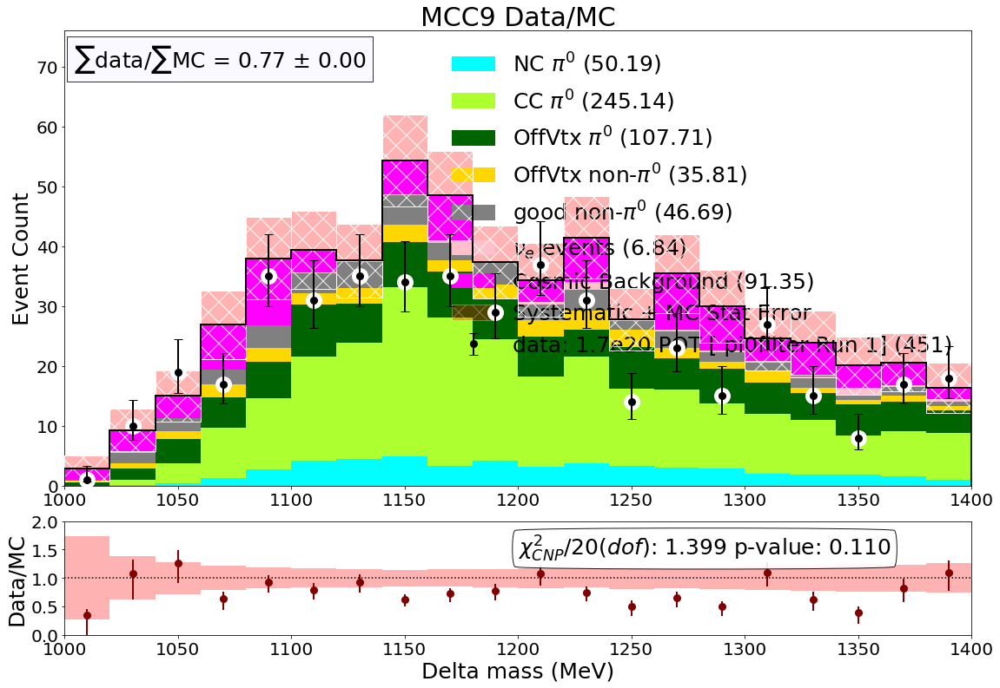

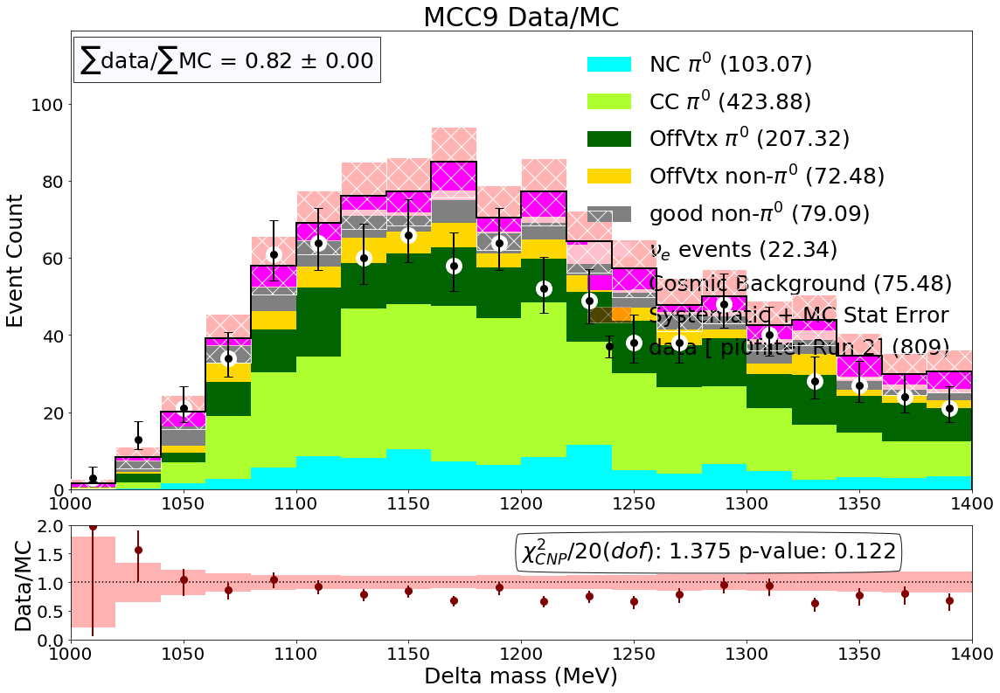

...

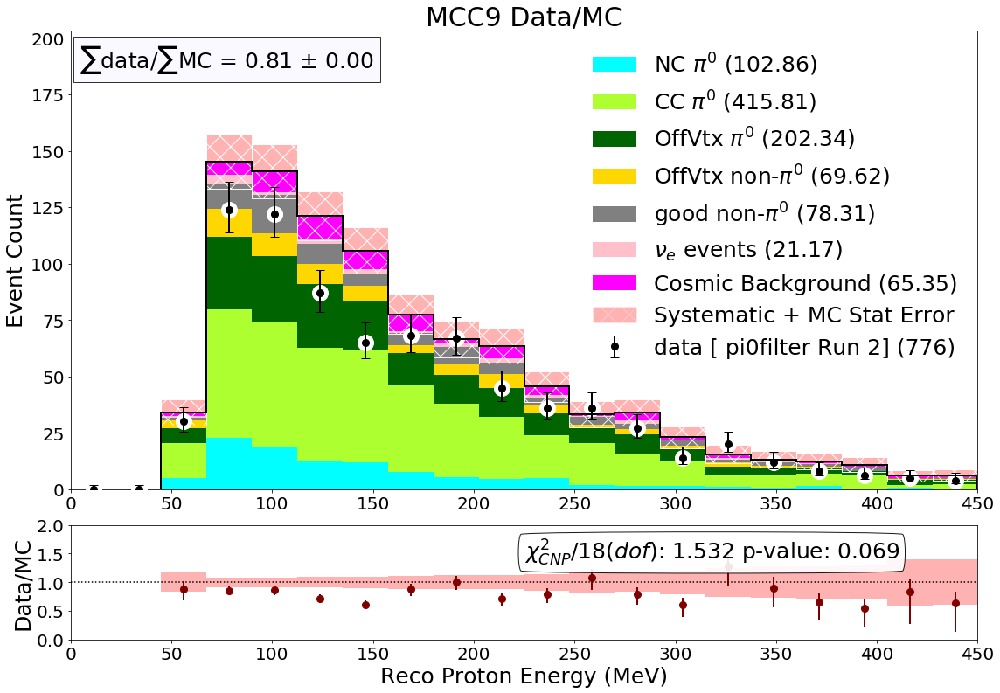

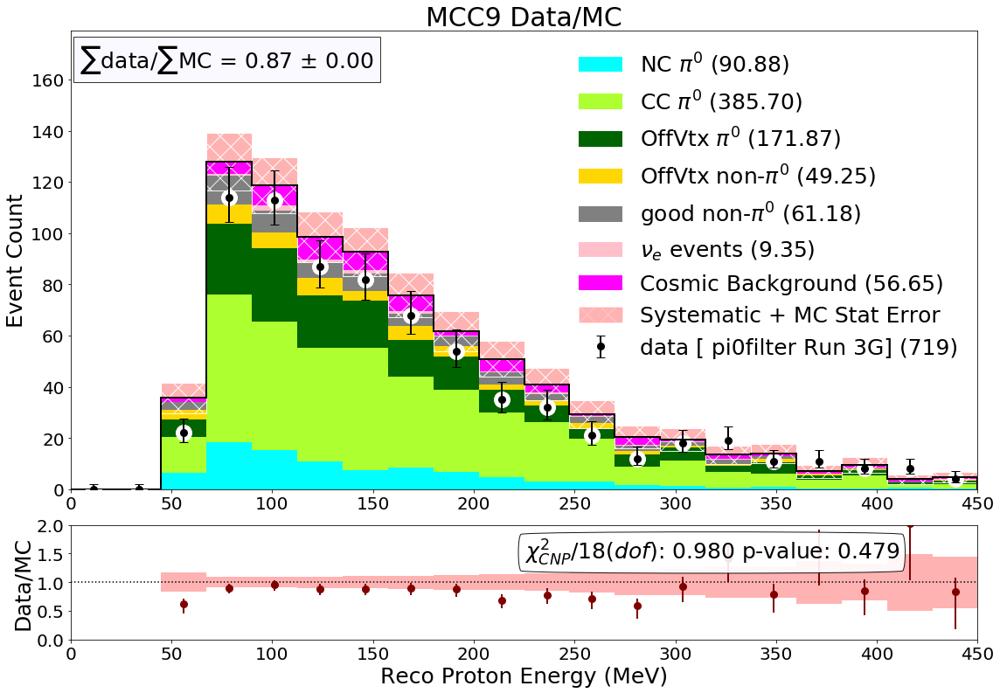

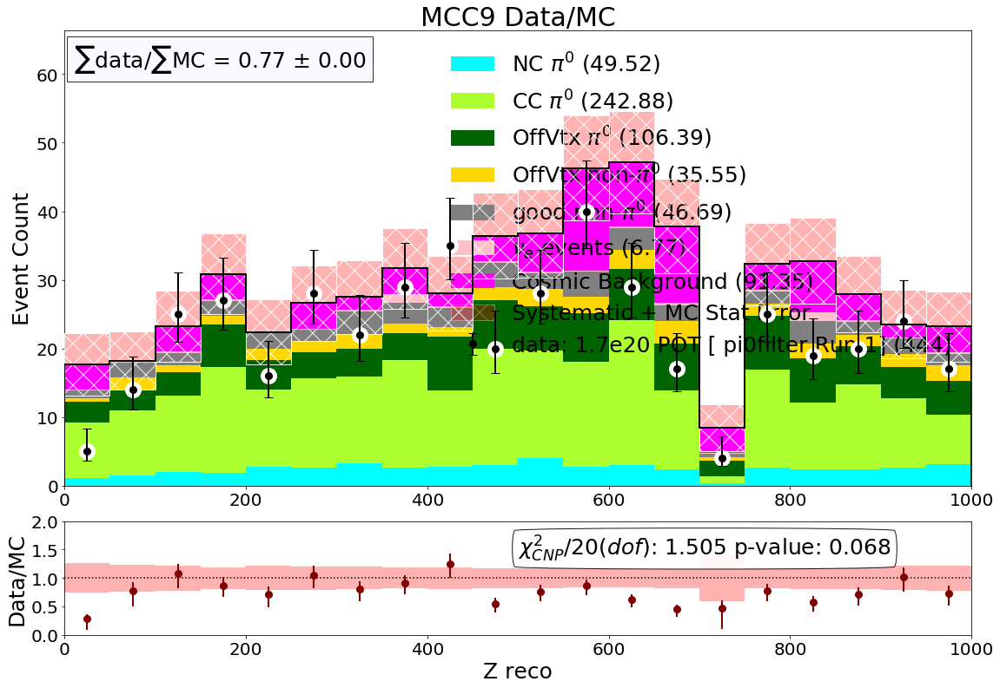

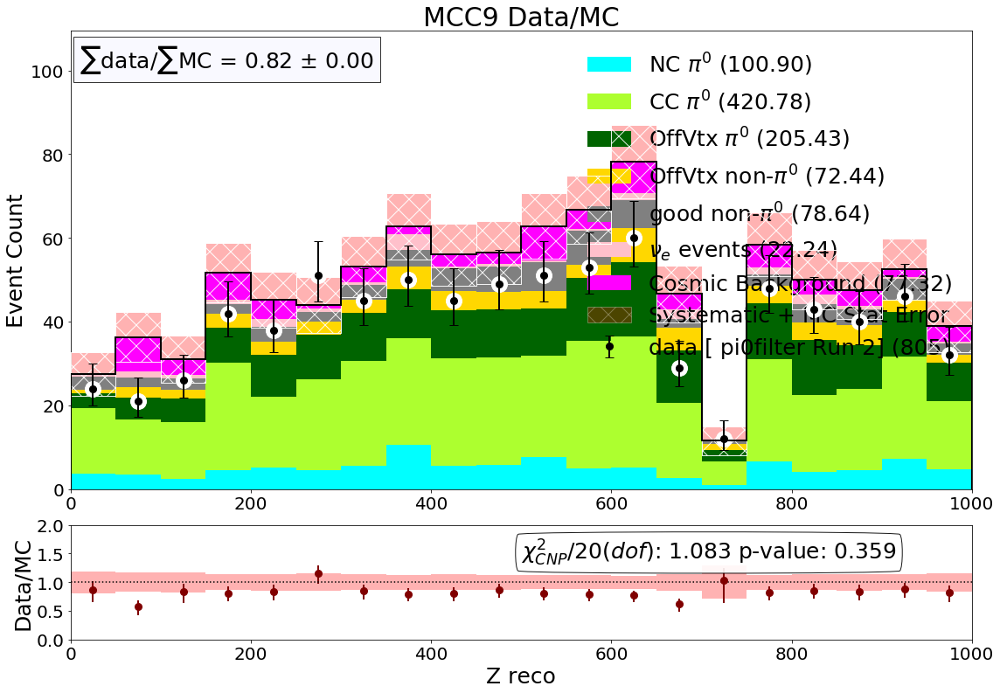

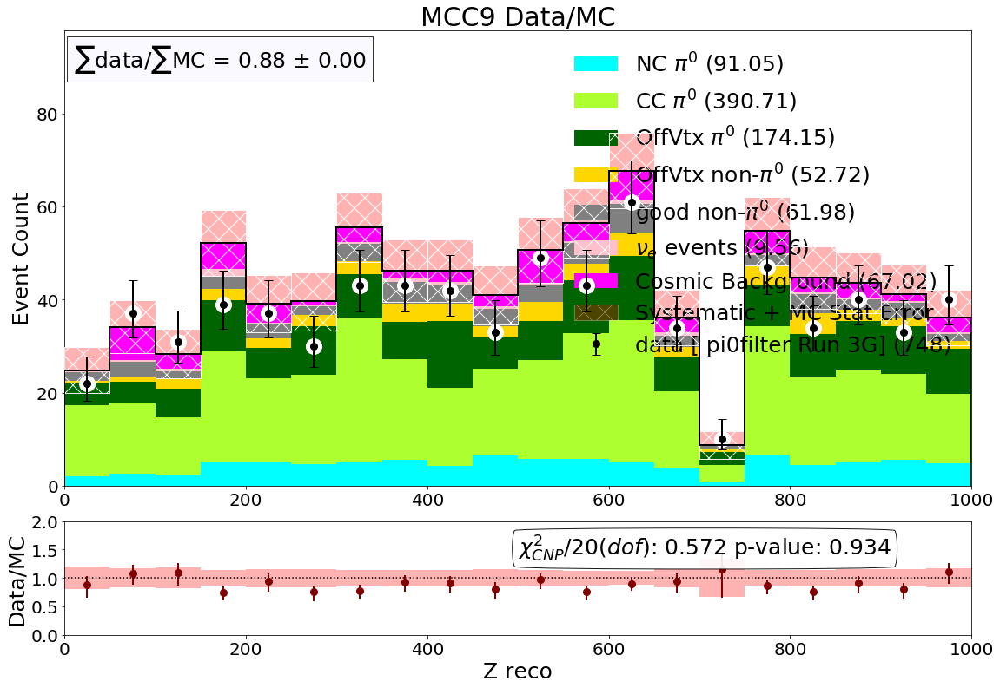

In [23]:
# individual runs again

EXT_R2_PI0FILTER_POT = EXT_R2D_PI0FILTER_POT +EXT_R2E_PI0FILTER_POT
EXT_R3_PI0FILTER_POT = EXT_R3F_PI0FILTER_POT +EXT_R3G_PI0FILTER_POT
EXT_R2_PI0FILTER_SCALE =  (DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/ float(EXT_R2_PI0FILTER_POT)
EXT_R3_PI0FILTER_SCALE =  (DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)/ float(EXT_R3_PI0FILTER_POT)

norm = 1.0
with PdfPages('output_20210205_individualruns_original.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]

        cov = np.zeros((nbins,nbins))
        run1_pi0filter_Hists = StackedHisto((df_numu_1mil_pi0.query('newhaspi0==0'),df_nue_pi0,df_ccpi0_r1_pi0,df_ncpi0_r1_pi0),(1.0,1.0,1.0,1.0))
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_pi0filter_Hists.AddStrata('haspi0==1  and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run1_pi0filter_Hists.AddLayer(df_ext_pi0,EXT_R1_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run1_pi0filter_DataHist = SimpleHisto(df_data_r1_pi0filter_pi0,1.0,0,'','data: 1.7e20 POT [ pi0filter Run 1]')
        fig3,ax3,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_pi0filter_Hists,run1_pi0filter_DataHist,varname,m_cov=cov)

        cov = np.zeros((nbins,nbins))
        df_data_r2=df_data_r2D_pi0filter_pi0.append(df_data_r2E_pi0filter_pi0)
        run2D_pi0filter_Hists = StackedHisto((df_numu_r2_1mil_pi0,df_nue_r2_pi0),(1.0,1.0))
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run2D_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run2D_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run2D_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run2D_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R2_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run2D_pi0filter_DataHist = SimpleHisto(df_data_r2,1.0,0,'','data [ pi0filter Run 2]')
        fig4,ax4,_,a = distplot_wratio_davio(vartest,nbins,myrange,run2D_pi0filter_Hists,run2D_pi0filter_DataHist,varname,m_cov=cov)

        cov = np.zeros((nbins,nbins))
        df_data_r3=df_data_r3F_pi0filter_pi0.append(df_data_r3G_pi0filter_pi0)
        run3F_pi0filter_Hists = StackedHisto((df_numu_r3_pi0.query('newhaspi0==0'),df_nue_r3_pi0,df_ccpi0_r3_pi0,df_ncpi0_r3_pi0),(1.0,1.0,1.0,1.0))
        run3F_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run3F_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run3F_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run3F_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run3F_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run3F_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run3F_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R3_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run3F_pi0filter_DataHist = SimpleHisto(df_data_r3,1.0,0,'','data [ pi0filter Run 3G]')
        fig6,ax6,_,a = distplot_wratio_davio(vartest,nbins,myrange,run3F_pi0filter_Hists,run3F_pi0filter_DataHist,varname,m_cov=cov)

        #save to pdf file of plots
#         pdf.savefig(fig1)
#         pdf.savefig(fig3)
#         pdf.savefig(fig4)
#         pdf.savefig(fig5)
#         pdf.savefig(fig6)
#         pdf.savefig(fig7)

In [24]:
print(len(df_numu_pi0.query('newhaspi0==1 and MC_scedr<5 and ccnc==0'))*(DATA_R1_PI0FILTER_POT)/NUMU_R1_POT)
print(len(df_ccpi0_r1_pi0.query('MC_scedr<5'))*(DATA_R1_PI0FILTER_POT)/CCPI0_R1_POT)
print(len(df_ext_total))

1270.622041175823
218.4559009641271
218



True


/home/kmason/.local/lib/python3.5/site-packages/pandas/core/frame.py:6692: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.00596174 0.00516247 0.00516247]
hstack gh_scale [1. 1. 1. ... 1. 1. 1.]
SUM 238.9178592772177
SUM 1037.3436624823837
SUM 463.8843330946602
SUM 542.6927650020117
histogram bins [ 72.61889181 113.75639493 166.29603523 219.25526231 294.68121893
 312.86834882 327.04528439 275.73045383 175.66578933  82.23517391
  60.33554226  40.41662922  32.90311674  25.33341895  19.3278597
  14.44536672  23.28344433   9.39168622   8.28932806   8.95937416]
Normalization Uncertainty: 0.23203973063307232
yerr_mc_total [18.51745109 30.1599552  43.79883745 57.44527055 76.90807618 83.86297341
 92.46293163 68.01018026 43.320856   22.78498905 18.17206993 14.36827689
 11.36066036  9.30771435  7.61995189  7.1826255   8.79218122  4.33621472
  3.98996859  4.36731314]
yerr_data 181.3335202840586
ERROR HERE
[0.11375471 0.08940683 0.0660948  0.05893437 0.04771507 0.05027214
 0.04790974 0.05171247 0.05990517 0.09506839 0.0955111  0.14440362
 0.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.00596174 0.00516247 0.00516247]
hstack gh_scale [1. 1. 1. ... 1. 1. 1.]
SUM 240.38532623229676
SUM 1042.9085140187235
SUM 472.6371284345954
SUM 553.4280831489762
histogram bins [  6.71114213  24.88574951  58.02061769  89.4762722  131.97761249
 173.46913387 163.16586687 207.73713229 190.90850324 163.78748057
 159.21509976 153.52753933 125.92582866 119.44636496 121.70641911
 102.00545397  92.45112917  87.04961611  72.16977361  65.7223163 ]
Normalization Uncertainty: 0.22806791897335382
yerr_mc_total [ 3.64045599 10.19051515 16.27390592 22.98519323 28.91223684 44.1951621
 43.06375839 56.30304811 50.0685173  48.00323024 43.13527798 41.98715573
 35.02974748 30.41462242 32.81673456 29.77822171 28.10913607 26.80440854
 22.31349191 20.41717351]
yerr_data 201.92485866546792
ERROR HERE
[0.26425229 0.19317245 0.11819711 0.08987931 0.08608313 0.06431705
 0.06888107 0.05919422 0.0586569  0.06786725 0.07059029 0.06910672
 

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.00596174 0.00516247 0.00516247]
hstack gh_scale [1. 1. 1. ... 1. 1. 1.]
SUM 237.5120516561496
SUM 1034.1803549549581
SUM 468.02280632034484
SUM 554.7853892646175
histogram bins [ 51.67647622 246.90770555 330.63452107 307.25396946 280.68725408
 263.70699283 184.26961442 143.43082232 114.6117509  104.33776879
  74.43844928  49.96868203  37.26907848  23.68865106  24.09256392
  21.69114183  11.30694573  10.42142103   8.8715285    5.23526468]
Normalization Uncertainty: 0.2314696017222151
yerr_mc_total [15.19273881 57.40709415 83.55510436 77.38841394 75.20494635 73.95972909
 47.9347301  36.75608062 29.86523239 26.28074304 20.12102152 12.94496677
 10.98492234  8.08767747  8.25151597  7.45284362  4.93068581  5.13565296
  4.77293085  3.38347212]
yerr_data 180.15681909849505
ERROR HERE
[0.13022309 0.05958066 0.05182316 0.05234622 0.05009396 0.05126762
 0.06187373 0.0686923  0.07531059 0.0716011  0.08595996 0.11825637
 

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.00596174 0.00516247 0.00516247]
hstack gh_scale [1. 1. 1. ... 1. 1. 1.]
SUM 224.57222839692312
SUM 977.2931370289323
SUM 438.0599908866591
SUM 503.2393542430431
histogram bins [248.856968   297.36052663 275.60518406 244.9265573  218.02557685
 179.23034645 136.05452706 125.44062813  95.16041263  77.43185071
  64.62447823  41.58452171  31.85945082  31.73339889  18.94180661
  18.13806274  12.25601946   8.48383133   8.72311543   8.7274475 ]
Normalization Uncertainty: 0.2306000098519003
yerr_mc_total [57.45597297 71.75678119 70.18238371 63.98712965 63.076714   46.87904888
 36.80022519 32.75639563 24.59602297 18.40871332 16.35490436 11.75407754
  9.41451603 10.34657098  6.63716931  6.83580509  5.27589218  4.28065209
  4.3457682   4.82844778]
yerr_data 174.50585462687616
ERROR HERE
[0.05650127 0.05289391 0.05728576 0.0546334  0.05893632 0.06247882
 0.07442403 0.06455028 0.07598798 0.07907694 0.08917231 0.11139347
 0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.00596174 0.00516247 0.00516247]
hstack gh_scale [1. 1. 1. ... 1. 1. 1.]
SUM 231.12372680268996
SUM 1011.020795733128
SUM 459.17013231389876
SUM 541.202870573705
histogram bins [257.06189186 296.69911399 262.87050966 232.5219304  201.41241805
 174.39895515 148.91666231 128.86018623  98.80853926  92.26293426
  75.58879964  67.20537815  38.08444855  38.00018615  33.91356559
  28.56892939  22.45263137  18.11478363  13.67658057  13.09908121]
Normalization Uncertainty: 0.23322835609098225
yerr_mc_total [63.91360498 69.99434698 67.60271053 59.53618581 51.24720317 50.25679104
 38.77422268 34.58707688 30.7859506  27.3919829  21.48363359 18.85528926
 12.87178508 10.30218311 10.38308456  9.7085037   9.52555348  8.56568897
  7.46205698  7.02640588]
yerr_data 184.54163644491322
ERROR HERE
[0.0613021  0.0518922  0.05461521 0.05902616 0.06253068 0.06206035
 0.06829725 0.07681652 0.07854629 0.07432963 0.08816736 0.08008321
 

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.00596174 0.00516247 0.00516247]
hstack gh_scale [1. 1. 1. ... 1. 1. 1.]
SUM 231.1812891089662
SUM 1007.2762032166827
SUM 453.71771681235674
SUM 506.2411093935354
histogram bins [364.09133725 348.39676682 301.64043575 232.23844778 197.99133073
 168.63393532 137.81638368 109.22112716  81.95987626  65.70420206
  48.14122526  38.23202405  27.05796863  23.00404289  12.14864658
  12.89353858   9.17384497   9.61168815   5.99815454   4.46134206]
Normalization Uncertainty: 0.22802206358386998
yerr_mc_total [87.1073197  83.13832451 75.80279847 59.13631231 50.10965259 44.07127709
 37.74337325 29.45323857 23.01431064 19.98080097 16.51620417 13.24804014
 11.47618312 11.57624982  6.97900638  7.3694469   6.97860925 11.41051898
  7.48888667  4.82609422]
yerr_data 171.87973292271587
ERROR HERE
[0.04591152 0.04814155 0.05164557 0.06306933 0.06153552 0.05924079
 0.06375197 0.07563318 0.08673225 0.088827   0.11341539 0.11401525


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.00596174 0.00516247 0.00516247]
hstack gh_scale [1. 1. 1. ... 1. 1. 1.]
SUM 240.38532623229716
SUM 1042.9085140187235
SUM 472.63712843459564
SUM 558.4280831489742
histogram bins [135.88724168  87.17935095  80.82938221  80.51067933  80.72074173
  75.00375414  87.50863786  80.35266336  85.05164976  71.96230486
  67.13696877  81.1587151   96.74156539  90.91439414 105.83590438
 117.36028504 155.56237696 222.0692715  257.52058704 255.05257766]
Normalization Uncertainty: 0.22621153880027833
yerr_mc_total [34.34315626 24.52219206 22.96334055 21.94784164 23.12449722 22.08346743
 25.09162129 23.20987548 26.22418316 21.62626733 20.90551951 21.32196552
 26.95372141 25.41363141 28.36446972 31.57814547 39.1723148  50.8470634
 61.67964261 56.48370022]
yerr_data 204.04253602207922
ERROR HERE
[0.06079115 0.09659875 0.08325525 0.08674877 0.09614684 0.09881408
 0.08123272 0.08374919 0.08714031 0.08985328 0.10588152 0.09421142


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.00596174 0.00516247 0.00516247]
hstack gh_scale [1. 1. 1. ... 1. 1. 1.]
SUM 239.12616603873963
SUM 1041.3170254501422
SUM 470.3085905972031
SUM 555.9212716378765
histogram bins [  0.           0.           0.         146.40419317 425.20140167
 460.77823205 401.71662402 273.79216696 190.69308848 122.27110694
  89.84447543  64.06965254  33.74270701  25.10118669  28.40440126
  15.3437958   12.88093859   8.89589637   4.36900104   3.16418572]
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          0.         12.09976005 20.62041226 21.46574555
 20.04286966 16.54666634 13.80916683 11.05762664  9.47863257  8.0043521
  5.8088473   5.01010845  5.32957796  3.91711575  3.58900245  2.98259893
  2.09021555  1.77881582]
yerr_data 158.91729019225446
ERROR HERE
[ 0.          0.          0.          0.07978361  0.04293986  0.04106508
  0.04299525  0.05476741  0.05893785  0.07553559  0.08315145  0.09774064
  0.1

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:424: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.00596174 0.00516247 0.00516247]
hstack gh_scale [1. 1. 1. ... 1. 1. 1.]
SUM 237.4615043825543
SUM 1027.4065267771432
SUM 458.91032514688885
SUM 511.9840542790408
histogram bins [  0.           0.          88.35895869 336.13447653 329.33895215
 272.75656904 247.61410234 196.03438475 166.87396461 143.5687357
 107.91428338  77.83510663  67.79966061  50.06546227  38.89928171
  36.35959255  22.25243648  24.67858757  13.16460721  16.11324835]
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          9.39994461 18.33397056 18.14769826 16.51534344
 15.73575872 14.00122797 12.91797061 11.98201718 10.38817998  8.82242068
  8.23405493  7.07569518  6.23692887  6.02989159  4.71724883  4.96775478
  3.62830638  4.01413108]
yerr_data 176.05414165602028
ERROR HERE
[0.         0.         0.08387861 0.04793569 0.04883596 0.05311133
 0.05290561 0.06405821 0.06856503 0.06295533 0.07704827 0.10116928
 0.08821819 0.105

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:424: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.00596174 0.00516247 0.00516247]
hstack gh_scale [1. 1. 1. ... 1. 1. 1.]
SUM 237.54223967976282
SUM 1037.0571844424642
SUM 465.9730271558708
SUM 556.825991733753
histogram bins [ 66.09491504  89.81194446  80.80866854 133.57084534 104.537754
 104.69021447 141.57954419 120.66430871 124.28869688 123.62796837
 144.81390627 156.81948121 186.23130656 107.17411367  25.34673316
 142.99705108 119.80253361 119.30322166 108.57080087  96.66443491]
Normalization Uncertainty: 0.0
yerr_mc_total [ 8.12987792  9.4769164   8.98936419 11.55728538 10.22437059 10.23182361
 11.89872028 10.98473071 11.14848406 11.11881146 12.03386498 12.52275853
 13.64665917 10.35249311  5.03455392 11.95813744 10.94543437 10.92260141
 10.41973132  9.83180731]
yerr_data 206.22480704703042
ERROR HERE
[0.09369826 0.08383694 0.10020247 0.07059537 0.08206982 0.09052747
 0.06727652 0.08354311 0.0811069  0.07391207 0.0714594  0.06820354
 0.06056899 0.07451

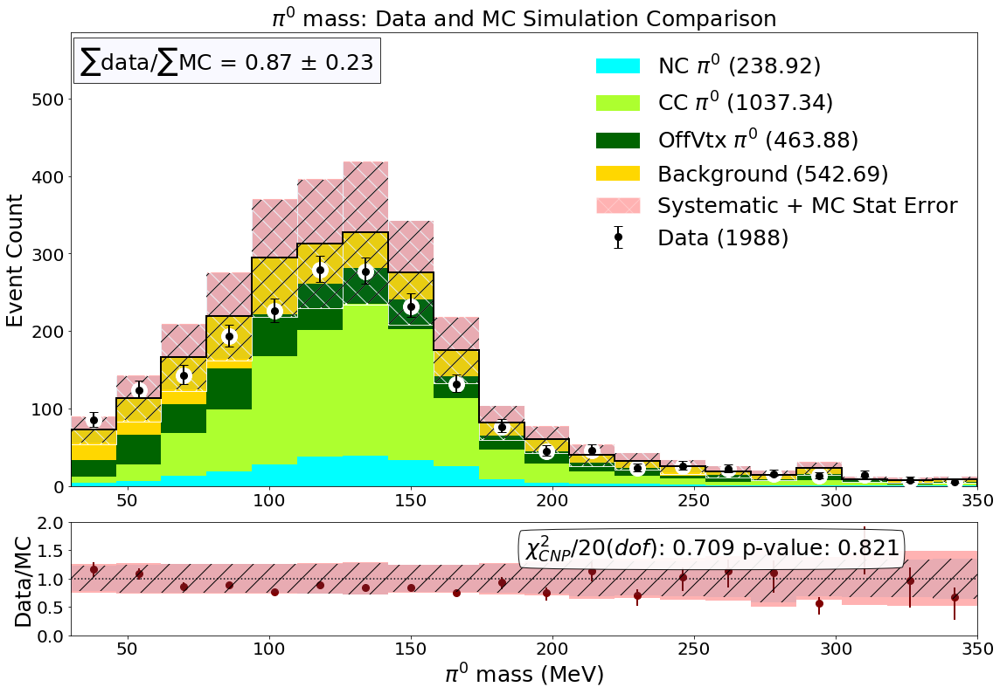

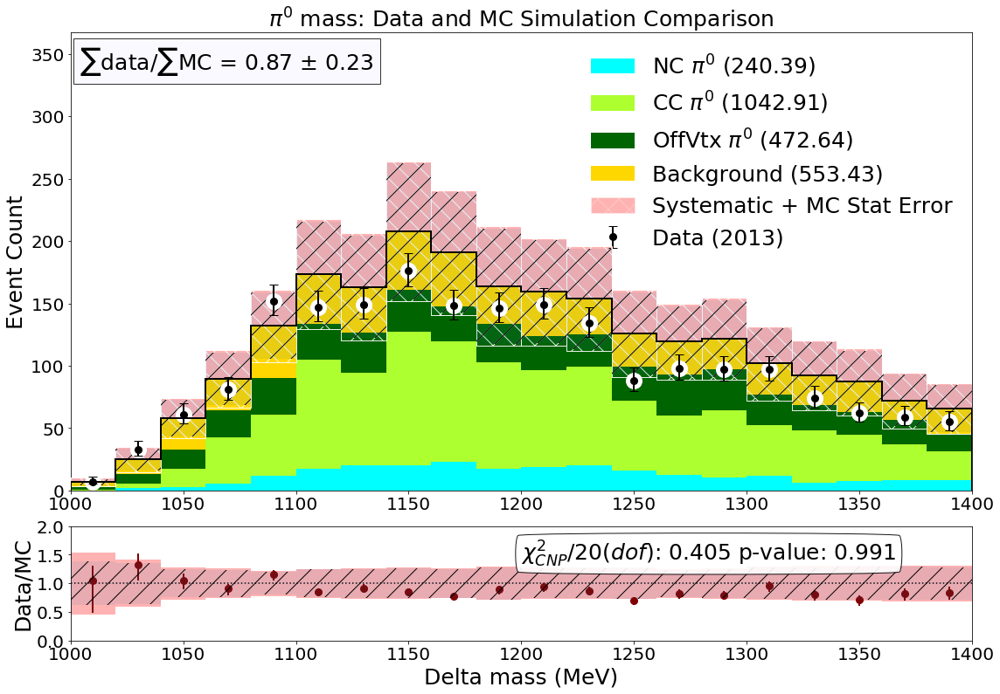

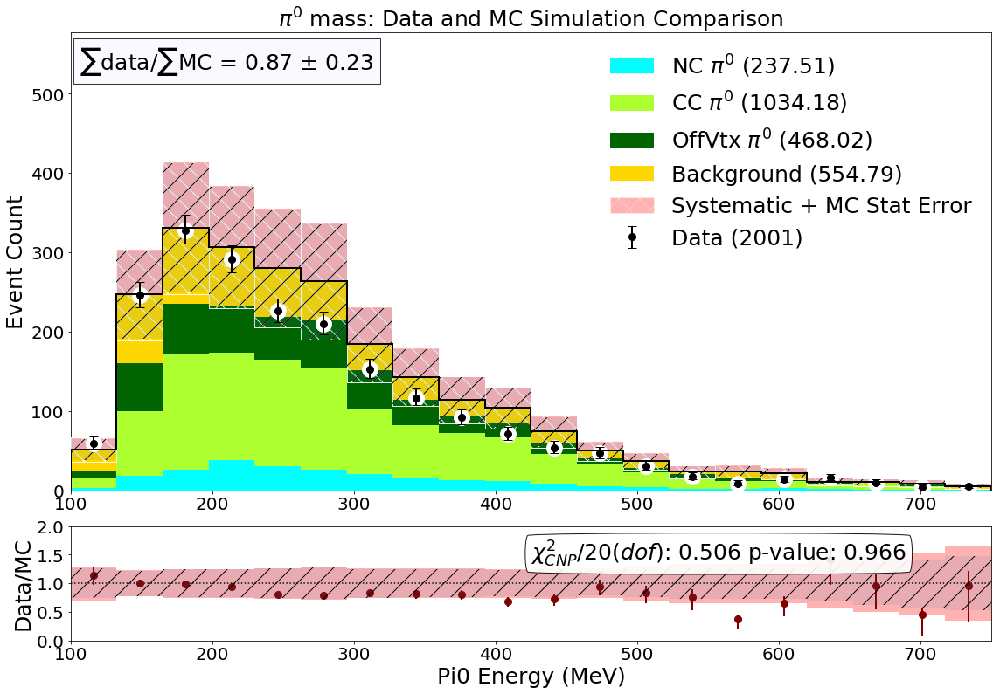

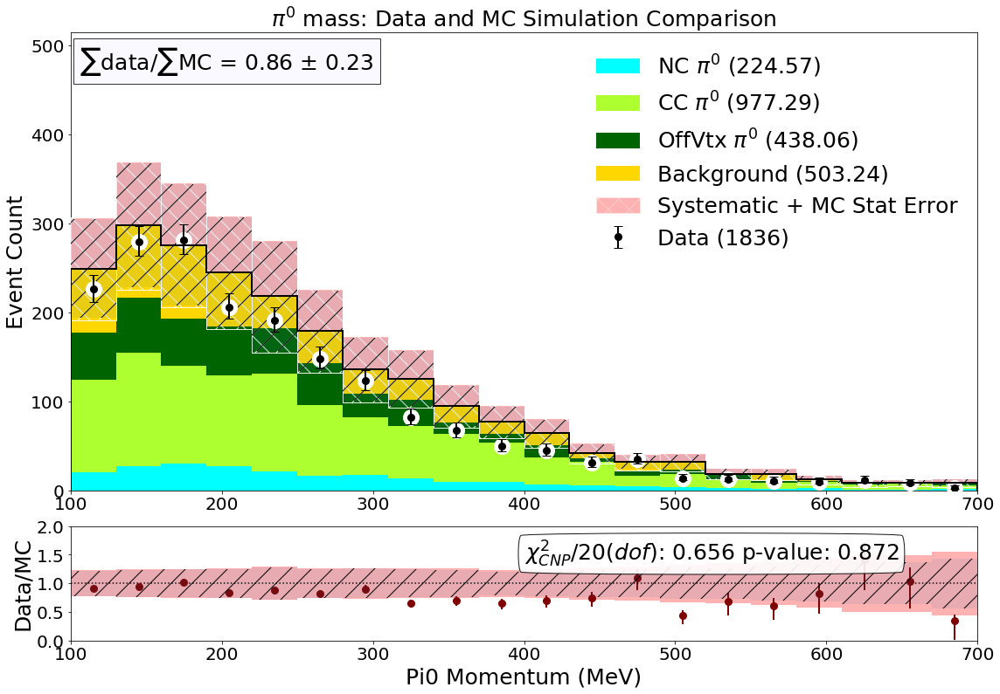

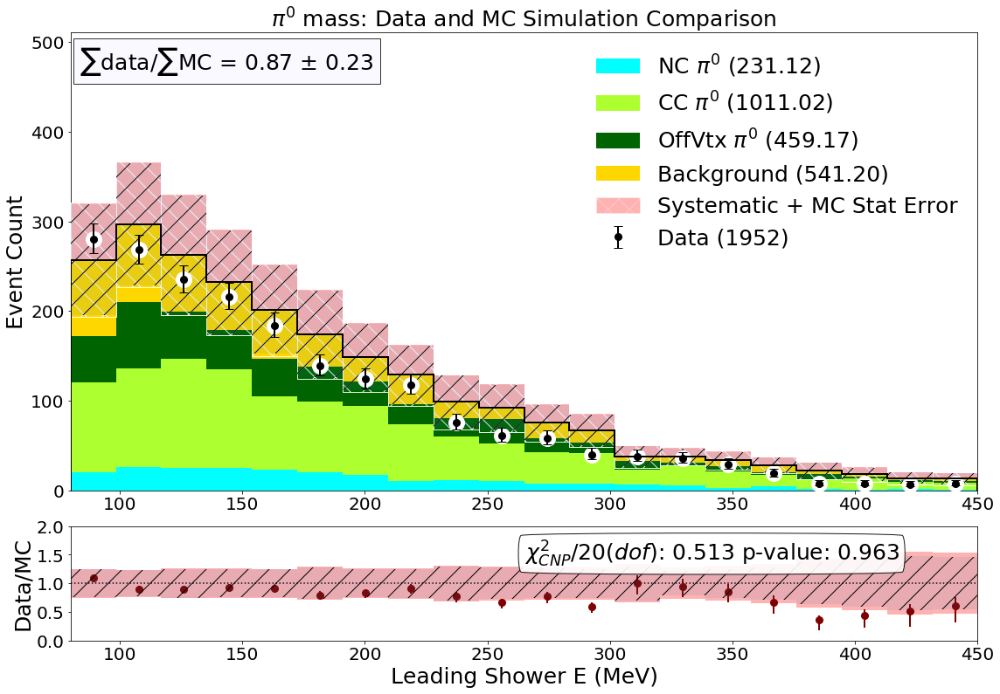

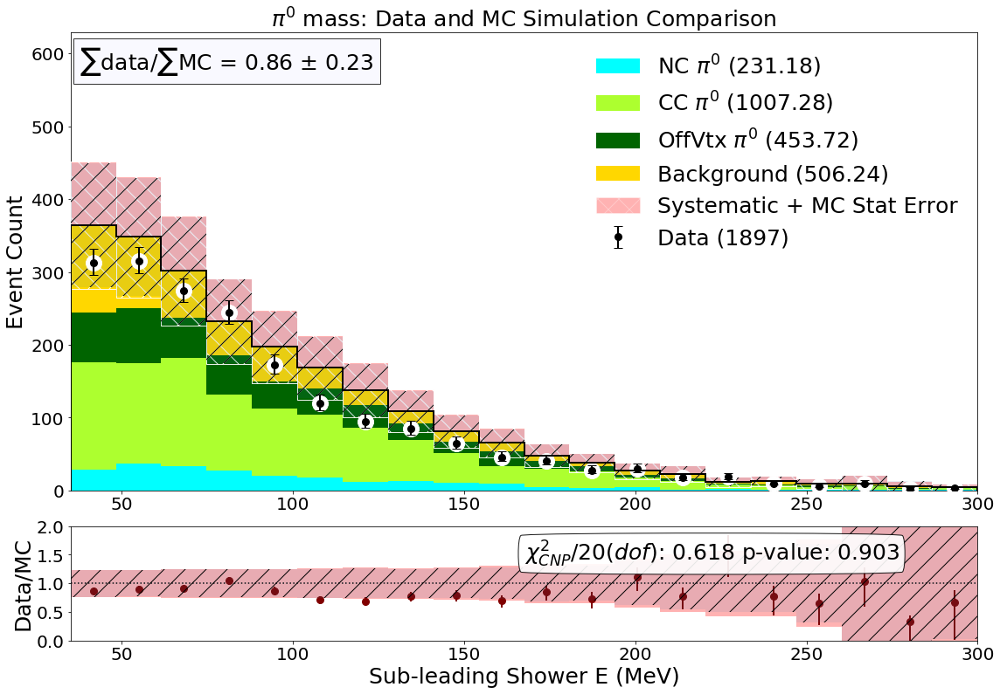

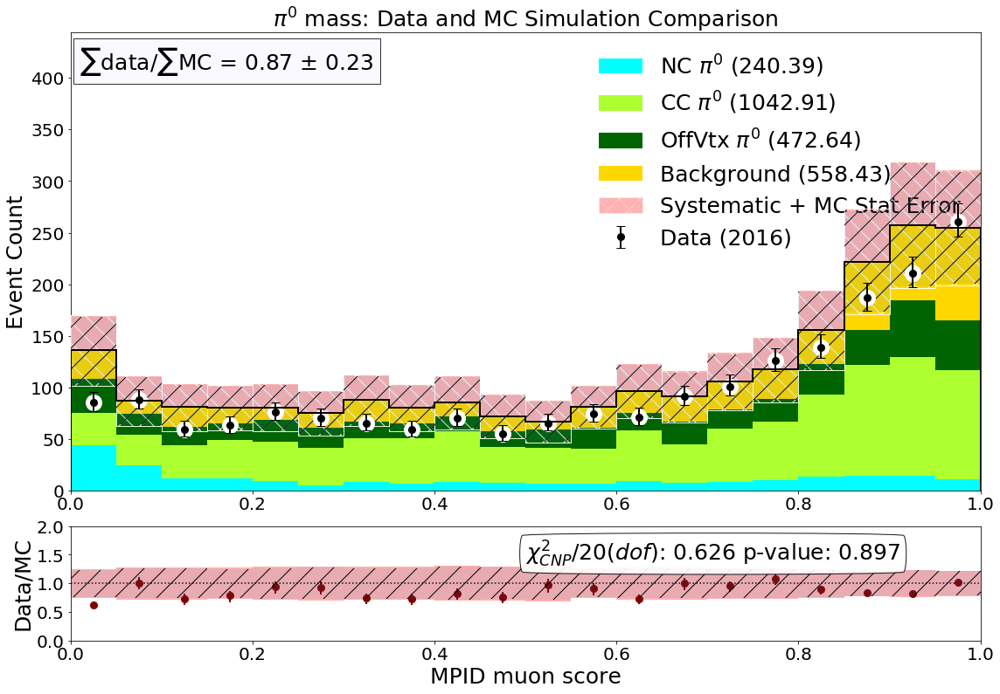

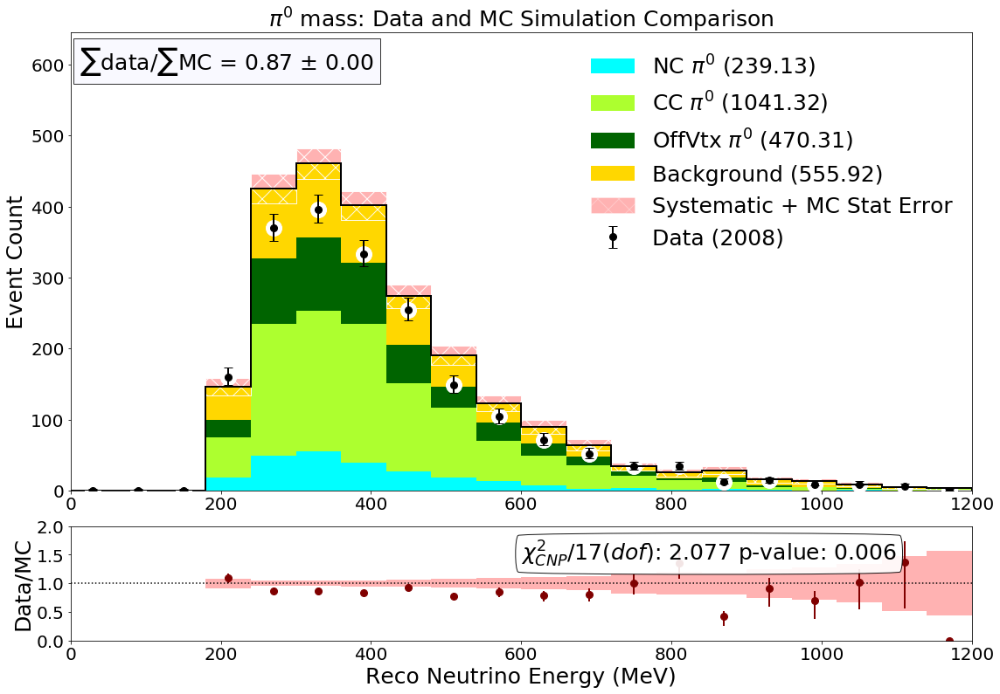

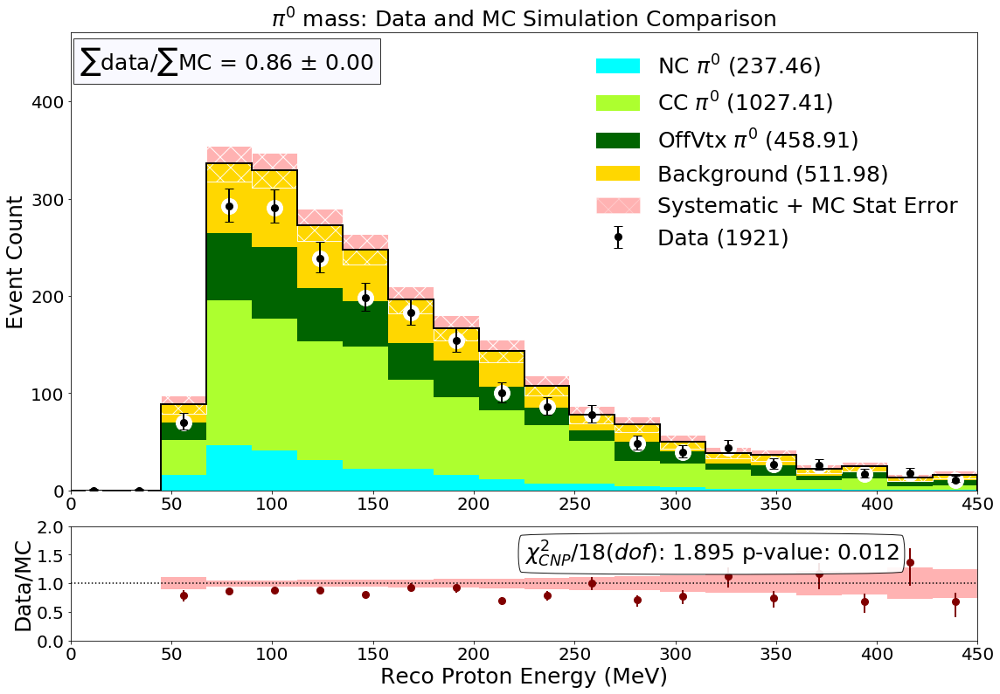

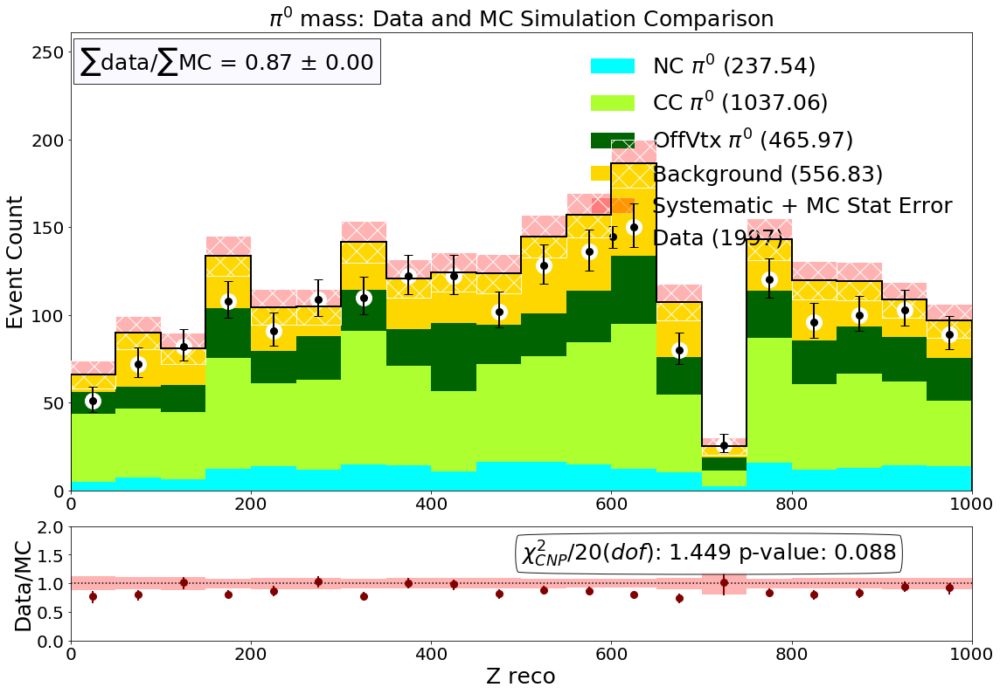

In [26]:
norm = 1.0
print()
print('xsec_corr_weight' in df_nue_total.keys())
df_ext_total['haspi0']=np.zeros(len(df_ext_total))
df_ext_total['MC_parentPDG']=np.zeros(len(df_ext_total))
df_numu_total2=df_numu_total.append(df_ext_total)
with PdfPages('output_combined_20210205_highstatsrun1.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]
        
        if sys_list[i] == 'none':
            s_cov = np.zeros((nbins,nbins))
        else:
            s_cov = np.genfromtxt(sys_list[i],delimiter=',')
        
        
        if detvar1_list[i] == 'none':
            d_cov = np.zeros((nbins,nbins))
        else:
            d_cov1 = np.genfromtxt(detvar1_list[i],delimiter=',')
            d_cov3 = np.genfromtxt(detvar3_list[i],delimiter=',')
            d_cov = ((DATA_R1_PI0FILTER_POT)*d_cov1 + (DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)*d_cov3)/(DATA_R1_PI0FILTER_POT+DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)
        
        cov = s_cov +d_cov
#         cov = np.zeros((nbins,nbins))
#         print('xsec_corr_weight' in df_ccpi0_total.keys())
        run1_open_Hists = StackedHisto((df_numu_total2.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14 or MC_parentPDG==0'),df_nue_total.query('MC_parentPDG == 12'),df_ncpi0_total,df_ccpi0_total),(1.0,1.0,1.0,1.0))
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run1_open_Hists.AddStrata(' haspi0==0 ',r"Background",'gold')
#         run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx background events",'gold')
#         run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"$\nu_\mu$ background events",'grey')
#         run1_open_Hists.AddStrata('MC_parentPDG ==12 and haspi0==0',r"$\nu_e$ background events",'pink')
#         run1_open_Hists.AddLayer(df_ext_total,df_ext_total['pot_weight'],1.0,'Cosmic Background','fuchsia')
        run1_open_DataHist = SimpleHisto(df_data_total,1.0,0,'','Data')
        fig1,ax1,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_open_Hists,run1_open_DataHist,varname,m_cov=cov)
#         ax1.text(50,415, 'MicroBooNE',
#         color='black', fontsize=24)
        ax1.set_title(r"$\pi^0$ mass: Data and MC Simulation Comparison",fontsize=25)
#         ax1.set_xlabel(varname_list[i],fontsize=25)
        ax1.set_ylabel('Event Count',fontsize=25)
        fig1.savefig(vartest_list[i]+'_20210830.png')

In [42]:
def distplot_w2ratio(myvar,nbins,myrange,stackedhists,weightedhist,datahist,stxcoord,m_cov,m_covw,legpos=0,ymax=-1,normshift=1,fs=(16,11),consFac=0.0):

    #consFac is new and consolidates all MC strata whose contribution is less than a given percent threshold.
    # (my legend was too full of useless stuff)

    vals_mc = np.zeros(nbins)
    vals_mc_raw = np.zeros(nbins)
    yerrsq_mc = np.zeros(nbins)
    yrr_mc_sys = np.zeros(nbins)
    ndof = 0

    a_labels_evts_draw = []
    a_labels_evts_failThresh = []
    a_cols_draw = []
    a_vals_draw = []
    a_wgts_draw = []
    a_vals_failThresh = []
    a_wgts_failThresh = []
    evts_failThresh = 0.0

    gh_vals,gh_wgts,gh_scale,gh_cols,gh_labels = stackedhists.GetHists(myvar)
    data_vals,data_wgt,data_scale,_,data_label = datahist.GetHist(myvar)
    vals_mc_total,binedges = np.histogram(np.hstack(gh_vals),nbins,range=myrange,weights=np.hstack(gh_wgts)*np.hstack(gh_scale))
    mctot = vals_mc_total.sum()
    mcthresh = consFac * mctot


    for i in range(len(gh_vals)):
        h1_raw,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i])     # hist of raw event weights
        h1,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i]*gh_scale[i])
        print("SUM", h1.sum())

        vals_mc_raw += h1_raw
        vals_mc += h1

        scalesort = gh_scale[i].argsort()
        sorted_vals = gh_vals[i][scalesort[::-1]]
        sorted_scale = gh_scale[i][scalesort[::-1]]
        sorted_wgt = gh_wgts[i][scalesort[::-1]]
        for sc in np.unique(sorted_scale):
            subvals = sorted_vals[sorted_scale==sc]
            subwgts = sorted_wgt[sorted_scale==sc]
            subh1,_ = np.histogram(subvals,nbins,range=myrange,weights=subwgts)
            yerrsq_mc += np.power(np.sqrt(subh1)*sc,2)
       
        a_vals_draw.append(gh_vals[i].copy())
        a_wgts_draw.append((gh_wgts[i]*gh_scale[i]).copy())
        a_labels_evts_draw.append(gh_labels[i]+' (%.2f)'%h1.sum())
        a_cols_draw.append(gh_cols[i])


    vals_data_raw,_ = np.histogram(data_vals,nbins,range=myrange,weights=data_wgt)
    vals_data,_ = np.histogram(data_vals,nbins,range=myrange,weights=np.multiply(data_wgt,data_scale))
    bincenters = np.diff(binedges)/2 + binedges[:-1]

    #jarretbars
    a_obslo = []
    a_obshi = []
    for i in range(nbins):
        obslo,obshi = GetErrorsData(vals_data[i])
        a_obshi.append(obshi-vals_data[i])
        a_obslo.append(vals_data[i]-obslo)

    #m_cov is fractional, so we multiply it by MC
    for i in range(nbins):
        for j in range(nbins):
            if(vals_mc[i] > 0 and vals_mc[j] > 0):
                m_cov[i][j] *= vals_mc[i]*vals_mc[j]
                m_covw[i][j] *= weightedhist[i]*weightedhist[j]
#             else if math.isnan(vals_mc[i]) or math.isnan(vals_mc[j]):
#                 m_cov[i][j] = 0
            else:
                m_cov[i][j] = 0
#             else:
#                 print("uh oh!",vals_mc[i],vals_mc[j] )

    # Normalization uncertainty:
    for i in range(len(m_cov)):
        for j in range(len(m_cov[i])):
            if math.isnan(m_cov[i][j]):
                m_cov[i][j]=0.0000000001
    for i in range(len(m_covw)):
        for j in range(len(m_covw[i])):
            if math.isnan(m_covw[i][j]):
                m_covw[i][j]=0.0000000001
                
    fNorm_squared = m_cov.sum() / np.power(vals_mc.sum(),2)

    yerr_mc_sys = np.sqrt(np.diag(m_cov))
    yerr_mc_total = np.sqrt(np.diag(m_cov) + yerrsq_mc)

    yerrsq_data = np.zeros(nbins)
    for i in range(nbins):
        if vals_mc_raw[i] > 0:
            ndof += 1
            if vals_data[i] > 0:
                yerrsq_data[i] += (3.0*vals_data[i]*vals_mc[i]*normshift)/(vals_mc[i]*normshift+2.0*vals_data[i])
            else:
                yerrsq_data[i] += vals_mc[i]*normshift/2.0
            m_cov[i][i] += yerrsq_data[i] + yerrsq_mc[i]
            m_covw[i][i] += yerrsq_data[i] + yerrsq_mc[i]
        else:
            m_cov[i][i] += 999

        
    yerr_data = np.sqrt(yerrsq_data)
    print("yerr_data", sum(yerr_data))
    er_rat_line = np.zeros(nbins)
    er_rat_line_sys = np.zeros(nbins)
    er_rat_dotshi = np.zeros(nbins)
    er_rat_dotslo = np.zeros(nbins)

    for i in range(nbins):
        if vals_mc[i] > 0:
            er_rat_line[i] = yerr_mc_total[i]/float(vals_mc[i])
            er_rat_line_sys[i] = yerr_mc_sys[i]/float(vals_mc[i])
            er_rat_dotshi[i] = a_obshi[i]/float(vals_mc[i])
            er_rat_dotslo[i] = a_obslo[i]/float(vals_mc[i])

    chisq = 0.0
    invcov = np.linalg.inv(m_cov)
    # calc chi2
    for i in range(nbins):
        for j in range(nbins):
            if vals_mc_raw[i] > 0 and vals_mc_raw[j] > 0:
                chisq += (vals_mc[i] - vals_data[i]) * (vals_mc[j] - vals_data[j]) * invcov[i][j]
    pval = 1 - stats.chi2.cdf(chisq, ndof)
    
#     now get the weighted version
    chisqw = 0.0
    invcov = np.linalg.inv(m_covw)

    # calc chi2
    print ("chi2 in bins")
    for i in range(nbins):
        for j in range(nbins):
            if weightedhist[i] > 0 and weightedhist[j] > 0:
                chisqw += (weightedhist[i] - vals_data[i]) * (weightedhist[j] - vals_data[j]) * invcov[i][j]
    pvalw = 1 - stats.chi2.cdf(chisqw, ndof)

    fig,ax = plt.subplots(figsize=fs)
    fig.patch.set_alpha(1)
    gs = gridspec.GridSpec(3, 1, height_ratios=[3, .75,.75])
    ax0 = plt.subplot(gs[0])
    plt.xticks(fontsize=20 )
    plt.yticks(fontsize=20 )
    ax1 = plt.subplot(gs[1])
    plt.xticks(fontsize=20 )
    plt.yticks(fontsize=20 )
    ax2 = plt.subplot(gs[2])
    ymax = max((vals_data+np.asarray(a_obshi)).max(),(vals_mc+yerr_mc_sys).max())*1.4

    ax0.set_ylim(0,ymax)
    ax0.set_xlim(myrange)
    ax1.set_ylim(0,2)
    ax1.set_xlim(myrange)
    ax2.set_ylim(0,2)
    ax2.set_xlim(myrange)
    ax2.set_xlabel(stxcoord,fontsize=25)
    ax0.set_ylabel('Event Count',fontsize=25)
    ax1.set_ylabel('Data/MC',fontsize=25)
    ax2.set_ylabel('Data/wMC',fontsize=25)
    ax0.set_title('MCC9 Data/MC',fontsize=30)

    ax0.hist(a_vals_draw,nbins,range=myrange,weights=a_wgts_draw,color=a_cols_draw,stacked=True,linewidth=0,label=a_labels_evts_draw,edgecolor=None)
    ax0.hist(np.hstack(a_vals_draw),nbins,range=myrange,weights=np.hstack(a_wgts_draw),histtype='step',zorder=20,color='black',linewidth=2)
    bincenters_w = [i + 320/40.0 for i in bincenters]
    ax0.step(bincenters_w,weightedhist,color='blue',linestyle = '-.',label="weighted MC (wMC)",linewidth=5)
    ax0.errorbar(bincenters,vals_data,fmt='o',yerr=(a_obslo,a_obshi),color='black',capsize=5,label=data_label+' (%i)'%vals_data.sum(),markersize=8,zorder=20,elinewidth=2)
    ax0.errorbar(bincenters,vals_data,fmt='o',color='white',zorder=19,markersize=18)

    errboxes_tot = []
    errboxes_sys = []

    for i in range(len(bincenters)):
        rect0 = Rectangle((binedges[i],(vals_mc[i]-yerr_mc_sys[i])),binedges[i+1]-binedges[i],yerr_mc_sys[i]*2)
        errboxes_sys.append(rect0)
        rect1 = Rectangle((binedges[i],(vals_mc[i]-yerr_mc_total[i])),binedges[i+1]-binedges[i],yerr_mc_total[i]*2)
        errboxes_tot.append(rect1)
    pc_sys = PatchCollection(errboxes_tot,facecolor='red', alpha=.3,hatch='X',edgecolor='white')
    pc_sys_outline = PatchCollection(errboxes_tot,facecolor='none', alpha=.9,hatch='X',edgecolor='white',zorder=11)
    pc_tot = PatchCollection(errboxes_sys,facecolor=None,alpha=.1,hatch='/',zorder=12)
    ax0.add_collection(pc_sys)
    ax0.add_collection(pc_sys_outline)
    ax0.add_collection(pc_tot)
#     ax0.hist(np.zeros(1),(1,2),facecolor=None,alpha=.1,hatch='//',zorder=0,label='MC Systematic Error')
    ax0.hist(np.zeros(1),(1,2),facecolor='red', alpha=.3,hatch='X',edgecolor='white',label='Systematic + MC Stat Error')
    ax0.legend(loc='upper right',fontsize=25,frameon=False,ncol=1)

    errboxes_rat_tot = []
    errboxes_rat_sys = []
    for i in range(len(er_rat_dotshi)):
        rect0 = Rectangle((binedges[i],1-er_rat_line[i]),binedges[i+1]-binedges[i],er_rat_line[i]*2)
        errboxes_rat_tot.append(rect0)
        rect1 = Rectangle((binedges[i],1-er_rat_line_sys[i]),binedges[i+1]-binedges[i],er_rat_line_sys[i]*2)
        errboxes_rat_sys.append(rect1)

    pc_rat_tot = PatchCollection(errboxes_rat_tot, facecolor='red', alpha=.3)
    pc_rat_sys = PatchCollection(errboxes_rat_sys, facecolor=None, alpha=.1,hatch='/',zorder=12)
    ax1.add_collection(pc_rat_tot)
    ax1.add_collection(pc_rat_sys)
    ax1.hist(np.zeros(1),(1,2),facecolor=None,alpha=.1,hatch='//',zorder=0)

    ax1.hist(np.zeros(1),(1,2),facecolor='red',alpha=.3,zorder=0)
    ax1.errorbar(bincenters,np.true_divide(vals_data,vals_mc),yerr=(er_rat_dotshi,er_rat_dotslo),fmt='o',color='maroon',capsize=0,markersize=8,elinewidth=2)
    ax1.axhline(1,color='black',linestyle=':')
#     ax0.annotate(r'$\sum$data/$\sum$MC = %.2f '%(vals_data.sum()/float(vals_mc.sum())),xy=(.01,.92),xycoords='axes fraction',fontsize=20,bbox=dict(boxstyle="square", fc="ghostwhite",alpha=.8))

    errboxes_rat_tot2 = []
    errboxes_rat_sys2 = []
    for i in range(len(er_rat_dotshi)):
        rect0 = Rectangle((binedges[i],1-er_rat_line[i]),binedges[i+1]-binedges[i],er_rat_line[i]*2)
        errboxes_rat_tot2.append(rect0)
        rect1 = Rectangle((binedges[i],1-er_rat_line_sys[i]),binedges[i+1]-binedges[i],er_rat_line_sys[i]*2)
        errboxes_rat_sys2.append(rect1)

    pc_rat_tot2 = PatchCollection(errboxes_rat_tot2, facecolor='red', alpha=.3)
    pc_rat_sys2 = PatchCollection(errboxes_rat_sys2, facecolor=None, alpha=.1,hatch='/',zorder=12)
    ax2.add_collection(pc_rat_tot2)
    ax2.add_collection(pc_rat_sys2)
    ax2.hist(np.zeros(1),(1,2),facecolor=None,alpha=.1,hatch='//',zorder=0)

    ax2.hist(np.zeros(1),(1,2),facecolor='red',alpha=.3,zorder=0)
    ax2.errorbar(bincenters,np.true_divide(vals_data,weightedhist),yerr=(er_rat_dotshi,er_rat_dotslo),fmt='o',color='maroon',capsize=0,markersize=8,elinewidth=2)
    ax2.axhline(1,color='black',linestyle=':')
    
    ax0.annotate(r'$\sum$data/$\sum$MC = %.2f $\pm$ %.2f'%(vals_data.sum()/float(vals_mc.sum()),np.sqrt(fNorm_squared)),xy=(.01,.92),xycoords='axes fraction',fontsize=25,bbox=dict(boxstyle="square", fc="ghostwhite",alpha=.8))
    ax0.annotate(r'$\sum$data/$\sum$wMC = %.2f $\pm$ %.2f'%(vals_data.sum()/float(sum(weightedhist)),np.sqrt(fNorm_squared)),xy=(.01,.78),xycoords='axes fraction',fontsize=25,bbox=dict(boxstyle="square", fc="ghostwhite",alpha=.8))
    ax1.annotate(r'$\chi^2_{CNP}/%i  (dof)$: %.3f'%(ndof,chisq/float(ndof))+' p-value: %.3f'%pval,xy=(.5,.7), xycoords='axes fraction',fontsize=25,bbox=dict(boxstyle="round4", fc="w",alpha=.9),zorder=30)
    ax2.annotate(r'$\chi^2_{CNP}/%i  (dof)$: %.3f'%(ndof,chisqw/float(ndof))+' p-value: %.3f'%pvalw,xy=(.5,.7), xycoords='axes fraction',fontsize=25,bbox=dict(boxstyle="round4", fc="w",alpha=.9),zorder=30)

    plt.tight_layout()
    plt.xticks(fontsize=20 )
    plt.yticks(fontsize=20 )
    return fig,ax0,ax1,pval


True


/home/kmason/.local/lib/python3.5/site-packages/pandas/core/frame.py:6692: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
SUM 238.9178592772177
SUM 1037.3436624823837
SUM 463.8843330946602
SUM 542.6927650020117
yerr_data 181.3335202840586
chi2 in bins


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
SUM 240.38532623229676
SUM 1042.9085140187235
SUM 472.6371284345954
SUM 553.4280831489762
yerr_data 201.92485866546792
chi2 in bins


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
SUM 237.5120516561496
SUM 1034.1803549549581
SUM 468.02280632034484
SUM 554.7853892646175
yerr_data 180.15681909849505
chi2 in bins


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
SUM 224.57222839692312
SUM 977.2931370289323
SUM 438.0599908866591
SUM 503.2393542430431
yerr_data 174.50585462687616
chi2 in bins


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
SUM 231.12372680268996
SUM 1011.020795733128
SUM 459.17013231389876
SUM 541.202870573705
yerr_data 184.54163644491322
chi2 in bins


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
SUM 231.1812891089662
SUM 1007.2762032166827
SUM 453.71771681235674
SUM 506.2411093935354
yerr_data 171.87973292271587
chi2 in bins


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
SUM 240.38532623229716
SUM 1042.9085140187235
SUM 472.63712843459564
SUM 558.4280831489742
yerr_data 204.04253602207922
chi2 in bins


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
SUM 239.12616603873963
SUM 1041.3170254501422
SUM 470.3085905972031
SUM 555.9212716378765
yerr_data 158.91729019225446
chi2 in bins


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:205: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
SUM 237.4615043825543
SUM 1027.4065267771432
SUM 458.91032514688885
SUM 511.9840542790408
yerr_data 176.05414165602028
chi2 in bins


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:205: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
5092
SUM 237.54223967976282
SUM 1037.0571844424642
SUM 465.9730271558708
SUM 556.825991733753
yerr_data 206.22480704703042
chi2 in bins


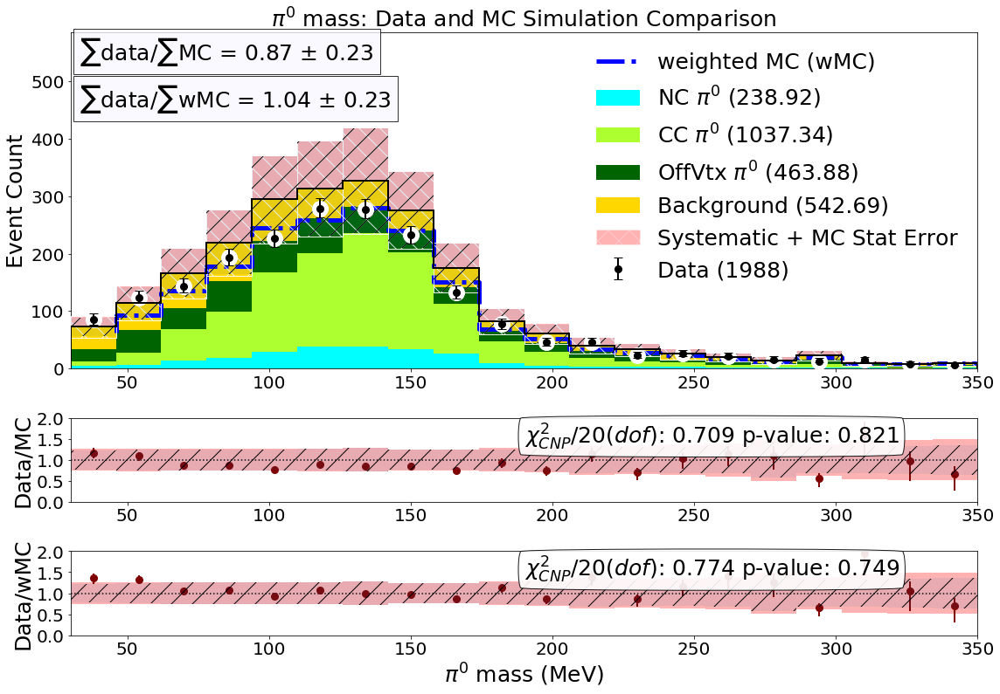

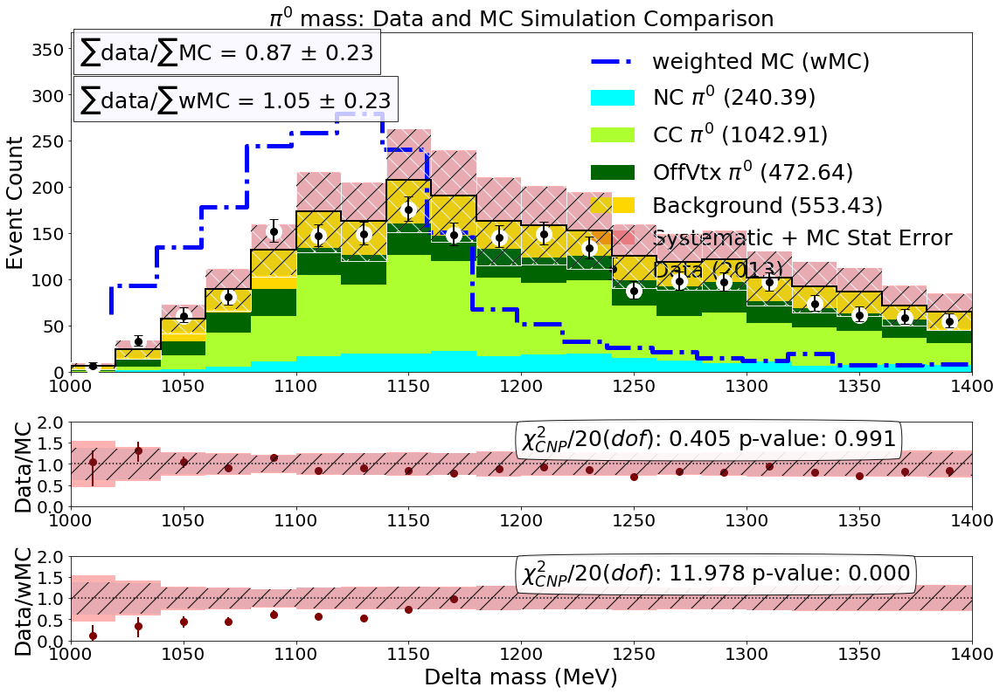

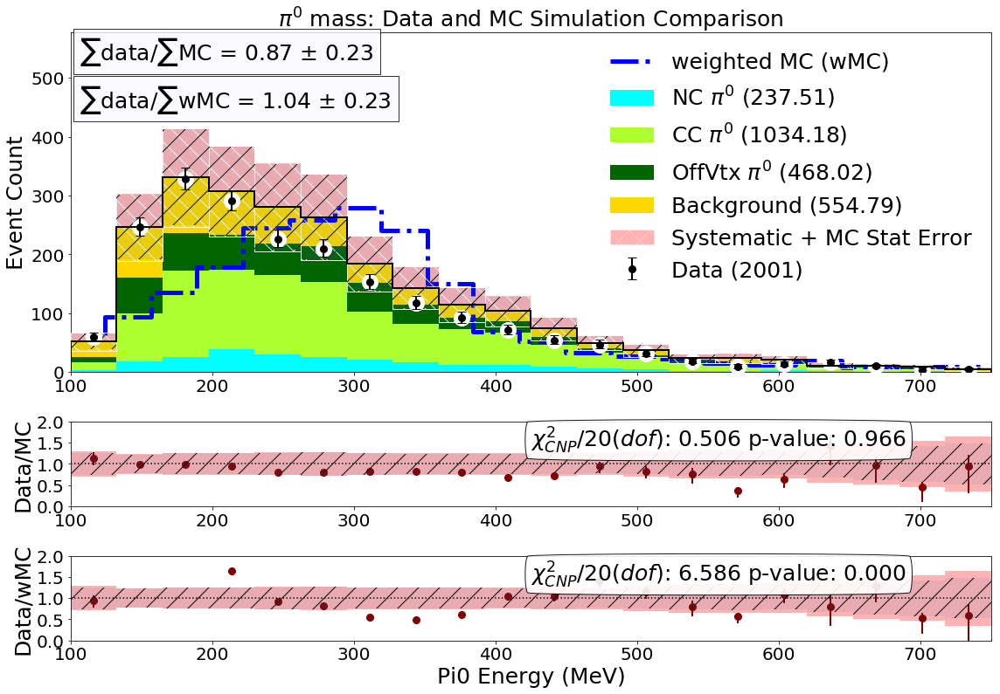

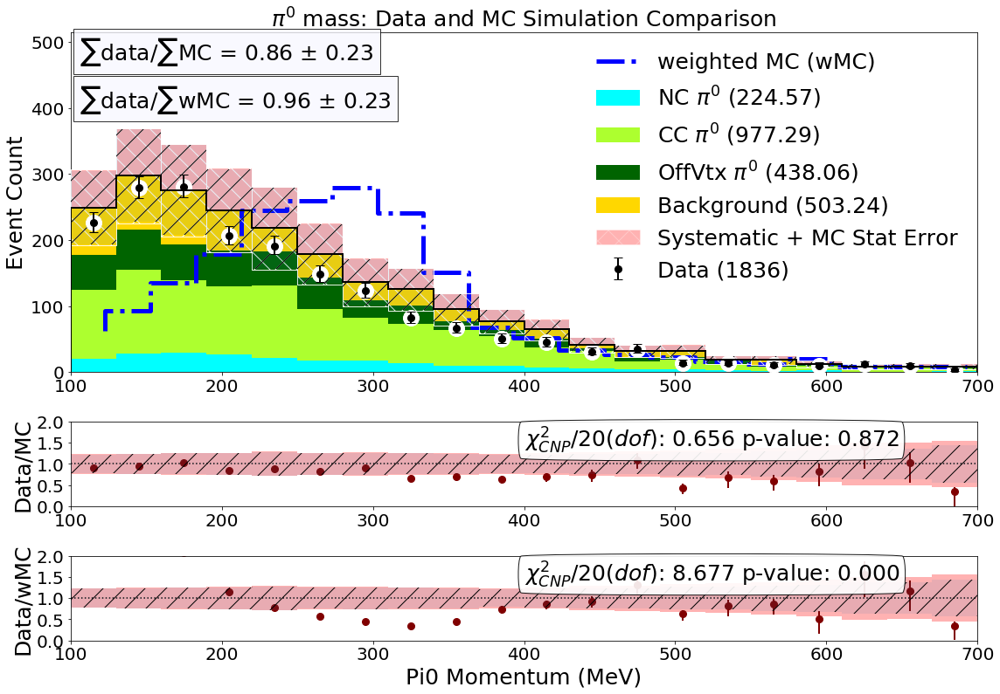

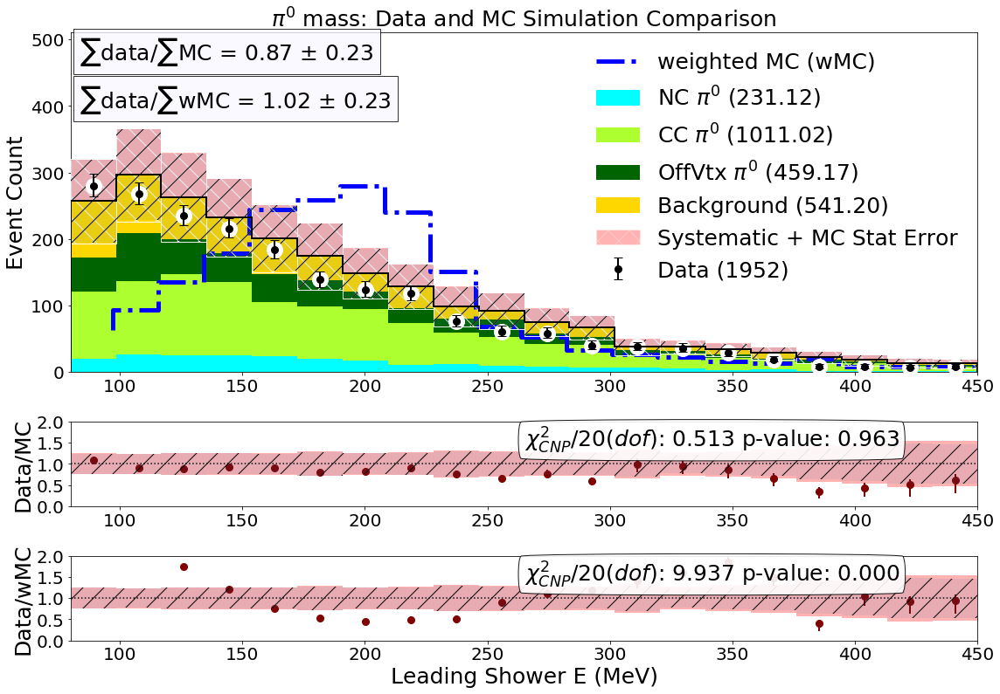

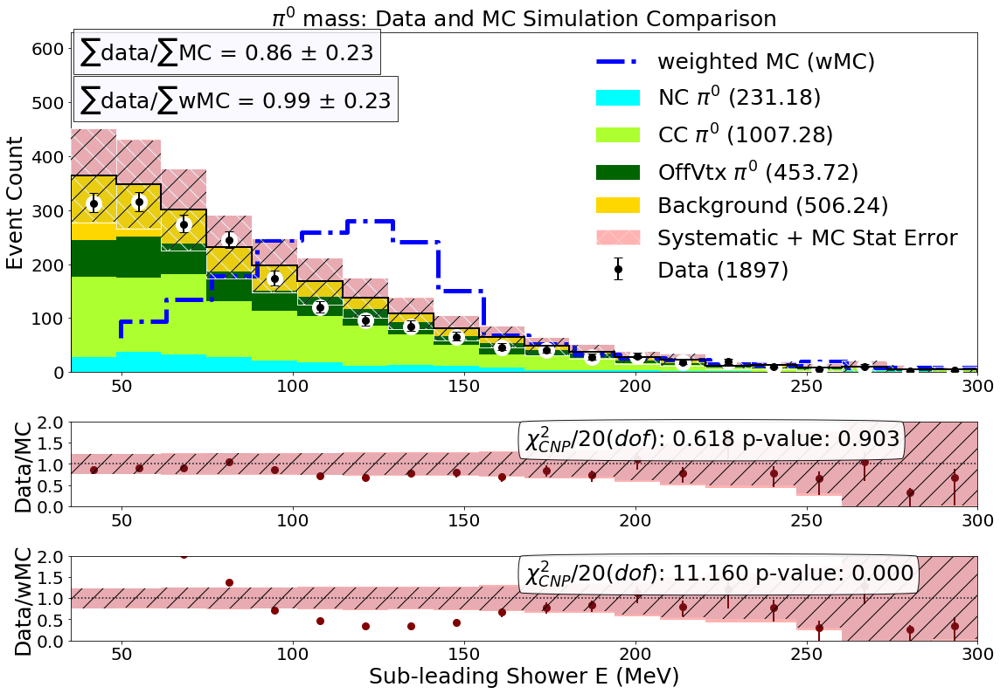

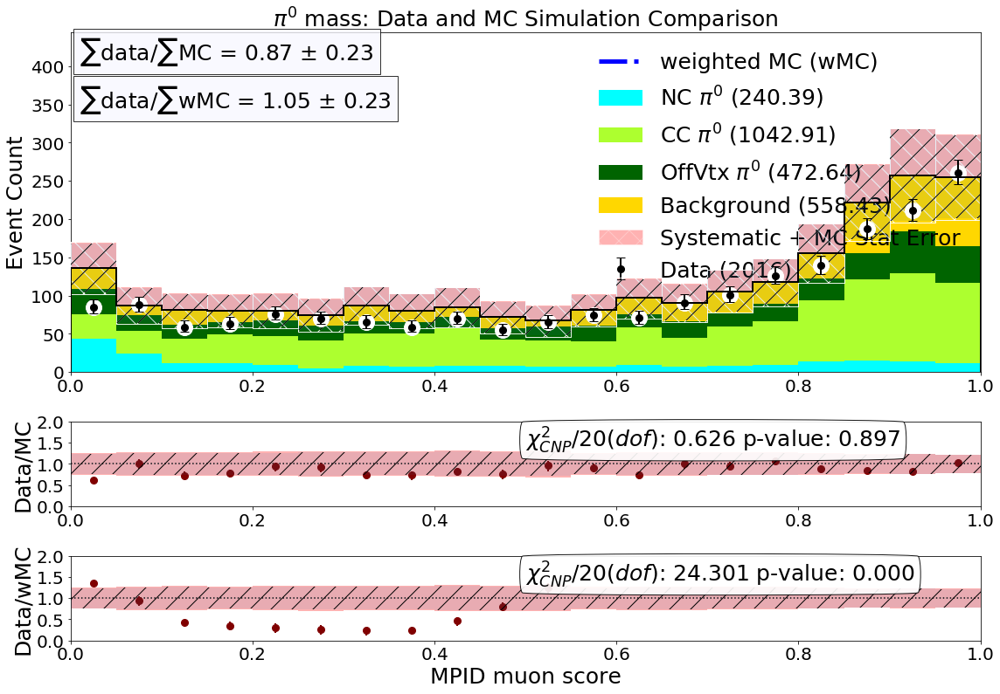

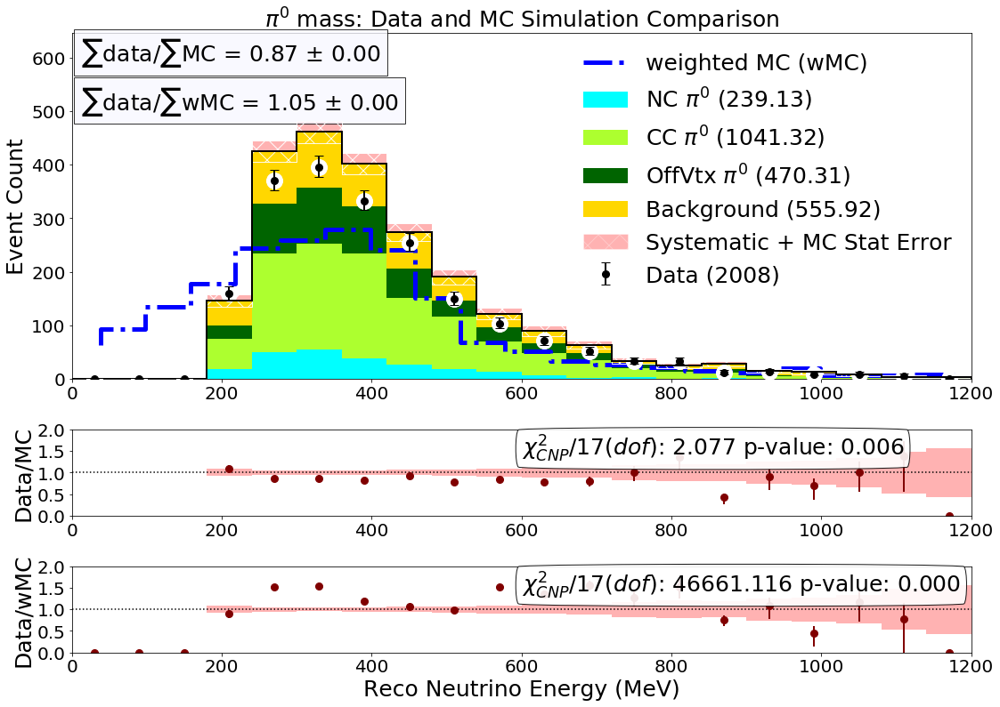

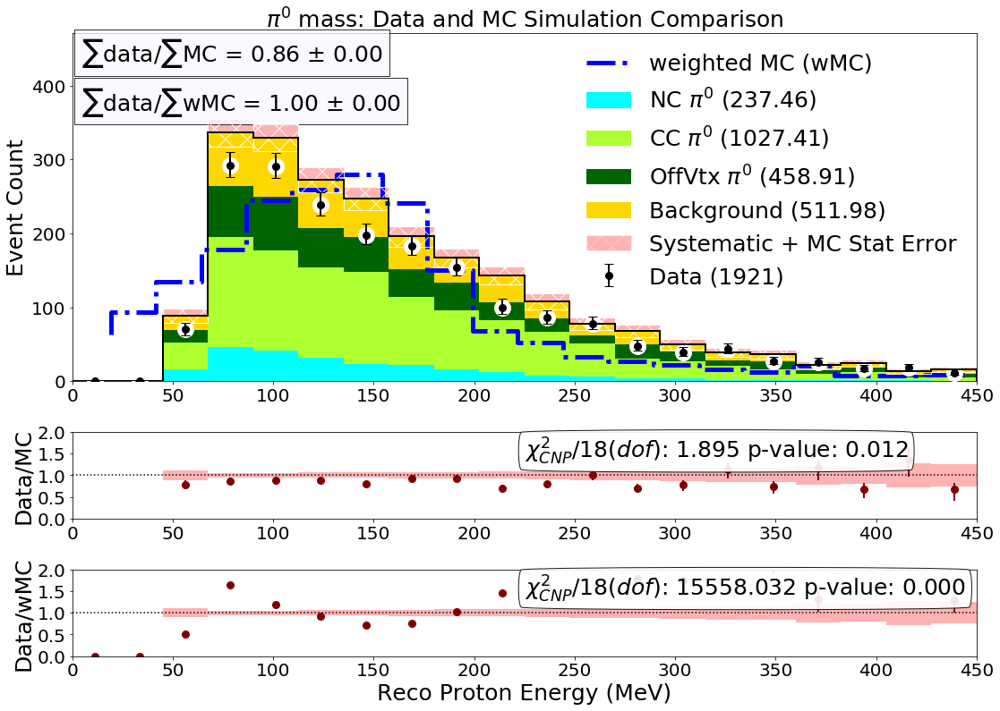

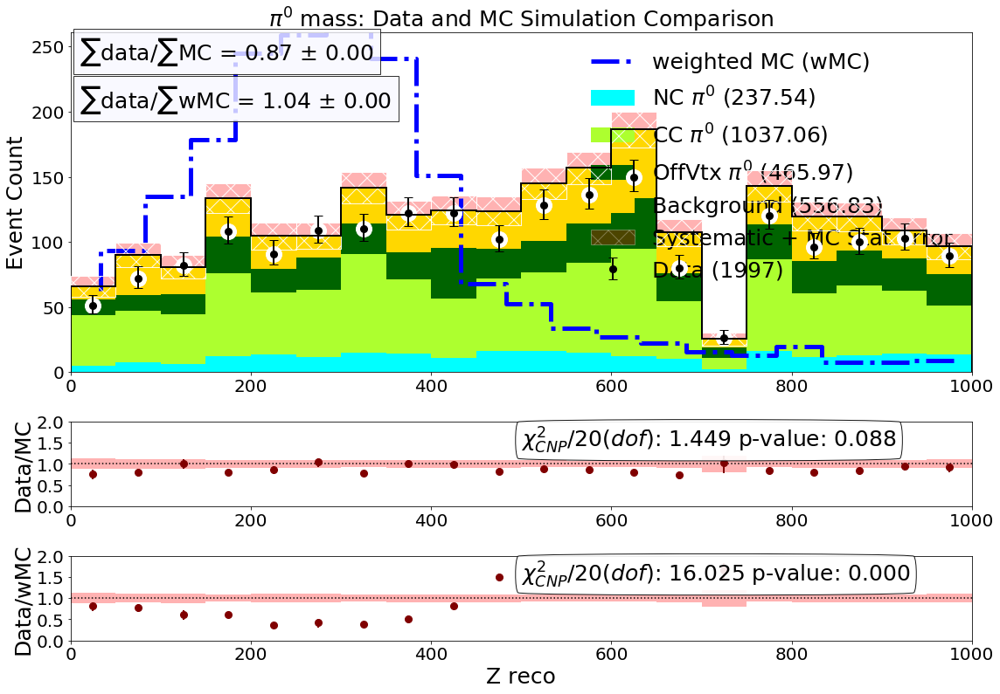

In [43]:
#reset new weights column
# df_numu_total.drop(['new_weight'], axis=1)
# df_nue_total.drop(['new_weight'], axis=1)
# df_ccpi0_total.drop(['new_weight'], axis=1)
# df_ncpi0_total.drop(['new_weight'], axis=1)
norm = 1.0
print()
print('xsec_corr_weight' in df_nue_total.keys())
df_ext_total['haspi0']=np.zeros(len(df_ext_total))
df_ext_total['MC_parentPDG']=np.zeros(len(df_ext_total))
df_numu_total2=df_numu_total.append(df_ext_total)
weighted_hist=[ 62.78,93.34,135.18,178.18,244.94,258.84,279.47,240.89,150.82,68.18,52.16,33.43,26.84,22.35,15.72,12.79,19.89,7.68,7.66,8.54]
with PdfPages('output_combined_20210205_highstatsrun1.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]
        
        if sys_list[i] == 'none':
            s_cov = np.zeros((nbins,nbins))
        else:
            s_cov = np.genfromtxt(sys_list[i],delimiter=',')
        
        
        if detvar1_list[i] == 'none':
            d_cov = np.zeros((nbins,nbins))
        else:
            d_cov1 = np.genfromtxt(detvar1_list[i],delimiter=',')
            d_cov3 = np.genfromtxt(detvar3_list[i],delimiter=',')
            d_cov = ((DATA_R1_PI0FILTER_POT)*d_cov1 + (DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)*d_cov3)/(DATA_R1_PI0FILTER_POT+DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)
        
        cov = s_cov +d_cov
        
        covw = np.genfromtxt('../systematics/covar_cv_weighted__pi0_mass_reco.txt',delimiter=',') + d_cov
#         cov = np.zeros((nbins,nbins))
#         print('xsec_corr_weight' in df_ccpi0_total.keys())
        run1_open_Hists = StackedHisto((df_numu_total2.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14 or MC_parentPDG==0'),df_nue_total.query('MC_parentPDG == 12'),df_ncpi0_total,df_ccpi0_total),(1.0,1.0,1.0,1.0))
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run1_open_Hists.AddStrata(' haspi0==0 ',r"Background",'gold')
#         run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx background events",'gold')
#         run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"$\nu_\mu$ background events",'grey')
#         run1_open_Hists.AddStrata('MC_parentPDG ==12 and haspi0==0',r"$\nu_e$ background events",'pink')
#         run1_open_Hists.AddLayer(df_ext_total,df_ext_total['pot_weight'],1.0,'Cosmic Background','gold')
        run1_open_DataHist = SimpleHisto(df_data_total,1.0,0,'','Data')
        fig1,ax1,_,a = distplot_w2ratio(vartest,nbins,myrange,run1_open_Hists,weighted_hist,run1_open_DataHist,varname,m_cov=cov,m_covw=covw)
#         ax1.text(50,450, 'MicroBooNE',
#         color='black', fontsize=24)
        ax1.set_title(r"$\pi^0$ mass: Data and MC Simulation Comparison",fontsize=25)
#         ax1.set_xlabel(varname_list[i],fontsize=25)
        ax1.set_ylabel('Event Count',fontsize=25)
        fig1.savefig(vartest_list[i]+'_20210830_CC.png')

In [27]:
# # plot the resolution distributions

# first cut for events with a true pi0 with two contained showers.
contained_pi0='haspi0==1 and shower_energy_true >=0 and secondshower_energy_true >=0 '
df_numu_total.query(contained_pi0+'and (newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14')
df_nue_total.query(contained_pi0+'and MC_parentPDG ==12')
df_ncpi0_total.query(contained_pi0)
df_ccpi0_total.query(contained_pi0)

df_nue_r1=df_nue_goodruns_pmtprecut.query("MC_scedr<5 and haspi0==0 and shower_energy_true >=0 and shower1_E_Y_new>=0 and BDTscore_1e1p >.7 ")
df_nue_r2=df_nue_r2_goodruns_pmtprecut.query("MC_scedr<5 and haspi0==0 and shower_energy_true >=0 and shower1_E_Y_new>=0 and BDTscore_1e1p >.7")
df_nue_r3=df_nue_r3_goodruns_pmtprecut.query("MC_scedr<5 and haspi0==0 and shower_energy_true >=0 and shower1_E_Y_new>=0 and BDTscore_1e1p >.7")

def getangleres(df):
#     funtion to get the angle between true and reco shower directions
    angleres= []
    for i in range(len(df)):
        recox1 = df['shower1_dir_3d_X'].values[i]
        recoy1 = df['shower1_dir_3d_Y'].values[i]
        recoz1 = df['shower1_dir_3d_Z'].values[i]
        recox2 = df['shower2_dir_3d_X'].values[i]
        recoy2 = df['shower2_dir_3d_Y'].values[i]
        recoz2 = df['shower2_dir_3d_Z'].values[i]
        
        truex1 = df['first_direction_true_X'].values[i]
        truey1 = df['first_direction_true_Y'].values[i]
        truez1 = df['first_direction_true_Z'].values[i]
        truex2 = df['second_direction_true_X'].values[i]
        truey2 = df['second_direction_true_Y'].values[i]
        truez2 = df['second_direction_true_Z'].values[i]
        
        dot1 = recox1*recox2+recoy1*recoy2+recoz1*recoz2
        dot2 = truex1*truex2+truey1*truey2+truez1*truez2
        
        magreco1 = sqrt(recox1**2+recoy1**2+recoz1**2)             
        magreco2 = sqrt(recox2**2+recoy2**2+recoz2**2)
        magtrue1 = sqrt(truex1**2+truey1**2+truez1**2)             
        magtrue2 = sqrt(truex2**2+truey2**2+truez2**2) 
        
        cosdir1 = dot1/(magreco1*magreco2)
        cosdir2 = dot2/(magtrue1*magtrue2)
        alpha1 = acos(cosdir1) * 180.0 / 3.14159
        alpha2 = acos(cosdir2) * 180.0 / 3.14159

        angleres.append((alpha1-alpha2)/alpha2)

    return angleres




def getenergyres(df):
#     funtion to get the angle between true and reco shower directions
    energyres1 = []
    energyres2 = []
    for i in range(len(df)):
        reco1 = df['shower1_E_Y_new'].values[i]
        reco2 = df['shower2_E_Y_new'].values[i]
        if(reco2 >reco1):
            reco2 = df['shower1_E_Y_new'].values[i]
            reco1 = df['shower2_E_Y_new'].values[i]
        true1 = df['gamma_1_true'].values[i]
        true2 = df['gamma_2_true'].values[i]
        if (true2>true1):
            true2 = df['gamma_1_true'].values[i]
            true1 = df['gamma_2_true'].values[i]
        print(true1,true2)
        
        energyres1.append((reco1-true1)/true1)
        energyres2.append((reco2-true2)/true2)
#         energyres2.append(-999)

    return energyres1,energyres2

def getenergyres_e(df):
#     funtion to get the angle between true and reco shower directions
    energyres1 = []
    for i in range(len(df)):
        reco1 = df['shower1_E_Y_new'].values[i]
        true1 = df['evis_lep'].values[i]    
        energyres1.append((reco1-true1))
    return energyres1


# add all of the data frames
# df_data_total = df_fakedata1_run1_pi0.append(df_fakedata1_run3_pi0)
df_data_total_1 = df_data_r1_pi0filter_pi0.append(df_data_r3F_pi0filter_pi0)
df_data_total = df_data_total_1.append(df_data_r3G_pi0filter_pi0)

print("total number of data pi0: ",len(df_data_total['_pi0mass'].values))
# scale CV weights:
def potscale(df,scalefactor=1.0,ext=False):
    pot_weight = []
    for i in range(len(df)):
        if ext==False:
            pot_weight.append(scalefactor)
        else:
            pot_weight.append(scalefactor)
    return pot_weight

# general mc
w_cc_1 =potscale(df_ccpi0_r1_pi0,DATA_R1_PI0FILTER_POT/CCPI0_R1_POT)
w_cc_3 =potscale(df_ccpi0_r3_pi0,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(CCPI0_R3_POT))
df_ccpi0_r1_pi0['pot_weight'] = w_cc_1
df_ccpi0_r3_pi0['pot_weight'] = w_cc_3
df_ccpi0_total = df_ccpi0_r1_pi0.append(df_ccpi0_r3_pi0)

w_nc_1 =potscale(df_ncpi0_r1_pi0,DATA_R1_PI0FILTER_POT/NCPI0_R1_POT)
w_nc_3 =potscale(df_ncpi0_r3_pi0,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT))
df_ncpi0_r1_pi0['pot_weight'] = w_nc_1
df_ncpi0_r3_pi0['pot_weight'] = w_nc_3
df_ncpi0_total = df_ncpi0_r1_pi0.append(df_ncpi0_r3_pi0)

                 


a1_cc = getangleres(df_ccpi0_total)
e1_cc,e2_cc = getenergyres(df_ccpi0_total)
df_ccpi0_total["AngleRes"]=a1_cc
# df_ccpi0_total["AngleRes2"]=a2_cc
df_ccpi0_total["EnergyRes1"]=e1_cc
df_ccpi0_total["EnergyRes2"]=e2_cc

a1_nc = getangleres(df_ncpi0_total)
e1_nc,e2_nc = getenergyres(df_ncpi0_total)
df_ncpi0_total["AngleRes"]=a1_nc
# df_ncpi0_total["AngleRes2"]=a2_nc
df_ncpi0_total["EnergyRes1"]=e1_nc
df_ncpi0_total["EnergyRes2"]=e2_nc


e1_nc = getenergyres_e(df_nue_r1)
df_nue_r1["EnergyRes1"]=e1_nc
e2_nc = getenergyres_e(df_nue_r2)
df_nue_r2["EnergyRes1"]=e2_nc
e3_nc = getenergyres_e(df_nue_r3)
df_nue_r3["EnergyRes1"]=e3_nc


total number of data pi0:  108
223.34574753135297 97.8074956011214
133.3697500528421 54.65488761156525
144.32370937064627 55.21364186844629
142.09396705836474 101.68913894341709
240.42505116164236 83.59394868863494
242.48922229893873 226.5259710739432
90.37914784183293 69.38844190179951
109.51016637417338 53.96003163170545
196.34456508337877 178.84321915356327
184.39964207062667 47.47102431820847
189.3471400765062 52.25234811601852
258.10439814006844 45.15021822046724
481.88769097181586 59.02709671051453
140.07901056152824 87.36972800711341
111.12975434740557 81.67607574664788
106.15664943511752 98.87077403175773
136.09830545492122 77.20659089308595
182.40612320480395 92.95325363749156
74.17356123152383 71.809506827837
259.4429776233569 38.60258635078831
158.20044775331482 63.01947377090981
233.64799889860774 179.8877772683818
222.28927143592898 57.934775169024284
140.16513988647074 93.89545065339478
153.03375200015836 35.67501043820566
214.87737789833122 182.61454122225413
120.4709183

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in true_divide


174.94911181996994 36.675825189132034
234.65675916294296 148.19375924772774
176.46201355172923 34.86035393008606
328.9083510077107 109.46714824895066
165.77576445262764 55.309465045218396
118.32786292090893 62.985934777746735
309.65559361343577 49.38533217805916
193.3933447804197 187.53639784371185
167.80484779119513 59.66716957262012
420.1246983834381 181.36147566096494
202.18854688072358 114.12364838046156
224.15425481170215 65.77039467063662
202.00979390257842 143.63528139699253
278.8382970513368 28.722008171832538
121.93684595758141 103.22152034066859
122.61867507838497 84.32462065889625
351.55425557652984 171.18278007670136
138.96499772159706 58.5445241129176
203.5852346882236 37.577556846838704
128.5662562155764 100.91353996741606
94.13952819847228 77.40351962932259
253.47020811627334 116.74977322717871
149.52995334808315 54.933547213880374
205.7154796499937 138.22900523170284
325.74107172954973 52.86986662222627
233.9220443780832 18.49064726965688
194.49984668908647 34.278102046

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:133: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:135: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/in

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/kmason/.local/lib/python3.5/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


480
500
540
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.41032534 0.41032534 0.41032534]
hstack gh_scale [1. 1. 1. ... 1. 1. 1.]
[ 0.          1.20991457  2.34037079  3.21637947  5.53560558  9.03618639
 14.51308516  7.832416    3.52016259  3.03619267  2.4334754   1.00258485
  0.41330519  1.03716713  1.39176552  1.07472926  0.70338301  0.21793341
  0.69136236  0.29305767]


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/kmason/.local/lib/python3.5/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


480
500
540
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.41032534 0.41032534 0.41032534]
hstack gh_scale [1. 1. 1. ... 1. 1. 1.]
[ 0.4704491   1.37218374  3.17583749 10.04762092 10.64223167 19.17092017
 21.66854717 20.45391973  7.21958943  1.62626232  0.54855321  0.68696556
  0.          0.19537178  0.09768589  0.06012376  0.          0.09768589
  0.15780965  0.27805717]


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/kmason/.local/lib/python3.5/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


480
500
540
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.41032534 0.41032534 0.41032534]
hstack gh_scale [1. 1. 1. ... 1. 1. 1.]
[ 0.          2.00293302  5.29529502  8.60075125 11.25778933 12.33746883
 16.30237875 20.13949437 11.30209744  2.08871196  4.02842102  0.80721308
  0.35318143  1.23253891  0.          0.21793341  0.53057286  0.60569712
  0.06012376  0.        ]


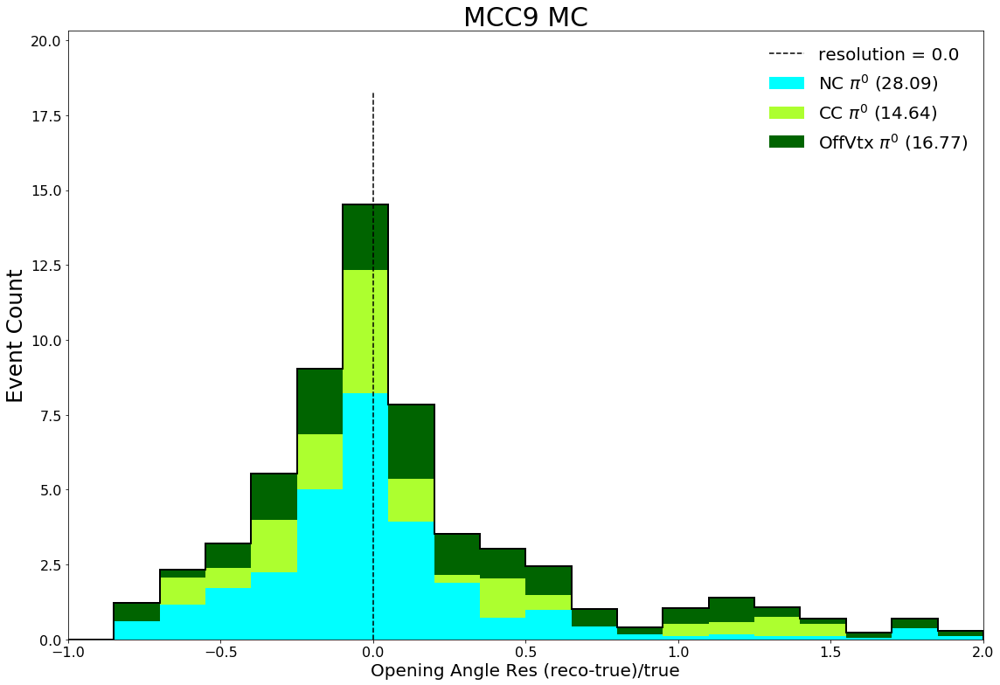

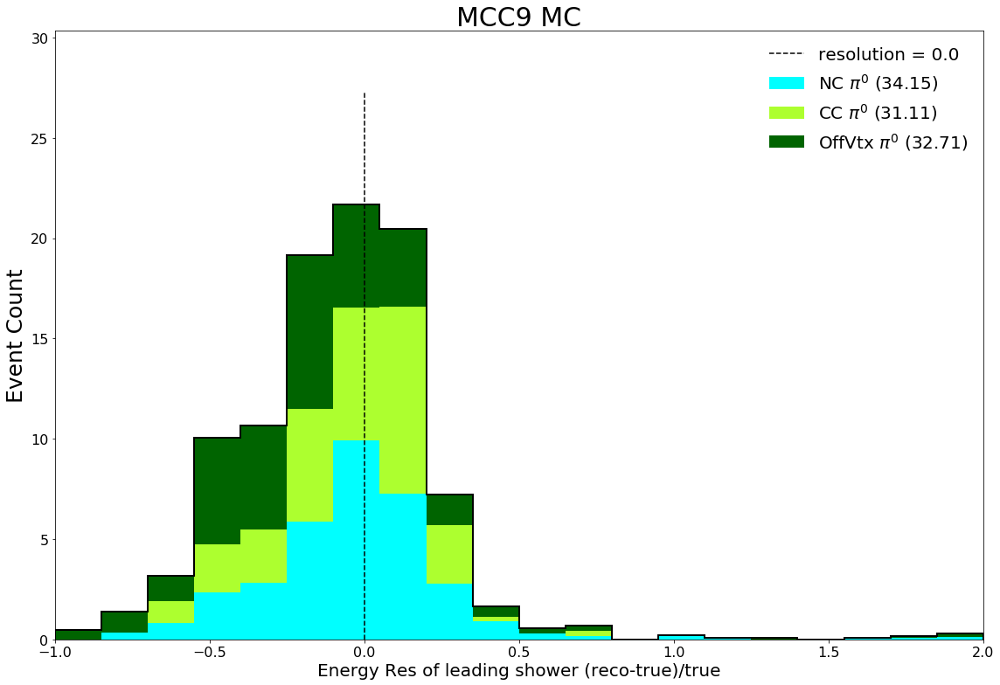

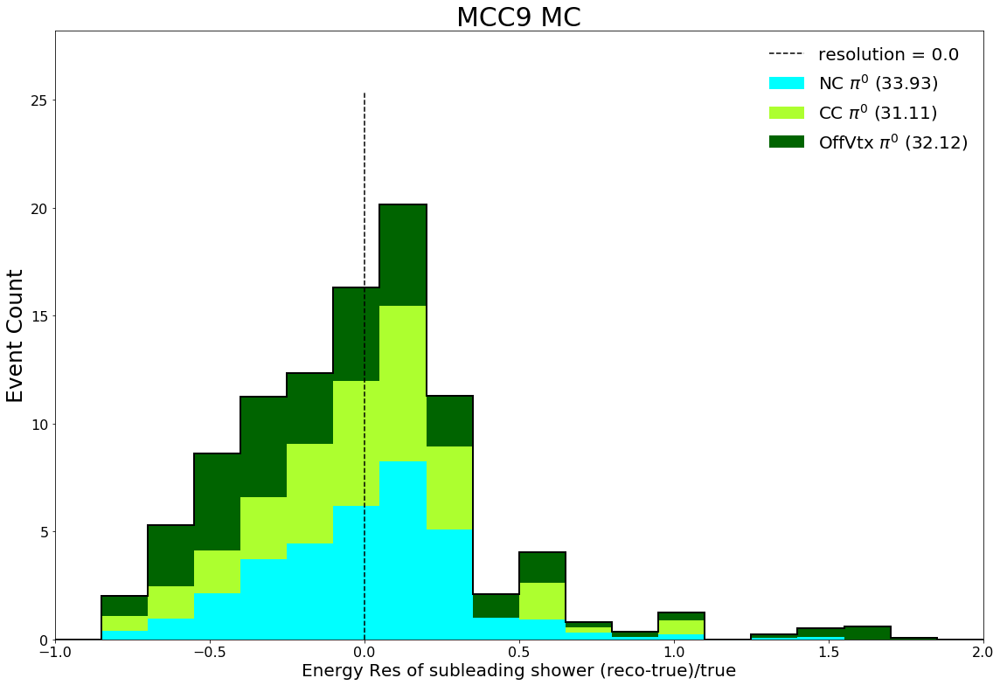

In [28]:
vartest_list = []
varname_list = []
myrange_list = []
detvar_list  = []
sys_list = []
bins_list = []


vartest_list.append('AngleRes')
varname_list.append('Opening Angle Res (reco-true)/true')
# myrange_list.append((-1,1))
myrange_list.append((-1,2))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)

# vartest_list.append('AngleRes2')
# varname_list.append('Cosine Angle between true and reco subleading showers')
# myrange_list.append((-1,1))
# # myrange_list.append((0,180))
# detvar_list.append('none')
# sys_list.append('none')
# bins_list.append(20)

vartest_list.append('EnergyRes1')
varname_list.append('Energy Res of leading shower (reco-true)/true')
myrange_list.append((-1,2))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)

vartest_list.append('EnergyRes2')
varname_list.append('Energy Res of subleading shower (reco-true)/true')
myrange_list.append((-1,2))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)



for i in range(len(vartest_list)):
    vartest = vartest_list[i]
    varname = varname_list[i]
    myrange = myrange_list[i]
    nbins =bins_list[i]

    cov = np.zeros((nbins,nbins))
    run1_open_Hists = StackedHisto((df_numu_total.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14'),df_nue_total.query('MC_parentPDG ==12'),df_ncpi0_total,df_ccpi0_total),(1.0,1.0,1.0,1.0))
    run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
    run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
    run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=2 ',r"OffVtx $\pi^0$",'darkgreen')
#     run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx background events",'gold')
#     run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"$\nu_\mu$ background events",'grey')
# #         run1_open_Hists.AddStrata('MC_parentPDG ==14',r"$\nu_mu$ events",'blue')
#     run1_open_Hists.AddStrata('MC_parentPDG ==12 and haspi0==0',r"$\nu_e$ background events",'pink')
    fig1,ax1 = distplot_mc(vartest,nbins,myrange,run1_open_Hists,varname)
    fig1.savefig(vartest_list[i]+'_20210413.png')
    

In [29]:
# save list of variables for selected events
near_costheta_e =[0.576, 0.515, 0.337, -0.069, 0.775, 0.028, 0.769]
near_costheta_p =[0.727, 0.600, 0.852, 0.764, 0.463, 0.878, 0.570]
near_recoE1=[436.74, 503.95, 319.23, 371.42, 504.92, 368.17, 409.80]
near_recoE2=[50.8, 29.6, 7.7, 89.2, 51.7, 11.6, 0.0]
near_recoEp=[209.89, 104.95, 286.10, 223.25, 67.35, 187.31, 73.52]
near_r = [5385, 9727, 10807, 6622, 8590, 10882, 14059]
near_s = [194, 138,82,96,136,63,2]
near_e = [9704, 6929, 4146, 4829, 6839, 3189, 126]
near_Econs=[]
for i in range(len(near_recoE1)):
    near_Econs.append((near_recoE1[i]-near_recoE2[i])/(near_recoE1[i]+near_recoE2[i]))
    
far_costheta_e =[0.928, 0.796, 0.741, 0.793, 0.743, 0.710, 0.704, -0.092, 0.796, 0.653, 0.858, 0.863]
far_costheta_p =[0.398, 0.277, 0.387, 0.610, 0.862, 0.683, 0.558, 0.867, 0.371, 0.576, 0.343, 0.412]
far_recoE1=[663.86, 922.34, 590.03, 704.79, 779.11, 635.63, 693.01, 414.48, 583.04, 668.71, 697.46, 604.13]
far_recoE2=[54.7, 33.7 ,7.8, 2.0,2.0, 16.9, 31.5, 5.9, 8, 0, 0, 0]
far_recoEp=[70.90, 107.25, 108.20, 154.68, 66.95, 170.03, 158.22, 367.99, 280.37, 153.65, 125.17, 125.85]
far_r=[5418, 6046, 6205, 8404, 8549, 9367, 10704, 10725, 11182, 14955, 15289, 17344]
far_s=[119, 72, 93, 231, 21, 27, 168, 43, 177, 83, 10, 49]
far_e = [5988, 3633, 4668, 11567, 1074, 1363, 8406, 2181, 8875, 4197, 502, 2495]
far_Econs=[]
for i in range(len(far_recoE1)):
    far_Econs.append((far_recoE1[i]-far_recoE2[i])/(far_recoE1[i]+far_recoE2[i]))

/home/kmason/.local/lib/python3.5/site-packages/pandas/core/frame.py:6692: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


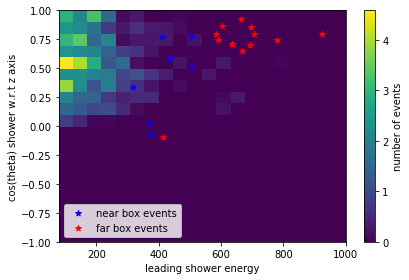

In [30]:
# make 2d hist:
import matplotlib

dftest1= df_ncpi0_total.append(df_ccpi0_total)
dftest2= dftest1.append(df_numu_total.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14'))
dftest= dftest2.append(df_nue_total.query('MC_parentPDG == 12'))


var_e =dftest['shower1_E_Y_new'].values
var_e2 =dftest['shower2_E_Y_new'].values
var_w1=dftest['pot_weight'].values
var_w2=dftest['xsec_corr_weight'].values

var_cos_reco =dftest['Lepton_ThetaReco'].values
var_cos = []
var_w = []
for i in range(len(dftest)):
#     mag = math.sqrt(var_x[i]**2+var_y[i]**2+var_z[i]**2)
#     var_cos.append((var_x[i]+var_y[i])/mag)
    var_cos.append((var_e[i]-var_e2[i])/(var_e[i]+var_e2[i]))
    var_w.append(var_w1[i]*var_w2[i])

plt.hist2d(var_e, var_cos_reco, bins=(20,20), range = ((80,1000),(-1,1)),weights=var_w)
plt.plot(far_recoE1[5],far_costheta_e[5],marker="*",color='red')
plt.xlabel('leading shower energy')
plt.ylabel('cos(theta) shower w.r.t z axis')
plt.colorbar(label='number of events')
plt.tight_layout()
plt.scatter(near_recoE1,near_costheta_e,marker="*",color='blue',label="near box events")
plt.scatter(far_recoE1,far_costheta_e,marker="*",color='red',label='far box events')
plt.legend(loc="lower left")


plt.savefig('event15254_coss_vs_Es.png')

# plt.show()



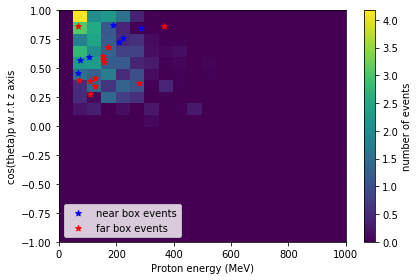

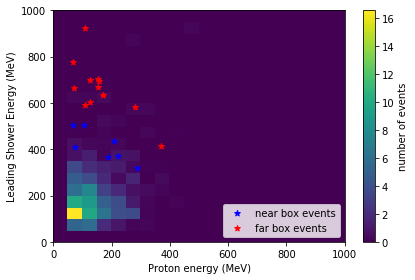

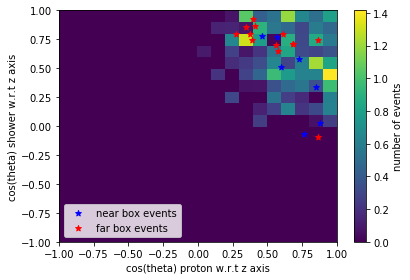

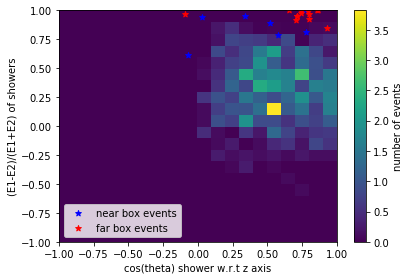

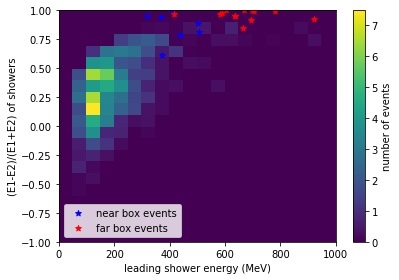

In [31]:

var_ep =dftest['Proton_Edep'].values
var_eg1 =dftest['shower1_E_Y_new'].values
var_eg2 =dftest['shower2_E_Y_new'].values
var_w1=dftest['pot_weight'].values
var_w2=dftest['xsec_corr_weight'].values
var_cosp=dftest['Proton_ThetaReco'].values
var_cosg_reco=dftest['Lepton_ThetaReco'].values
var_cosg = []


var_w = []
for i in range(len(dftest)):
    var_w.append(var_w1[i]*var_w2[i])
    var_cosg.append((var_eg1[i]-var_eg2[i])/(var_eg1[i]+var_eg2[i]))

plt.hist2d(var_ep, var_cosp, bins=(20, 20), range = ((0,1000),(-1,1)),weights=var_w)
plt.plot(far_recoEp[5],far_costheta_p[5],marker="*",color='red')

plt.xlabel('Proton energy (MeV)')
plt.ylabel('cos(theta)p w.r.t z axis')
plt.colorbar(label='number of events')
plt.tight_layout()
plt.scatter(near_recoEp,near_costheta_p,marker="*",color='blue',label="near box events")
plt.scatter(far_recoEp,far_costheta_p,marker="*",color='red',label='far box events')
plt.legend(loc="lower left")
plt.savefig('event_cosp_vs_Ep.png')
plt.show()
plt.close()

# plt.show()
plt.hist2d(var_ep, var_eg1, bins=(20, 20), range = ((0,1000),(0,1000)),weights=var_w)
plt.plot(far_recoEp[5],far_recoE1[5],marker="*",color='red')

plt.xlabel('Proton energy (MeV)')
plt.ylabel('Leading Shower Energy (MeV)')
plt.colorbar(label='number of events')
plt.tight_layout()
plt.scatter(near_recoEp,near_recoE1,marker="*",color='blue',label="near box events")
plt.scatter(far_recoEp,far_recoE1,marker="*",color='red',label='far box events')
plt.legend(loc="lower right")
plt.savefig('event_Ep_vs_Es.png')
plt.show()
plt.close()

plt.hist2d(var_cosp, var_cosg_reco, bins=(20, 20), range = ((-1,1),(-1,1)),weights=var_w)
plt.plot(far_costheta_p[5],far_costheta_e[5],marker="*",color='red')

plt.xlabel('cos(theta) proton w.r.t z axis')
plt.ylabel('cos(theta) shower w.r.t z axis')
plt.tight_layout()
plt.colorbar(label='number of events')
plt.scatter(near_costheta_p,near_costheta_e,marker="*",color='blue',label="near box events")
plt.scatter(far_costheta_p,far_costheta_e,marker="*",color='red',label='far box events')
plt.legend(loc="lower left")
plt.savefig('event_coss_vs_cosp.png')
plt.show()
plt.close()


plt.hist2d(var_cosg_reco,var_cosg, bins=(20, 20), range = ((-1,1),(-1,1)),weights=var_w)
plt.plot(far_costheta_e[5],far_Econs[5],marker="*",color='red')

plt.ylabel('(E1-E2)/(E1+E2) of showers')
plt.xlabel('cos(theta) shower w.r.t z axis')
plt.tight_layout()
plt.colorbar(label='number of events')
plt.scatter(near_costheta_e,near_Econs,marker="*",color='blue',label="near box events")
plt.scatter(far_costheta_e,far_Econs,marker="*",color='red',label='far box events')
plt.legend(loc="lower left")
plt.savefig('event_asym_vs_coss.png')

plt.show()
plt.close()

plt.hist2d(var_eg1,var_cosg, bins=(20, 20), range = ((0,1000),(-1,1)),weights=var_w)
plt.plot(far_recoE1[5],far_Econs[5],marker="*",color='red')

plt.ylabel('(E1-E2)/(E1+E2) of showers')
plt.xlabel('leading shower energy (MeV)')
plt.tight_layout()
plt.colorbar(label='number of events')
plt.scatter(near_recoE1,near_Econs,marker="*",color='blue',label="near box events")
plt.scatter(far_recoE1,far_Econs,marker="*",color='red',label='far box events')
plt.legend(loc="lower left")
plt.savefig('event_asym_vs_es.png')
plt.show()
plt.close()



-26.674242145058095
-34.11855976041047
-30.48934779268175
-31.670385616913524
-30.569143188283686
-29.565951434884013
-31.592137268378305
-36.22759294820315
-32.96175872274806
-29.55084914354018
-30.63297379854152
-29.65446137039081


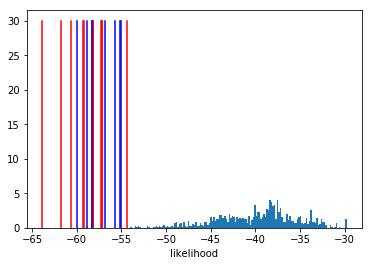

In [32]:
# make a likelihood

# first just get the distributions
dftest1= df_ncpi0_total.append(df_ccpi0_total)
dftest2= dftest1.append(df_numu_total.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14'))
dftest= dftest2.append(df_nue_total.query('MC_parentPDG == 12'))

var_e =dftest['shower1_E_Y_new'].values
var_e2 =dftest['shower2_E_Y_new'].values
var_pi0 =dftest['_pi0mass_new'].values
var_delta =dftest['DeltaMass_new'].values
var_w1=dftest['pot_weight'].values
var_w2=dftest['xsec_corr_weight'].values
var_cos_reco =dftest['Lepton_ThetaReco'].values
var_ep =dftest['Proton_Edep'].values
var_cosp=dftest['Proton_ThetaReco'].values
var_cos = []
var_w = []
for i in range(len(dftest)):
    var_cos.append((var_e[i]-var_e2[i])/(var_e[i]+var_e2[i]))
    var_w.append(var_w1[i]*var_w2[i])



e_y,e_x = np.histogram(var_e,bins = 200, range = [80,1000], weights=var_w)
sum_e =sum(e_y)
for i in range(len(e_y)):
    e_y[i] =e_y[i]/sum_e 
    
pi0_y,pi0_x = np.histogram(var_pi0,bins = 200, range = [0,350], weights=var_w)
sum_pi0 =sum(pi0_y)
for i in range(len(pi0_y)):
    pi0_y[i] =pi0_y[i]/sum_pi0 
    
delta_y,delta_x = np.histogram(var_delta,bins = 200, range = [1000,1400], weights=var_w)
sum_delta =sum(delta_y)
for i in range(len(delta_y)):
    delta_y[i] =delta_y[i]/sum_delta 
    
e2_y,e2_x = np.histogram(var_e2,bins = 200, range = [35,1000], weights=var_w)
sum_e2 =sum(e2_y)
for i in range(len(e2_y)):
    e2_y[i] =e2_y[i]/sum_e2 
    
cos_y,cos_x = np.histogram(var_cos,bins = 200, range = [-1,1], weights=var_w)
sum_e =sum(cos_y)
for i in range(len(cos_y)):
    cos_y[i] =cos_y[i]/sum_e 

reco_y,reco_x = np.histogram(var_cos_reco,bins = 200, range = [-1,1], weights=var_w)
sum_e =sum(reco_y)
for i in range(len(reco_y)):
    reco_y[i] =reco_y[i]/sum_e

ep_y,ep_x = np.histogram(var_ep,bins = 200, range = [35,1000], weights=var_w)
sum_e =sum(ep_y)
for i in range(len(ep_y)):
    ep_y[i] =ep_y[i]/sum_e
    
cosp_y,cosp_x = np.histogram(var_cosp,bins = 200, range = [-1,1], weights=var_w)
sum_e =sum(cosp_y)
for i in range(len(cosp_y)):
    cosp_y[i] =cosp_y[i]/sum_e 


    

#get bins
L=[]
for i in range(len(dftest)):
    e_bin=-1
    if var_e[i]<1000 and var_e[i]>80:
        for bins in range(len(e_x)):
            if var_e[i] > (e_x[bins]):
                e_bin =bins
    if e_bin>=0:
        logprob_e = e_y[e_bin]
    else:
        logprob_e =0.0001
    if logprob_e < 0.0001:
        logprob_e = 0.0001
        
    e2_bin=-1
    if var_e2[i]<1000 and var_e2[i]>35:
        for bins in range(len(e2_x)):
            if var_e2[i] > (e2_x[bins]):
                e2_bin =bins
    if e2_bin>=0:
        logprob_e2 = e2_y[e2_bin]
    else:
        logprob_e2 =0.0001
    if logprob_e2 < 0.0001:
        logprob_e2 = 0.0001
#     print(e_bin,var_e[i],e_y[e_bin])
  
    reco_bin=-1
    if var_cos_reco[i]<1 and var_cos_reco[i]>-1:
        for bins in range(len(reco_x)):
            if var_cos_reco[i] > (reco_x[bins]):
                reco_bin =bins
    if reco_bin>=0:
        logprob_reco = reco_y[reco_bin]
    else:
        logprob_reco =0.0001
    if logprob_reco < 0.0001:
        logprob_reco= 0.0001
    
    cos_bin=-1
    if var_cos[i]<1 and var_cos[i]>-1:
        for bins in range(len(cos_x)):
            if var_cos[i] > (cos_x[bins]):
                cos_bin =bins
    if  cos_bin>=0:
        logprob_cos = cos_y[cos_bin]
    else:
        logprob_cos =0.0001
    if logprob_cos < 0.0001:
        logprob_cos= 0.0001
        
    ep_bin=-1
    if var_ep[i]<1000 and var_ep[i]>80:
        for bins in range(len(ep_x)):
            if var_ep[i] > (ep_x[bins]):
                ep_bin =bins
    if ep_bin>=0:
        logprob_ep = ep_y[ep_bin]
    else:
        logprob_ep =0.0001
    if logprob_ep < 0.0001:
        logprob_ep = 0.0001
        
    cosp_bin=-1
    if var_cosp[i]<1 and var_cosp[i]>-1:
        for bins in range(len(cosp_x)):
            if var_cosp[i] > (cosp_x[bins]):
                cosp_bin =bins
    if  cosp_bin>=0:
        logprob_cosp = cosp_y[cosp_bin]
    else:
        logprob_cosp = 0.0001
    if logprob_cosp < 0.0001:
        logprob_cosp = 0.0001
        
    pi0_bin=-1
    if var_pi0[i]<350 and var_pi0[i]>0:
        for bins in range(len(pi0_x)):
            if var_pi0[i] > (pi0_x[bins]):
                pi0_bin =bins
    if  pi0_bin>=0:
        logprob_pi0 = pi0_y[pi0_bin]
    else:
        logprob_pi0 = 0.0001
    if logprob_pi0 < 0.0001:
        logprob_pi0 = 0.0001
        
    delta_bin=-1
    if var_delta[i]<1400 and var_delta[i]>1000:
        for bins in range(len(delta_x)):
            if var_delta[i] > (delta_x[bins]):
                delta_bin =bins
    if  delta_bin>=0:
        logprob_delta = delta_y[delta_bin]
    else:
        logprob_delta = 0.0001
    if logprob_delta < 0.0001:
        logprob_delta = 0.0001
        
   
    L.append(math.log(logprob_delta)+math.log(logprob_pi0)+math.log(logprob_e)+math.log(logprob_e2)+math.log(logprob_cos)+math.log(logprob_reco)+math.log(logprob_ep)+math.log(logprob_cosp))
#     L.append(math.log(logprob_reco))


logprob_e_far = [0.0001 for i in range(len(far_recoE1))]
for i in range(len(far_recoE1)):
    e_bin=-1
    for bins in range(len(e_x)):
        if far_recoE1[i] > (e_x[bins]):
            e_bin =bins
    if(e_y[e_bin]>0.0001):
        logprob_e_far[i] = e_y[e_bin]


logprob_ep_far = [0.0001 for i in range(len(far_recoE1))]
for i in range(len(far_recoE1)):
    ep_bin=-1
    for bins in range(len(ep_x)):
        if far_recoEp[i] > (ep_x[bins]):
            ep_bin =bins
    if(ep_y[ep_bin]>0.0001):
        logprob_ep_far[i] = ep_y[ep_bin]

    
logprob_reco_far = [0.0001 for i in range(len(far_recoE1))]
for i in range(len(far_recoE1)):
    e_bin=-1
    for bins in range(len(reco_x)):
        if far_costheta_e[i] > (reco_x[bins]):
            e_bin =bins
    if(reco_y[e_bin]>0.0001):
        logprob_reco_far[i] = reco_y[e_bin]

logprob_cos_far = [0.0001 for i in range(len(far_recoE1))]
for i in range(len(far_recoE1)):
    e_bin=-1
    for bins in range(len(cos_x)):
        if far_Econs[i] > (cos_x[bins]):
            e_bin =bins
    if(cos_y[e_bin]>0.0001):
        logprob_cos_far[i] = cos_y[e_bin]

logprob_cosp_far = [0.0001 for i in range(len(far_recoE1))]
for i in range(len(far_recoE1)):
    e_bin=-1
    for bins in range(len(cosp_x)):
        if far_costheta_p[i] > (cosp_x[bins]):
            e_bin =bins
    if(cosp_y[e_bin]>0.0001):
        logprob_cosp_far[i] = cosp_y[e_bin]
    
L_ev_far =[]
for i in range(len(far_recoE1)):
    print(math.log(logprob_e_far[i])+math.log(logprob_cos_far[i])+math.log(logprob_reco_far[i])+math.log(logprob_ep_far[i])+math.log(logprob_cosp_far[i]))
    L_ev_far.append(math.log(logprob_e_far[i])+math.log(logprob_cos_far[i])+math.log(logprob_reco_far[i])+math.log(logprob_ep_far[i])+math.log(logprob_cosp_far[i])+math.log(0.0001)+math.log(0.0001)+math.log(0.0001))

logprob_e_near = [0.0001 for i in range(len(near_recoE1))]
for i in range(len(near_recoE1)):
    e_bin=-1
    for bins in range(len(e_x)):
        if near_recoE1[i] > (e_x[bins]):
            e_bin =bins
    if(e_y[e_bin]>0.0001):
        logprob_e_near[i] = e_y[e_bin]


logprob_ep_near = [0.0001 for i in range(len(near_recoE1))]
for i in range(len(near_recoE1)):
    ep_bin=-1
    for bins in range(len(ep_x)):
        if near_recoEp[i] > (ep_x[bins]):
            ep_bin =bins
    if(ep_y[ep_bin]>0.0001):
        logprob_ep_near[i] = ep_y[ep_bin]

    
logprob_reco_near = [0.0001 for i in range(len(near_recoE1))]
for i in range(len(near_recoE1)):
    e_bin=-1
    for bins in range(len(reco_x)):
        if near_costheta_e[i] > (reco_x[bins]):
            e_bin =bins
    if(reco_y[e_bin]>0.0001):
        logprob_reco_near[i] = reco_y[e_bin]

logprob_cos_near = [0.0001 for i in range(len(near_recoE1))]
for i in range(len(near_recoE1)):
    e_bin=-1
    for bins in range(len(cos_x)):
        if near_Econs[i] > (cos_x[bins]):
            e_bin =bins
    if(cos_y[e_bin]>0.0001):
        logprob_cos_near[i] = cos_y[e_bin]

logprob_cosp_near = [0.0001 for i in range(len(near_recoE1))]
for i in range(len(near_recoE1)):
    e_bin=-1
    for bins in range(len(cosp_x)):
        if near_costheta_p[i] > (cosp_x[bins]):
            e_bin =bins
    if(cosp_y[e_bin]>0.0001):
        logprob_cosp_near[i] = cosp_y[e_bin]
    
L_ev_near =[]
for i in range(len(near_recoE1)):
    L_ev_near.append(math.log(logprob_e_near[i])+math.log(logprob_cos_near[i])+math.log(logprob_reco_near[i])+math.log(logprob_ep_near[i])+math.log(logprob_cosp_near[i])+math.log(0.0001)+math.log(0.0001)+math.log(0.0001))


plt.hist(L,bins=200,weights=var_w)
for i in range(len(far_recoE1)):
    plt.plot([L_ev_far[i],L_ev_far[i]],[0,30],color='red')
for i in range(len(near_recoE1)):
    plt.plot([L_ev_near[i],L_ev_near[i]],[0,30],color='blue')
plt.xlabel('likelihood')
plt.show()
plt.close()

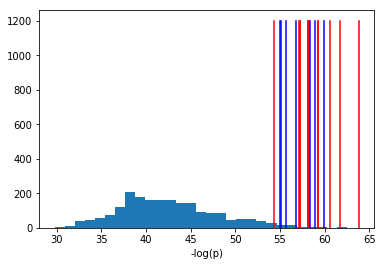

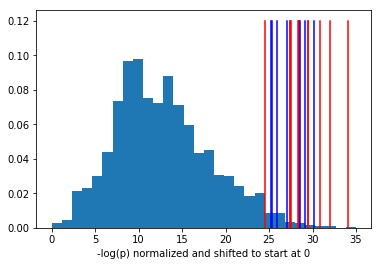

p-values: sideband,r,s,e,p
0.027438
0.000980
0.006369
0.003430
0.005879
0.007839
0.003430
0.000000
0.001960
0.007839
0.005879
0.007349
0.014699
0.005390
0.019598
0.008329
0.019598
0.002940
0.003920


In [33]:
# now get a probability
# one way is to fill a histogram of all possible -log(p) values
negL= [l*-1 for l in L]
negL_far= [l*-1 for l in L_ev_far]
negL_near= [l*-1 for l in L_ev_near]
plt.hist(negL,bins=30)
for i in range(len(far_recoE1)):
    plt.plot([negL_far[i],negL_far[i]],[0,1200],color='red')
for i in range(len(near_recoE1)):
    plt.plot([negL_near[i],negL_near[i]],[0,1200],color='blue')
plt.xlabel('-log(p)')
plt.show()
plt.close()

negLshift=[l-min(negL) for l in negL]

# then normalize the histogram
weights = np.ones_like(negL)/float(len(negL))
plt.hist(negLshift ,bins=30,range=[0,35] , weights=weights)
L_far = []
for i in range(len(far_recoE1)):
    newL_far = -L_ev_far[i] -min(negL)
    L_far.append(newL_far)
    plt.plot([newL_far,newL_far],[0,0.12],color='red')
L_near = []
for i in range(len(near_recoE1)):
    newL_near = -L_ev_near[i] -min(negL)
    L_near.append(newL_near)
    plt.plot([newL_near,newL_near],[0,0.12],color='blue')
plt.xlabel('-log(p) normalized and shifted to start at 0')
plt.savefig('event_likelihood.png')
plt.show()
plt.close()


# p-value by taking p( x > -log(p(data))
L_y,L_x = np.histogram(negLshift,bins = 200, range = [0,35], weights=weights)
print("p-values: sideband,r,s,e,p")
for i in range(len(L_far)):
    sumprob =0
    for bins in range(200):
        if L_x[bins]<(L_far[i]):
            sumprob += L_y[bins]
    #         print(L_y[bins])
    print("{:.6f}".format(1-sumprob))
for i in range(len(L_near)):
    sumprob =0
    for bins in range(200):
        if L_x[bins]<(L_near[i]):
            sumprob += L_y[bins]
    #         print(L_y[bins])
    print("{:.6f}".format(1-sumprob))



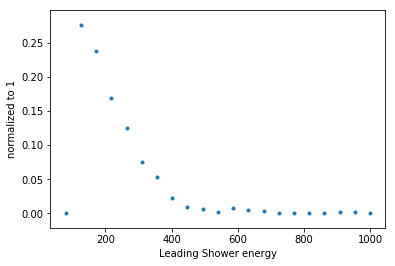

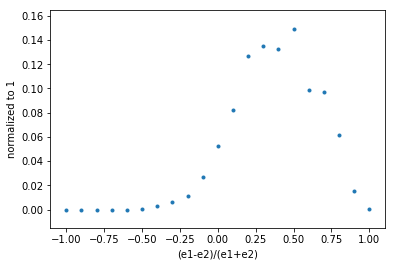

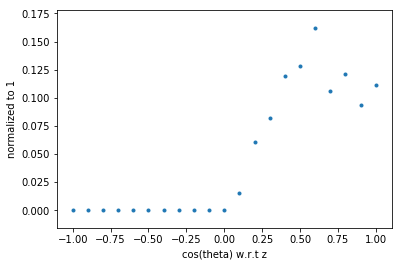

In [34]:
e_y,e_x = np.histogram(var_e,bins = 20, range = [80,1000], weights=var_w)
e_y = list(e_y)
e_y =ar([0.0]+e_y)
sum_e =sum(e_y)
for i in range(len(e_y)):
    e_y[i] =e_y[i]/sum_e 

cos_y,cos_x = np.histogram(var_cos,bins = 20, range = [-1,1], weights=var_w)
cos_y = list(cos_y)
cos_y =ar([0.0]+cos_y)
sum_e =sum(cos_y)
for i in range(len(cos_y)):
    cos_y[i] =cos_y[i]/sum_e 

reco_y,reco_x = np.histogram(var_cos_reco,bins = 20, range = [-1,1], weights=var_w)
reco_y = list(reco_y)
reco_y =ar([0.0]+reco_y)
sum_e =sum(reco_y)
for i in range(len(reco_y)):
    reco_y[i] =reco_y[i]/sum_e 

plt.scatter(e_x,e_y,marker = '.')
plt.xlabel('Leading Shower energy')
plt.ylabel('normalized to 1')
plt.show()
plt.close()

plt.scatter(cos_x,cos_y,marker = '.')
plt.xlabel('(e1-e2)/(e1+e2)')
plt.ylabel('normalized to 1')
plt.show()
plt.close()

plt.scatter(reco_x,reco_y,marker = '.')
plt.xlabel('cos(theta) w.r.t z')
plt.ylabel('normalized to 1')
plt.show()
plt.close()

[  -10.43237091   -10.11817    -1184.00452697 ...   -69.10274832
    54.11003454    25.04381529]
18291
hstack gh_weights [1.20593801 1.20593801 1.         ... 1.15510058 1.         1.20708673]
hstack gh_scale [1. 1. 1. ... 1. 1. 1.]
[ 135.38268757  152.83652034  197.65879652  207.03673537  269.64748182
  284.77537418  277.47448862  295.81076447  347.08406554  409.00944318
  420.83627611  505.95184474  592.68507501  648.15842125  723.01090495
  785.76593893  924.79230522  964.36076727 1239.51981828 1339.49686231
 1491.74013215 1474.50869948 1480.83597804 1179.53171267  809.09896375
  660.01087221  602.78589174  456.70011918  256.34246017  195.39951943
  152.11844346  102.46741443   89.63362631   74.00965786   29.5973194
   43.4674611    15.76122041   13.75879491    9.32702278   10.95234232]


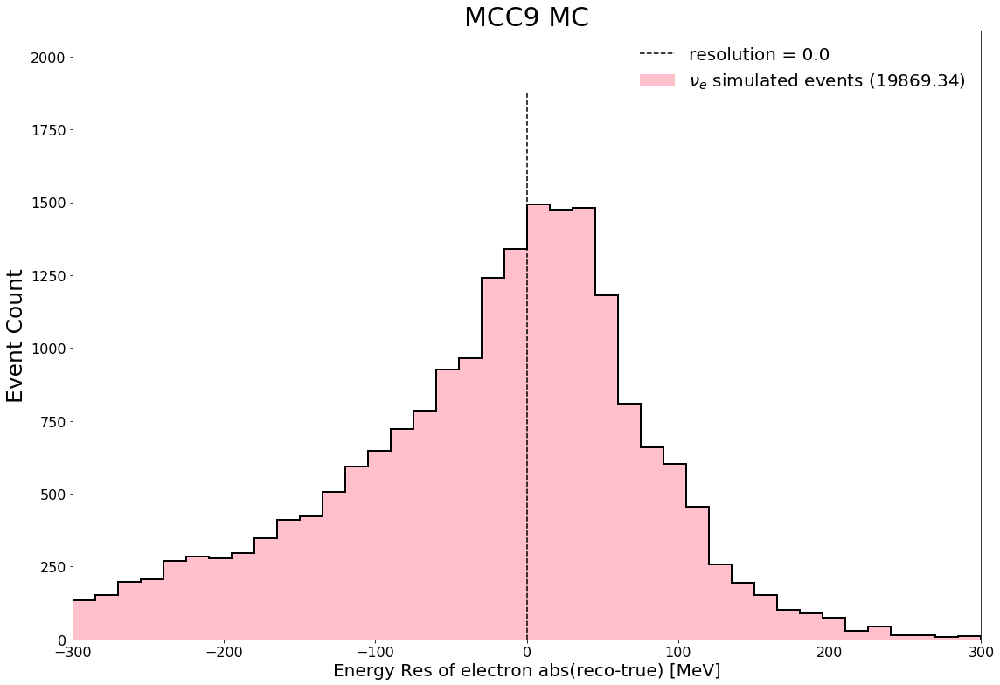

In [35]:
# electron simple resolution

print(df_nue_r1["EnergyRes1"].values)
vartest = "EnergyRes1"
varname = 'Energy Res of electron abs(reco-true) [MeV]'
myrange = [-300,300]
nbins =40

cov = np.zeros((nbins,nbins))
run1_open_Hists = StackedHisto((df_nue_r1,df_nue_r3,df_nue_r3),(1.0,1.0,1.0))
# run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
# run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
# run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=2 ',r"OffVtx $\pi^0$",'darkgreen')
# run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx background events",'gold')
# run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"$\nu_\mu$ background events",'grey')
#         run1_open_Hists.AddStrata('MC_parentPDG ==14',r"$\nu_mu$ events",'blue')
run1_open_Hists.AddStrata('haspi0==1 or haspi0==0',r"$\nu_e$ simulated events",'pink')
fig1,ax1 = distplot_mc(vartest,nbins,myrange,run1_open_Hists,varname)
fig1.savefig('electronres_20210413.png')

In [36]:
# # choose mpid muon cut value

# pur_NC = []
# pur_CC = []
# cutvals= [.01*i for i in range(1,99)]

# eff_NC=[]
# eff_CC=[]


# for cut in cutvals:
#     muoncut = str(cut)
#     countcc=len(df_numu_total.query('haspi0 ==1 and ccnc==0 and MC_scedr<5 and MPID_muon >=' + muoncut))
#     totalcc=len(df_numu_total.query('haspi0 ==1 and MC_scedr<5 and MPID_muon >=' + muoncut))
#     countnc=len(df_numu_total.query('haspi0 ==1 and MC_scedr<5 and ccnc==1 and MPID_muon <' + muoncut))
#     totalnc=len(df_numu_total.query('haspi0 ==1 and MC_scedr<5 and MPID_muon <' + muoncut))
#     pur_CC.append(float(countcc)/float(totalcc))
#     pur_NC.append(float(countnc)/float(totalnc))
#     print(float(countnc)/float(totalnc), cut)
#     eff_CC.append(float(countcc)/float(len(df_numu_total.query('haspi0 ==1 and ccnc==0 and MC_scedr<5' ))))
#     eff_NC.append(float(countnc)/float(len(df_numu_total.query('haspi0 ==1 and ccnc==1 and MC_scedr<5' ))))
    
# plt.scatter(cutvals,pur_NC,color ='blue',label = "NC purity",marker='.')
# plt.scatter(cutvals,pur_CC,color ='red',label = "CC purity",marker='.')
# plt.legend()
# plt.xlabel('Muon MPID cut value')
# plt.ylabel('sample purity (cc or nc)pi0/totalpi0')
# plt.show()
# plt.close()

# plt.scatter(cutvals,eff_NC,color ='blue',label = "NC eff",marker='.')
# plt.scatter(cutvals,eff_CC,color ='red',label = "CC eff",marker='.')
# plt.legend()
# plt.xlabel('Muon MPID cut value')
# plt.ylabel('sample efficiency (cc or nc)pi0 in cut /total(cc or nc) pi0')
# plt.show()

In [37]:
# reset covariance matrices for weighted
detvar1_list  = []
detvar3_list  = []
sys_list = []

sys_list.append('../systematics/covar_pi0_weighted__pi0_mass_reco.txt')
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys__pi0mass_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys__pi0mass_new_run3_cov.csv')


detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_DeltaMass_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_DeltaMass_new_run3_cov.csv')
sys_list.append('../systematics/covar_pi0_weighted__Delta_mass_reco.txt')

detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_energy_reco_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_energy_reco_new_run3_cov.csv')
sys_list.append('../systematics/covar_pi0_weighted__pi0_energy_reco.txt')

detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_momentum_reco_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_momentum_reco_new_run3_cov.csv')
sys_list.append('../systematics/covar_pi0_weighted__pi0_momentum_reco.txt')

detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower1_E_Y_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower1_E_Y_new_run3_cov.csv')
sys_list.append('../systematics/covar_pi0_weighted__shower1_energy_reco.txt')

detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower2_E_Y_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower2_E_Y_new_run3_cov.csv')
sys_list.append('../systematics/covar_pi0_weighted__shower2_energy_reco.txt')

detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_MPID_muon_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_MPID_muon_run3_cov.csv')
sys_list.append('../systematics/covar_pi0_weighted__mpid_muon_score.txt')

detvar1_list.append('none')
detvar3_list.append('none')
sys_list.append('none')

detvar1_list.append('none')
detvar3_list.append('none')
sys_list.append('none')

detvar1_list.append('none')
detvar3_list.append('none')
sys_list.append('none')

0       0.870804
2       0.812070
3       0.803612
5       0.876311
9       0.526495
10      0.911795
12      1.044376
13      0.986379
14      0.767508
16      0.911010
20      0.918008
21      0.756996
27      0.871598
30      0.690626
34      0.882130
39      0.891582
41      0.404540
43      0.442448
46      0.878658
49      0.991267
51      0.382678
52      0.846540
54      0.771138
60      0.465964
62      0.594055
63      0.736904
68      0.882886
69      0.529594
70      0.507528
73      0.578149
          ...   
2564    0.540019
2567    0.898883
2570    0.299122
2574    0.895718
2575    0.941749
2579    0.611215
2581    0.734098
2582    0.884568
2584    0.542414
2588    0.592964
2593    0.390494
2594    0.215255
2597    0.798040
2598    0.944190
2606    0.407352
2607    0.373691
2608    1.058620
2613    0.306124
2616    0.810498
2620    0.696882
2621    0.905387
2622    0.477947
2624    0.826886
2627    0.552555
2630    0.713651
2631    0.505316
2633    0.462790
2634    0.9896

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [0.09164739 0.07984955 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 167.65271466194918
SUM 984.3537863750299
SUM 389.6149037247691
SUM 144.12465468714169
SUM 167.33133463959823
SUM 18.47657738537041
SUM 218.472174580433
histogram bins [ 67.90948246 102.66582851 143.55412719 193.71685091 262.24273263
 283.56081215 306.35841391 262.0072419  165.98152827  75.01057844
  54.8276487   36.42813813  29.23097621  22.82146111  17.33748041
  13.39161061  20.73115072   7.91190356   7.8510104    9.01499525]
Normalization Uncertainty: 0.23193067631626682
yerr_mc_total [18.38548321 28.33207486 37.96271787 51.32834104 68.23276282 77.06337559
 86.1772908  64.22984986 41.76109081 20.60811492 17.67408938 12.80361536
 11.11824083  7.92850613  7.2062889   6.53374705  7.82149223  3.8198091
  3.64450583  4.19887005]
yerr_data 176.07117080162118
ERROR HERE
[0.11622772 0.09610307 0.07687906 0.0663126  0.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
696
827
3345
hstack gh_weights [0.09164739 0.07984955 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 168.8556744964564
SUM 989.3747392589773
SUM 396.7010669516058
SUM 145.5282561005137
SUM 174.26362297400573
SUM 18.876005784555378
SUM 222.20065741627684
histogram bins [  6.82950167  25.08154917  57.31819899  87.62781202 130.85742546
 170.81843288 156.3827122  198.36306927 177.80158552 150.25897565
 144.929436   137.95799807 109.87731775 101.09313378 102.31826823
  83.35983339  78.28275438  71.95979795  59.03128198  56.45028121]
Normalization Uncertainty: 0.22819418153132479
yerr_mc_total [ 4.03683524 10.87230657 16.18611616 23.29810021 29.37500664 43.4970621
 40.92841098 53.91632539 46.85928546 43.70708159 39.15687947 38.79178075
 30.12114778 27.01615443 28.44194978 24.71596997 24.52628107 22.26479368
 18.75172134 17.43081401]
yerr_data 196.30979641843606
ERROR HERE
[0.24328588 0.1820

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
696
827
3345
hstack gh_weights [0.09164739 0.07984955 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 167.71204888941352
SUM 980.6260574688328
SUM 392.8496366419176
SUM 144.94631715057636
SUM 173.3559430603649
SUM 17.7229307637762
SUM 225.39218980501104
histogram bins [ 52.12444836 256.08659777 341.68584199 299.39571989 263.19265242
 232.11728084 154.21357059 118.48369594  91.44950207  79.30471632
  57.46950821  37.42456754  27.2229978   17.68841455  19.06672889
  17.57149736   9.66412792   8.31407245   7.16134594   4.57564711]
Normalization Uncertainty: 0.23224220332080894
yerr_mc_total [16.18107312 60.41111622 86.11251977 75.5803848  70.74082627 65.40384946
 40.37526377 31.43600106 23.89803689 20.62120151 15.62079497 10.60039793
  8.65943843  6.76426547  6.5483061   6.39924073  4.37771525  4.29743001
  4.02801546  2.79161725]
yerr_data 173.44248345087374
ERROR HERE
[0.12286121 0.0566

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
696
827
3345
hstack gh_weights [0.09164739 0.07984955 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 155.0053005878752
SUM 910.4915015298711
SUM 362.1097685562133
SUM 126.96682370705831
SUM 160.3349420699642
SUM 17.308002543151588
SUM 203.03637793690967
histogram bins [258.99031681 300.07440268 268.28487916 226.53525587 193.66908068
 150.87682049 112.68388823 100.19743708  74.50913832  57.57491757
  48.88566809  30.67942709  24.74735255  23.67746453  14.84126037
  14.73316455   8.60715442   6.03041976   6.772083     6.84620773]
Normalization Uncertainty: 0.23167061122974109
yerr_mc_total [59.71721107 72.53088567 68.08610865 59.30988964 58.16290582 39.6055704
 30.49738116 26.82165517 20.20328521 13.92545061 12.79113132  9.00782204
  8.18479216  8.30676551  5.50058711  5.89591607  4.03617116  3.31695795
  3.59124979  3.977695  ]
yerr_data 166.8342479298847
ERROR HERE
[0.05431688 0.05234

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
696
827
3345
hstack gh_weights [0.09164739 0.07984955 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 165.6469274362775
SUM 963.919136884673
SUM 383.7047948079844
SUM 142.5393971194329
SUM 169.4177779051326
SUM 16.4854972592391
SUM 218.47217458043292
histogram bins [262.89016569 296.94783855 263.7885508  223.24474873 184.19943345
 156.07403094 127.22723874 112.44932319  82.32287202  73.0452689
  61.8479354   52.73230639  28.50929891  28.56138211  25.53670477
  22.39882716  17.77903199  14.0920666    9.69966735   9.36683971]
Normalization Uncertainty: 0.23368758835350256
yerr_mc_total [66.82054764 70.62630843 67.15067839 57.7833414  47.05243552 44.97839831
 33.93695186 30.15480864 25.66436321 21.91431385 18.20657628 15.10615833
 10.00060427  8.47892198  8.08655353  7.99995153  7.61200622  6.89434009
  5.55230456  5.82832183]
yerr_data 177.64705576486259
ERROR HERE
[0.0586463  0.05147179

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
696
827
3345
hstack gh_weights [0.09164739 0.07984955 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 162.6911489157492
SUM 956.9779397729487
SUM 380.34221454535196
SUM 135.62996519960762
SUM 160.25107574151397
SUM 18.023483324756626
SUM 200.38179599528524
histogram bins [353.16551832 335.03868546 286.3891506  214.25158572 177.63811602
 149.72058799 119.84989982  93.79884587  68.28377429  53.38123314
  39.86887467  30.64258447  21.1416033   18.68871787   9.26288413
  10.36318155   7.37923718   8.00215594   4.64658496   3.4026062 ]
Normalization Uncertainty: 0.2285685984155087
yerr_mc_total [84.62835555 81.83139275 71.40321079 55.33260528 45.13202203 39.4999287
 32.72913473 26.33487676 19.77286937 16.58360054 13.64930709 11.24047802
  9.04880077  9.86677362  5.52410719  6.42608398  5.7405777   9.08996634
  5.3827917   3.78889909]
yerr_data 165.4287292597248
ERROR HERE
[0.04731878 0.0490

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
696
827
3345
hstack gh_weights [0.09164739 0.07984955 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 168.85567449645637
SUM 989.3747392589776
SUM 396.7010669516058
SUM 145.52825610051374
SUM 174.2636229740058
SUM 18.876005784555378
SUM 227.25643122293297
histogram bins [110.35547156  76.97777369  73.70311802  71.17078137  77.33145366
  71.55633093  80.23323836  73.16818558  77.71215947  63.22517968
  62.22103933  72.75510124  88.72171134  84.29311322  96.08085826
 109.22751038 141.77672947 206.91154099 234.8875351  239.29053392]
Normalization Uncertainty: 0.2264996221100808
yerr_mc_total [28.35076044 21.89629913 21.28181239 19.39451086 22.26319619 21.30167833
 23.07098013 21.21081911 24.26039996 19.76308028 19.49198768 20.19342998
 24.78990978 23.76236308 25.38338783 30.17769902 36.61557723 47.97950954
 56.1422434  53.49839678]
yerr_data 198.41739249111964
ERROR HERE
[0.07474242 0.109

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
696
827
3345
hstack gh_weights [0.09164739 0.07984955 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 168.27429849826748
SUM 987.3409357534165
SUM 394.6178801154338
SUM 144.06333170173153
SUM 174.09541040598643
SUM 18.002331240259544
SUM 227.25643122293297
histogram bins [  0.           0.           0.         147.97378415 419.61303729
 434.36615942 361.24408476 238.29760509 161.24814678  99.6234613
  77.21999677  51.76190237  26.03980302  20.3574466   24.39876656
  14.07795914  12.1460404    9.18018936   3.6056076    3.24019712]
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          0.         12.01415659 20.98336264 21.25360922
 19.06426902 15.47507699 12.65265653  9.83444969  9.34968886  7.75950748
  5.03120641  5.20162183  5.21241435  4.19228112  3.52720018  2.77968687
  1.6967152   1.80005476]
yerr_data 153.69411841850578
ERROR HERE
[ 0.          0.          0.    

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:424: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
696
827
3345
hstack gh_weights [0.09164739 0.07984955 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 167.16604596498274
SUM 974.0964332288812
SUM 383.1982741860601
SUM 138.22152441707456
SUM 171.89613247787838
SUM 18.106199094187
SUM 187.86905651694133
histogram bins [  0.           0.          78.42711448 304.60451258 305.04618984
 249.05941402 232.0331156  174.91172301 153.97491545 127.82081344
  95.76578082  68.81433766  60.23965003  43.61051321  37.13093846
  31.86883338  20.50013717  22.95943659  12.93280443  14.98437922]
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          8.77345908 17.75095204 17.82082229 15.99741773
 15.34254913 13.28622558 12.74452704 11.3318584   9.76391911  8.54624857
  7.57182868  6.5485684   5.97305686  6.00773338  4.71685998  4.71515339
  3.49371426  4.09060022]
yerr_data 170.8743009702965
ERROR HERE
[0.         0.         0.09548513 0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:424: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2411
4568
3398
696
827
3345
hstack gh_weights [0.09164739 0.07984955 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 166.83083239777005
SUM 983.9457791563462
SUM 390.07068242053106
SUM 145.26703136645125
SUM 174.05574889765106
SUM 18.743013179749795
SUM 225.39218980501096
histogram bins [ 58.17864879  80.64996222  73.51368647 124.25864562  94.14339343
  94.50398877 131.76877768 107.64079098 110.99310813 109.62636835
 136.93946996 146.817324   173.07455339  97.29079527  24.55108278
 128.72690181 109.80818713 107.23813533  99.03776054  87.15150675]
Normalization Uncertainty: 0.0
yerr_mc_total [ 7.94540376  8.60866285  8.69237701 11.14100901  9.51365165  9.93619725
 11.46024054 10.54220342 10.54932267 10.60173878 11.73987956 12.76662316
 13.40288822 10.45160807  5.43156284 11.37176781 10.80753029 10.45379677
 10.00298087  9.44432308]
yerr_data 200.44615670482258
ERROR HERE
[0.10337631 0.09777142 0.10997

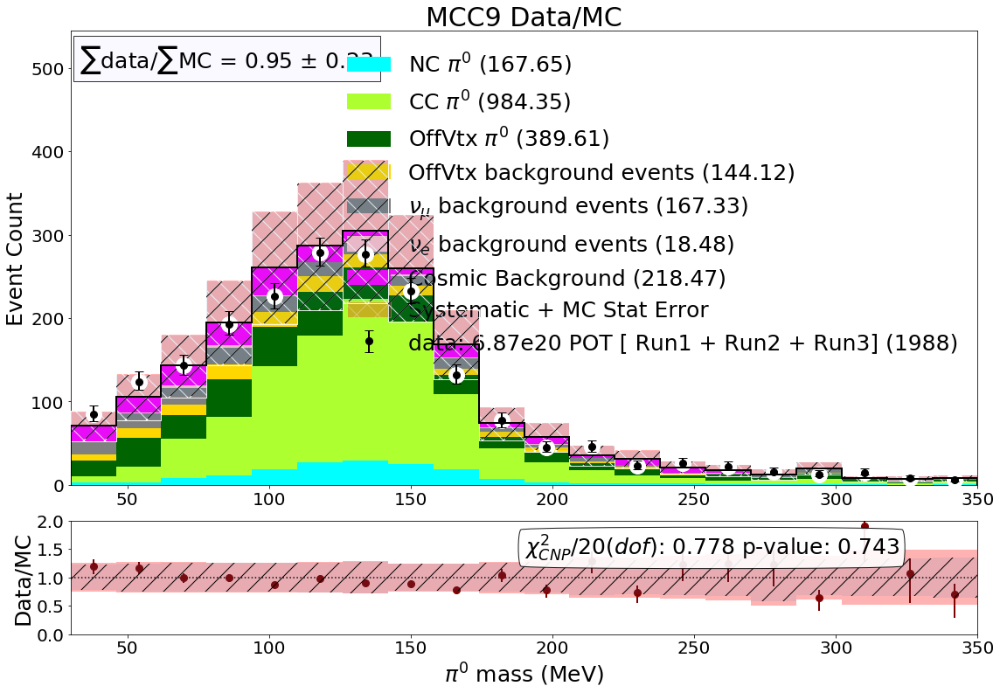

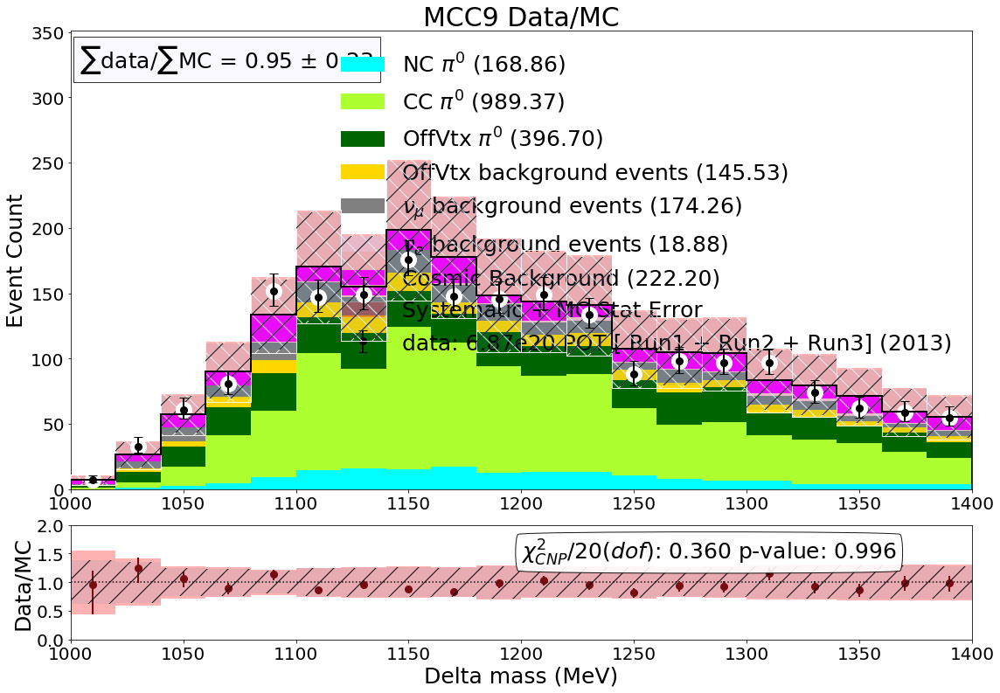

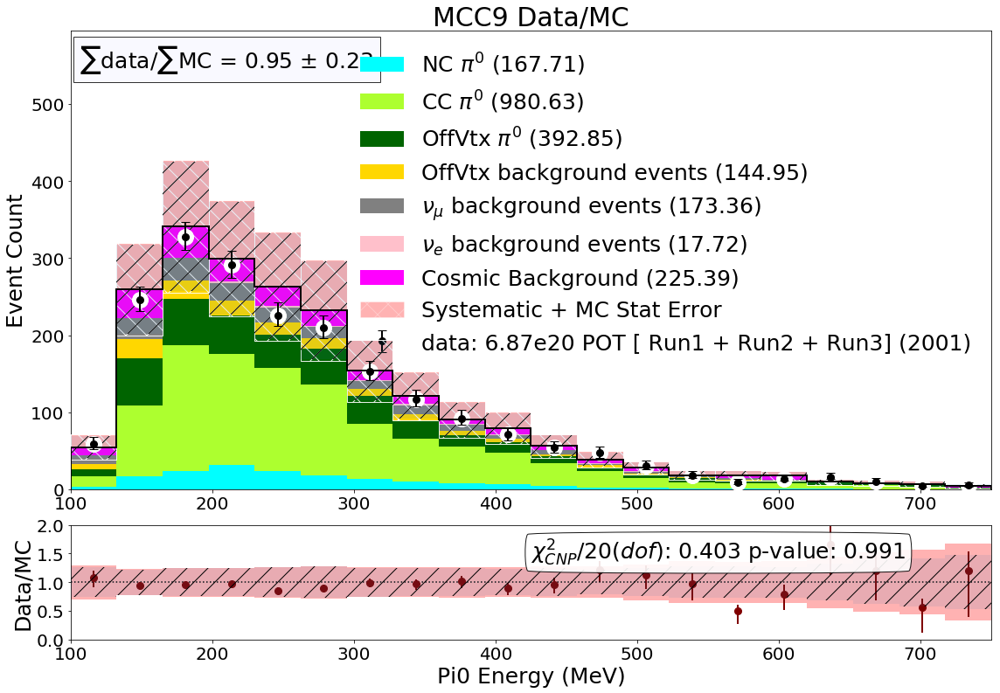

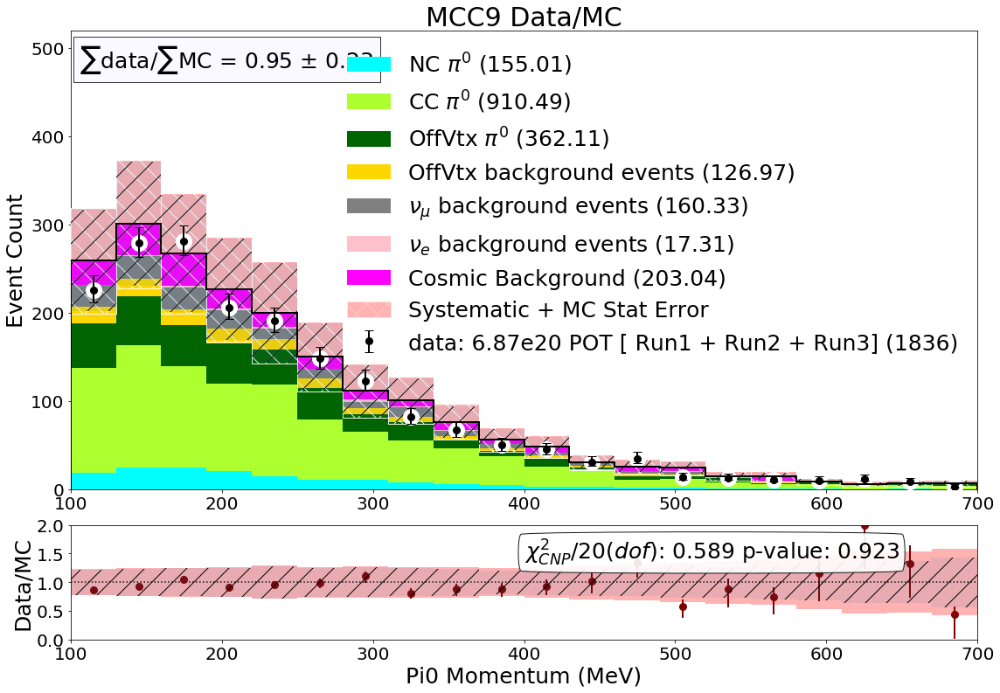

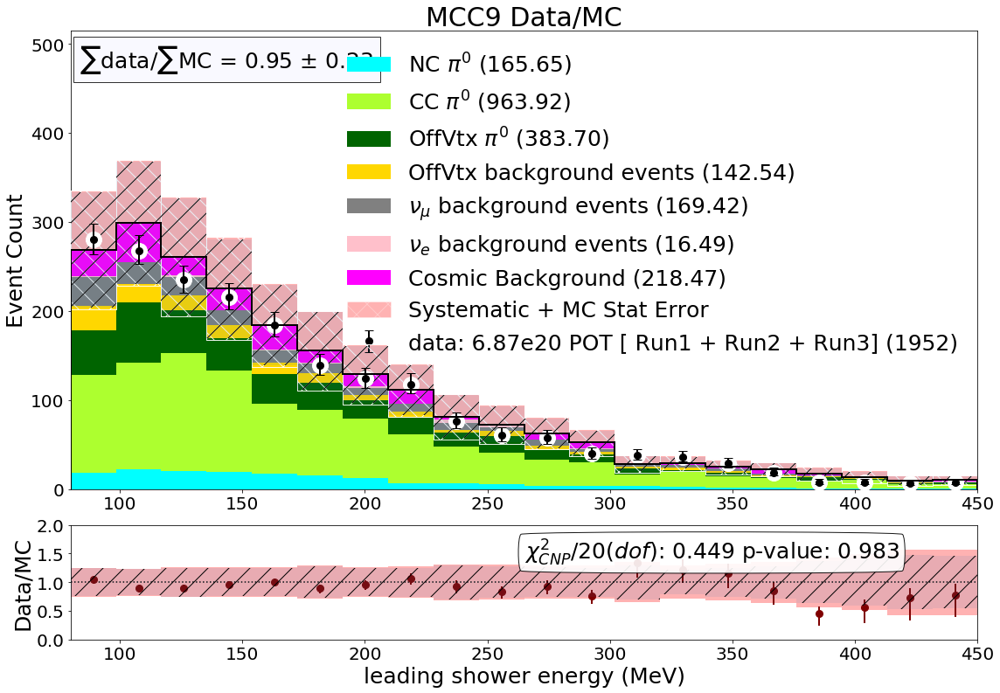

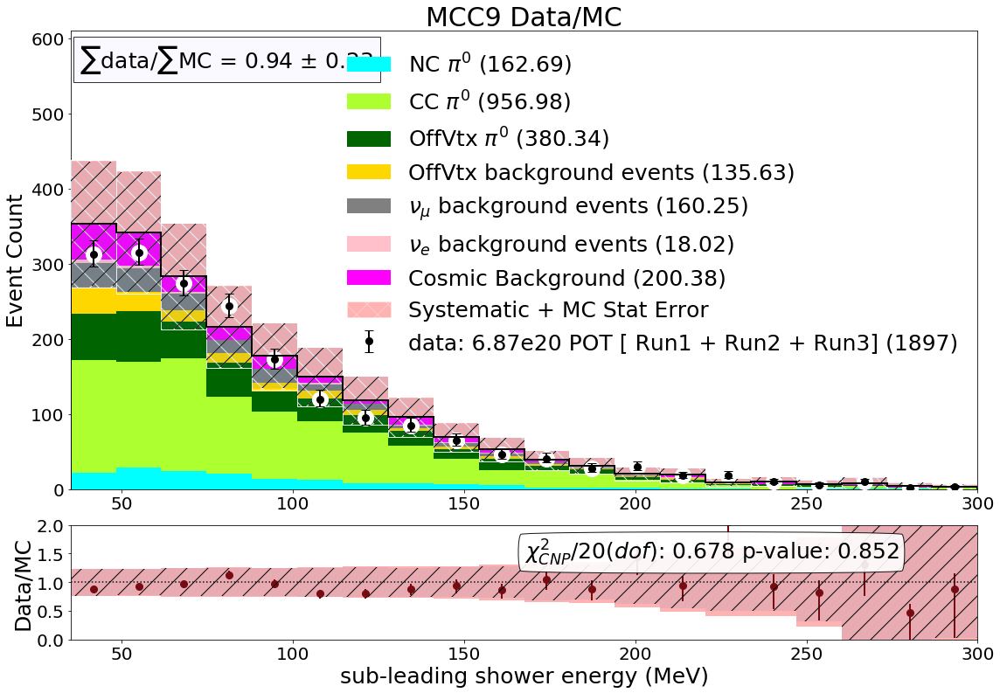

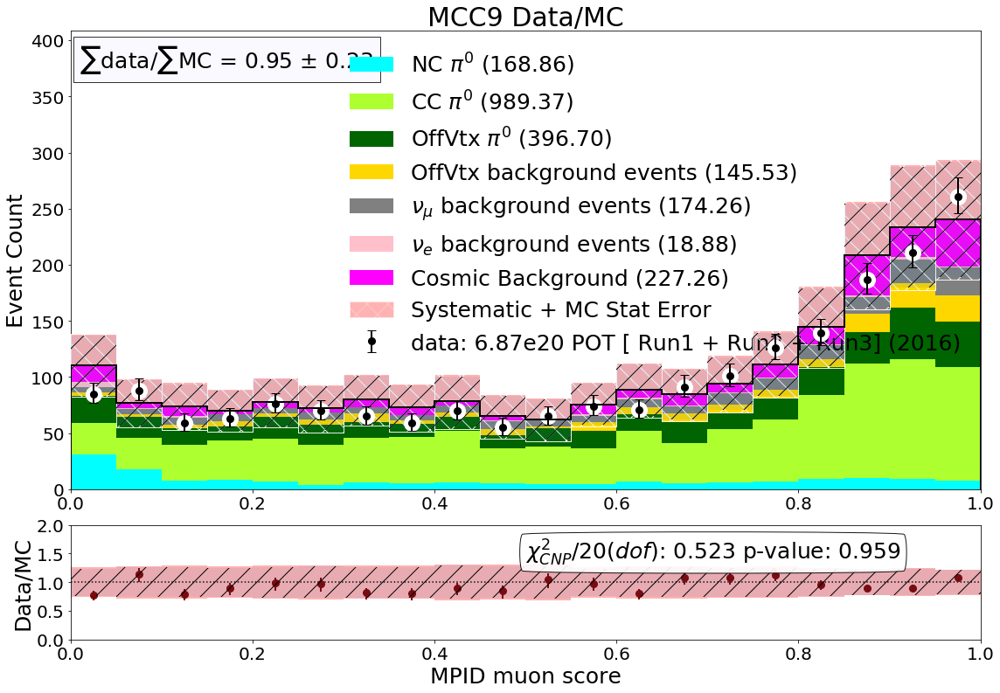

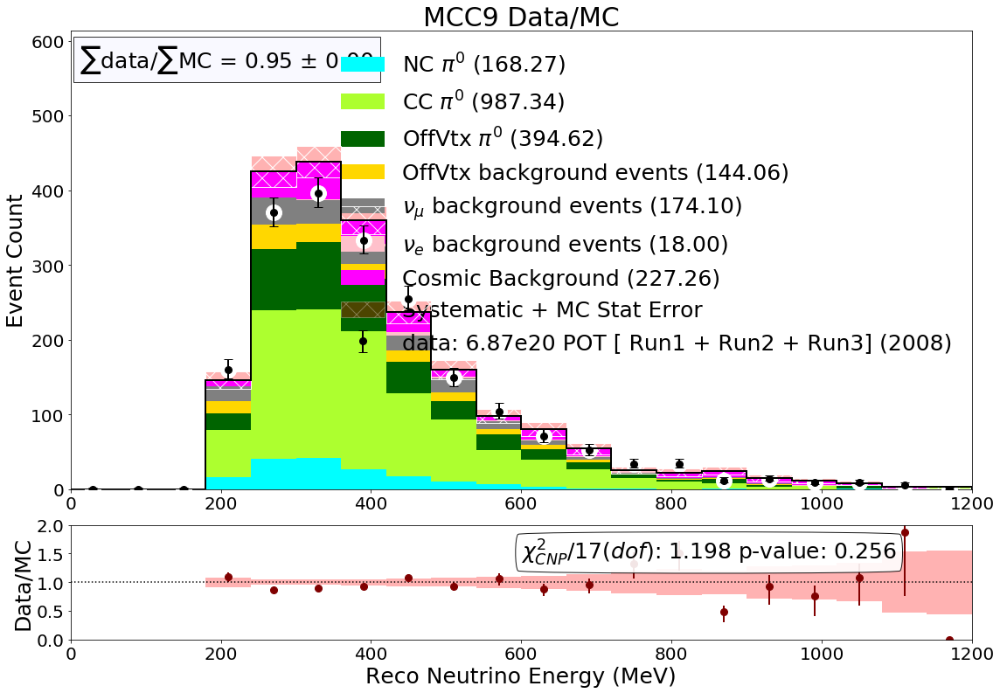

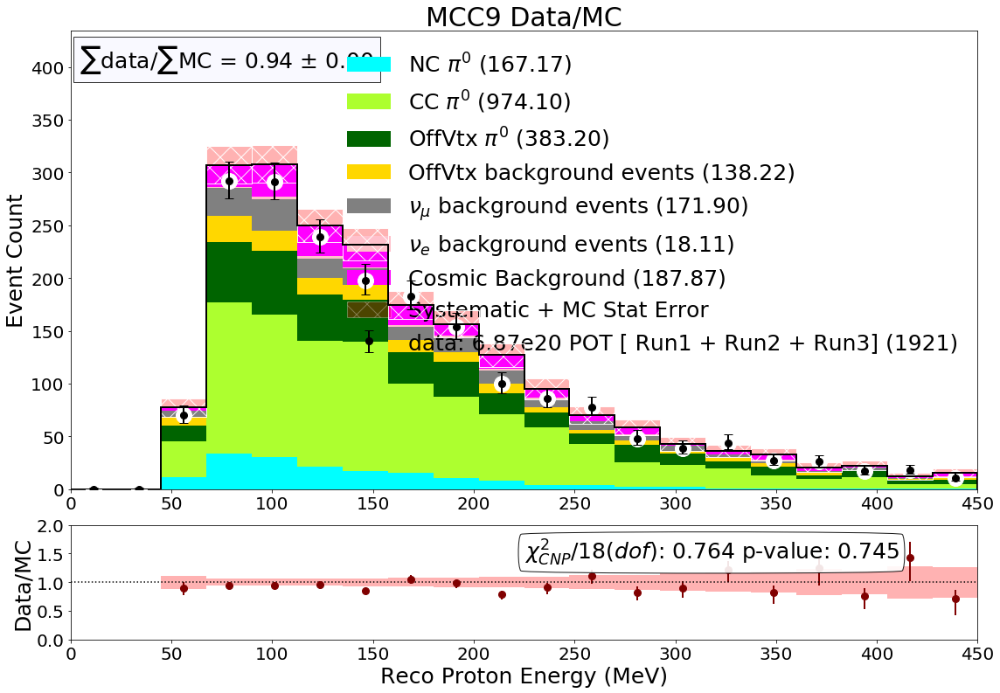

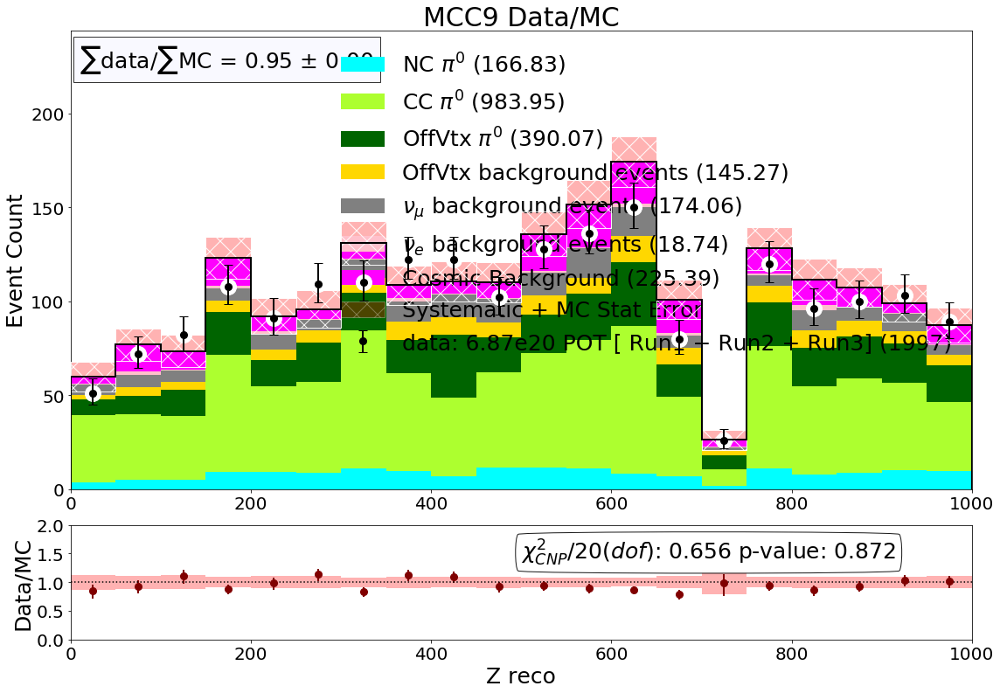

In [37]:
def getweights(df):
    a_CC= 2.75e-06
    b_CC= -0.0032
    c_CC = 1.553

#     a_NC = 1.7880514067943043e-06
#     b_NC = -0.0030618894546400556
#     c_NC= 1.423350491911423 


    a_NC= 1.3148535274393397e-06
    b_NC= -0.002448575873076658
    c_NC= 1.2349717365121429 
    weights =[]
    mom = df['pi0_momentum_true'].values
    pi0s = df['_pi0mass'].values
    ccnc = df['ccnc'].values

    for i in range(len(mom)):
        if pi0s[i] > 0 and a_CC*(mom[i]**2)+b_CC*mom[i]+c_CC <4:
            if ccnc[i]==0:
                weights.append(a_CC*(mom[i]**2)+b_CC*mom[i]+c_CC)
            else:
                if(a_NC*(mom[i]**2)+b_NC*mom[i]+c_NC <0):
                    weights.append(.001)
                else:
                    weights.append(a_NC*(mom[i]**2)+b_NC*mom[i]+c_NC)
        else:
            weights.append(1.0)
    return weights

def resetweights(df):
    weights_v = []
    for i in range(len(df)):
        weights_v.append(1.0)
    return weights_v

#reset new weights column
df_numu_total.drop(['new_weight'], axis=1)
df_nue_total.drop(['new_weight'], axis=1)
df_ccpi0_total.drop(['new_weight'], axis=1)
df_ncpi0_total.drop(['new_weight'], axis=1)

# now add in new weights
pi0_new4 = getweights(df_numu_total)
df_numu_total['new_weight'] = pi0_new4

pi0_new8 = resetweights(df_nue_total)
df_nue_total['new_weight'] = pi0_new8

pi0_new5 = getweights(df_ccpi0_total)
df_ccpi0_total['new_weight'] = pi0_new5

pi0_new6 = getweights(df_ncpi0_total)
df_ncpi0_total['new_weight'] = pi0_new6

print(df_ncpi0_total['new_weight'])
print(df_ccpi0_total['new_weight'])

with PdfPages('output_combined_20201109_weighted.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]
        
        if sys_list[i] == 'none':
            s_cov = np.zeros((nbins,nbins))
        else:
            s_cov = np.genfromtxt(sys_list[i],delimiter=',')
        
        if detvar1_list[i] == 'none':
            d_cov = np.zeros((nbins,nbins))
        else:
            d_cov1 = np.genfromtxt(detvar1_list[i],delimiter=',')
            d_cov3 = np.genfromtxt(detvar3_list[i],delimiter=',')
            d_cov = ((DATA_R1_PI0FILTER_POT)*d_cov1 + (DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)*d_cov3)/(DATA_R1_PI0FILTER_POT+DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)
        
        cov = d_cov+s_cov
#         cov =np.zeros((nbins,nbins))
        run1_open_Hists = StackedHisto((df_numu_total.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14'),df_nue_total.query('MC_parentPDG ==12'),df_ncpi0_total,df_ccpi0_total),(1.0,1.0,1.0,1.0))
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx background events",'gold')
        run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"$\nu_\mu$ background events",'grey')
#         run1_open_Hists.AddStrata('MC_parentPDG ==14',r"$\nu_mu$ events",'blue')
        run1_open_Hists.AddStrata('MC_parentPDG ==12 and haspi0==0',r"$\nu_e$ background events",'pink')
        run1_open_Hists.AddLayer(df_ext_total,df_ext_total['pot_weight'],0,'Cosmic Background','fuchsia')
        run1_open_DataHist = SimpleHisto(df_data_total,1.0,0,'','data: 6.87e20 POT [ Run1 + Run2 + Run3]')
        fig1,ax1,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_open_Hists,run1_open_DataHist,varname,m_cov=cov)
        pdf.savefig(fig1)

QE count:  576
Res count:  5962
Dis count:  2349
Coh count:  9
MEC count:  124
[   0.   83.  611. 1263. 1367. 1208. 1011.  881.  677.  521.  373.  285.
  211.  149.  102.   71.   52.   44.   32.   16.] 8957.0
576
9
0


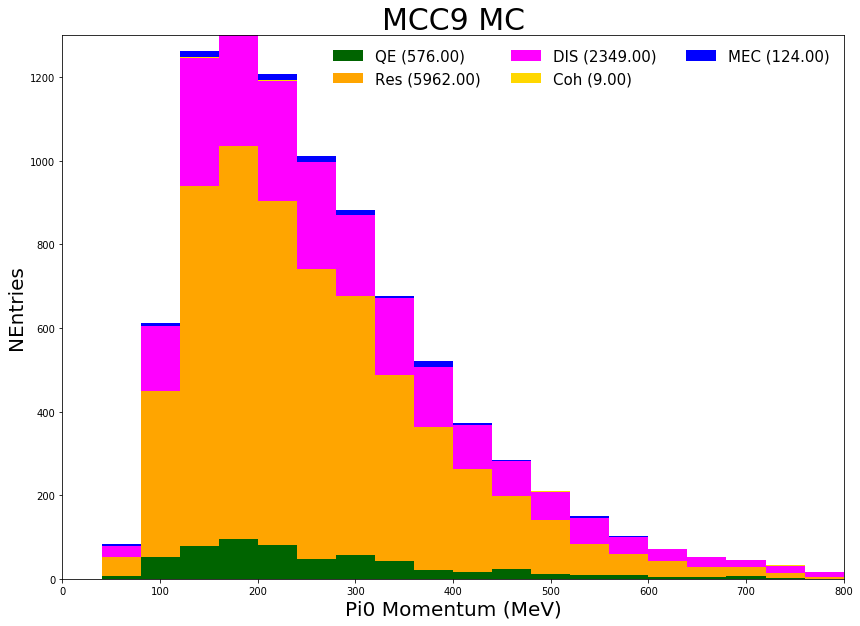

In [38]:
var_bnb_QE = df_numu_total.query("nu_interaction_mode ==0 and haspi0==1")['pi0_momentum_reco'].values
var_bnb_Res = df_numu_total.query("nu_interaction_mode ==1 and haspi0==1")['pi0_momentum_reco'].values
var_bnb_Dis = df_numu_total.query("nu_interaction_mode ==2 and haspi0==1")['pi0_momentum_reco'].values
var_bnb_Coh = df_numu_total.query("nu_interaction_mode ==3 and haspi0==1")['pi0_momentum_reco'].values
var_bnb_MEC = df_numu_total.query("nu_interaction_mode ==10 and haspi0==1")['pi0_momentum_reco'].values

print("QE count: ",len(df_numu_total.query("nu_interaction_mode ==0 and haspi0==1")))
print("Res count: ",len(df_numu_total.query("nu_interaction_mode ==1 and haspi0==1")))
print("Dis count: ",len(df_numu_total.query("nu_interaction_mode ==2 and haspi0==1")))
print("Coh count: ",len(df_numu_total.query("nu_interaction_mode ==3 and haspi0==1")))
print("MEC count: ",len(df_numu_total.query("nu_interaction_mode ==10 and haspi0==1")))

fig,ax = plt.subplots(figsize=(14,10))
_hists=[var_bnb_QE,var_bnb_Res,var_bnb_Dis,var_bnb_Coh,var_bnb_MEC]
tmp_colors = ['darkgreen','orange','magenta','gold','blue']
myrange = (0,800)
nbins = 20
ymax =1300
tmp_labels = ['QE'+' (%.2f)'%len(var_bnb_QE),'Res'+' (%.2f)'%len(var_bnb_Res),'DIS'+' (%.2f)'%len(var_bnb_Dis),'Coh'+' (%.2f)'%len(var_bnb_Coh),'MEC'+' (%.2f)'%len(var_bnb_MEC)]

fig.patch.set_alpha(1)
vals_mc = np.zeros(nbins)

for i in range(0,len(_hists)):
    v1,binedges = np.histogram(_hists[i],nbins,range=myrange)
    vals_mc += v1

print (vals_mc, sum(vals_mc))


bincenters = np.diff(binedges)/2 + binedges[:-1]     

plt.ylim(0,ymax)
plt.xlim(myrange)
ax.set_xlabel("Pi0 Momentum (MeV)",fontsize=20)
ax.set_ylabel('NEntries',fontsize=20)
ax.set_title('MCC9 MC',fontsize=30)

plt.hist(_hists,nbins,range=myrange,color=tmp_colors,stacked=True,linewidth=2.5,label=tmp_labels,edgecolor='None')

ax.legend(loc='upper right',fontsize=15,frameon=False,ncol=3)

print(len(df_numu_total.query("nu_interaction_mode ==0 and haspi0==1")))
print(len(df_numu_total.query("nu_interaction_type ==1096 and haspi0==1")))
print(len(df_numu_total.query("nu_interaction_mode ==0 and nu_interaction_type ==1096 and haspi0==1 and MC_scedr<5")))

## Save selection for Lauren

In [39]:
def getpi0weights(df):
    a_CC= 3.425e-06
    b_CC= -0.0039
    c_CC = 1.784

    a_NC= 1.3148535274393397e-06
    b_NC= -0.002448575873076658
    c_NC= 1.2349717365121429 


    weights =[]
    mom = df['pi0_momentum_true'].values
    pi0s = df['_pi0mass'].values
    ccnc = df['ccnc'].values

    for i in range(len(mom)):
        if pi0s[i] > 0 and a_CC*(mom[i]**2)+b_CC*mom[i]+c_CC <4:
            if ccnc[i]==0:
                weights.append(a_CC*(mom[i]**2)+b_CC*mom[i]+c_CC)
            else:
                weights.append(a_NC*(mom[i]**2)+b_NC*mom[i]+c_NC)
        else:
            weights.append(1.0)
    return weights

weights1mu = getpi0weights(df_numu_1mil_pi0)
weights2mu = getpi0weights(df_numu_r2_1mil_pi0)
weights3mu = getpi0weights(df_numu_r3_pi0)
weights1e = getpi0weights(df_nue_pi0)
weights2e = getpi0weights(df_nue_r2_pi0)
weights3e = getpi0weights(df_nue_r3_pi0)
weights1cc = getpi0weights(df_ccpi0_r1_pi0)
weights3cc = getpi0weights(df_ccpi0_r3_pi0)
weights1nc = getpi0weights(df_ncpi0_r1_pi0)
weights3nc = getpi0weights(df_ncpi0_r3_pi0)

df_numu_1mil_pi0['pi0_weight']=weights1mu
df_numu_r2_1mil_pi0['pi0_weight']=weights2mu
df_numu_r3_pi0['pi0_weight']=weights3mu
# df_nue_pi0['pi0_weight']=weights1e
# df_nue_r2_pi0['pi0_weight']=weights2e
# df_nue_r3_pi0['pi0_weight']=weights3e
df_ccpi0_r1_pi0['pi0_weight']=weights1cc
df_ccpi0_r3_pi0['pi0_weight']=weights3cc
df_ncpi0_r1_pi0['pi0_weight']=weights1nc
df_ncpi0_r3_pi0['pi0_weight']=weights3nc

KeyError: 'pi0_momentum_true'

In [ ]:
df_numu_pi0=df_numu_1mil_pi0.query('(MC_parentPDG ==14  and newhaspi0==0) or MC_parentPDG ==-14')
df_nue_pi0=df_nue_pi0.query("MC_parentPDG ==12")

# file1 = open("2021Apr02_pi0selection_bnb_overlay_run1.txt","w")
# file1.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon, weight]\n")
# for event in range(len(df_numu_pi0)):
#     teststr = "[" +str(df_numu_pi0['run'].values[event])+","+str(df_numu_pi0['subrun'].values[event])+","+str(df_numu_pi0['event'].values[event])+","+str(df_numu_pi0['_pi0mass_new'].values[event])+","+str(df_numu_pi0['DeltaMass_new'].values[event])
#     teststr2 =","+ str(df_numu_pi0['shower1_E_Y_new'].values[event])+","+str(df_numu_pi0['shower2_E_Y_new'].values[event])+","+ str(df_numu_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_numu_pi0['pi0_momentum_reco_new'].values[event])+","+ str(df_numu_pi0['MPID_muon'].values[event])+","+ str(df_numu_pi0['pi0_weight'].values[event])+"]"+"\n"
#     file1.write(teststr+teststr2)
# file1.close()


# file2 = open("2021Apr02_pi0selection_nue_intrinsic_run1.txt","w")
# file2.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon, weight]\n")
# for event in range(len(df_nue_pi0)):
#     teststr = "[" +str(df_nue_pi0['run'].values[event])+","+str(df_nue_pi0['subrun'].values[event])+","+str(df_nue_pi0['event'].values[event])+","+str(df_nue_pi0['_pi0mass_new'].values[event])+","+str(df_nue_pi0['DeltaMass_new'].values[event])
#     teststr2 =","+  str(df_nue_pi0['shower1_E_Y_new'].values[event])+","+str(df_nue_pi0['shower2_E_Y_new'].values[event])+","+ str(df_nue_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_nue_pi0['pi0_momentum_reco_new'].values[event])+","+ str(df_nue_pi0['MPID_muon'].values[event])+","+ str(df_nue_pi0['pi0_weight'].values[event])+"]"+"\n"
#     file2.write(teststr+teststr2)
# file2.close()

# file3 = open("2021Apr02_pi0selection_ext_run1.txt","w")
# file3.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon, weight]\n")
# for event in range(len(df_ext_pi0)):
#     teststr = "[" +str(df_ext_pi0['run'].values[event])+","+str(df_ext_pi0['subrun'].values[event])+","+str(df_ext_pi0['event'].values[event])+","+str(df_ext_pi0['_pi0mass_new'].values[event])+","+str(df_ext_pi0['DeltaMass_new'].values[event])
#     teststr2 = ","+ str(df_ext_pi0['shower1_E_Y_new'].values[event])+","+str(df_ext_pi0['shower2_E_Y_new'].values[event])+","+ str(df_ext_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_ext_pi0['pi0_momentum_reco'].values[event])+","+ str(df_ext_pi0['MPID_muon'].values[event])+","+'1.0'+"]"+"\n"
#     file3.write(teststr+teststr2)
# file3.close()


file1 = open("2021May31_fullpi0selection_bnb_overlay_run1.txt","w")
file1.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_numu_pi0)):
    teststr = "[" +str(df_numu_pi0['run'].values[event])+","+str(df_numu_pi0['subrun'].values[event])+","+str(df_numu_pi0['event'].values[event])
    teststr2 = ","+ str(df_numu_pi0['pi0_weight'].values[event])+ ","+ str(df_numu_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()


file2 = open("2021May31_fullpi0selection_nue_intrinsic_run1.txt","w")
file2.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_nue_pi0)):
    teststr = "[" +str(df_nue_pi0['run'].values[event])+","+str(df_nue_pi0['subrun'].values[event])+","+str(df_nue_pi0['event'].values[event])
    teststr2 = ","+ str(df_nue_pi0['pi0_weight'].values[event])+ ","+ str(df_nue_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file2.write(teststr+teststr2)
file2.close()

file3 = open("2021May31_fullpi0selection_ext_run1.txt","w")
file3.write("[run,subrun,event,weight, reco Enu]\n")
for event in range(len(df_ext_pi0)):
    teststr = "[" +str(df_ext_pi0['run'].values[event])+","+str(df_ext_pi0['subrun'].values[event])+","+str(df_ext_pi0['event'].values[event])
    teststr2 = ","+ "1.0"+ ","+ str(df_ext_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file3.write(teststr+teststr2)
file3.close()


In [ ]:
df_numu_r2_1mil_pi0=df_numu_r2_1mil_pi0.query('(MC_parentPDG ==14  and newhaspi0==0) or MC_parentPDG ==-14')
df_nue_r2_pi0=df_nue_r2_pi0.query("MC_parentPDG ==12")

file1 = open("2021May31_fullpi0selection_bnb_overlay_run2.txt","w")
file1.write("[run,subrun,event,pi0mass, weight, reco Enu,true neutrino energy]\n")
for event in range(len(df_numu_r2_1mil_pi0)):
    teststr = "[" +str(df_numu_r2_1mil_pi0['run'].values[event])+","+str(df_numu_r2_1mil_pi0['subrun'].values[event])+","+str(df_numu_r2_1mil_pi0['event'].values[event])
    teststr2 = ","+ str(df_numu_r2_1mil_pi0['pi0_weight'].values[event])+ ","+ str(df_numu_r2_1mil_pi0['Enu_1e1p'].values[event])+ "," +str(df_numu_r2_1mil_pi0['nu_energy_true'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()


file2 = open("2021May31_fullpi0selection_nue_intrinsic_run2.txt","w")
file2.write("[run,subrun,event,pi0mass, weight, reco Enu,true neutrino energy]\n")
for event in range(len(df_nue_r2_pi0)):
    teststr = "[" +str(df_nue_r2_pi0['run'].values[event])+","+str(df_nue_r2_pi0['subrun'].values[event])+","+str(df_nue_r2_pi0['event'].values[event])
    teststr2 = ","+ str(df_nue_r2_pi0['pi0_weight'].values[event])+ ","+ str(df_nue_r2_pi0['Enu_1e1p'].values[event])+ "," +str(df_nue_r2_pi0['nu_energy_true'].values[event])+"]"+"\n"
    file2.write(teststr+teststr2)
file2.close()


In [ ]:
df_numu_r3_pi0=df_numu_r3_pi0.query('(MC_parentPDG ==14  and newhaspi0==0) or MC_parentPDG ==-14')
df_nue_r3_pi0=df_nue_r3_pi0.query("MC_parentPDG ==12")

file1 = open("2021May31_fullpi0selection_bnb_overlay_run3.txt","w")
file1.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_numu_r3_pi0)):
    teststr = "[" +str(df_numu_r3_pi0['run'].values[event])+","+str(df_numu_r3_pi0['subrun'].values[event])+","+str(df_numu_r3_pi0['event'].values[event])
    teststr2 = ","+ str(df_numu_r3_pi0['pi0_weight'].values[event])+ ","+ str(df_numu_r3_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()


file2 = open("2021May31_fullpi0selection_nue_intrinsic_run3.txt","w")
file2.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_nue_r3_pi0)):
    teststr = "[" +str(df_nue_r3_pi0['run'].values[event])+","+str(df_nue_r3_pi0['subrun'].values[event])+","+str(df_nue_r3_pi0['event'].values[event])
    teststr2 = ","+ str(df_nue_r3_pi0['pi0_weight'].values[event])+ ","+ str(df_nue_r3_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file2.write(teststr+teststr2)
file2.close()

file3 = open("2021May31_fullpi0selection_ext_run3.txt","w")
file3.write("[run,subrun,event,weight, reco Enu]\n")
for event in range(len(df_ext_r3_pi0)):
    teststr = "[" +str(df_ext_r3_pi0['run'].values[event])+","+str(df_ext_r3_pi0['subrun'].values[event])+","+str(df_ext_r3_pi0['event'].values[event])
    teststr2 = ","+ "1.0"+ ","+ str(df_ext_r3_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file3.write(teststr+teststr2)
file3.close()

In [ ]:
file1 = open("2021May31_fullpi0selection_CCPi0_run1.txt","w")
file1.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_ccpi0_r1_pi0)):
    teststr = "[" +str(df_ccpi0_r1_pi0['run'].values[event])+","+str(df_ccpi0_r1_pi0['subrun'].values[event])+","+str(df_ccpi0_r1_pi0['event'].values[event])
    teststr2 = ","+ str(df_ccpi0_r1_pi0['pi0_weight'].values[event])+ ","+ str(df_ccpi0_r1_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()

file1 = open("2021May31_fullpi0selection_CCPi0_run3.txt","w")
file1.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_ccpi0_r3_pi0)):
    teststr = "[" +str(df_ccpi0_r3_pi0['run'].values[event])+","+str(df_ccpi0_r3_pi0['subrun'].values[event])+","+str(df_ccpi0_r3_pi0['event'].values[event])
    teststr2 = ","+ str(df_ccpi0_r3_pi0['pi0_weight'].values[event])+ ","+ str(df_ccpi0_r3_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()



In [ ]:
file1 = open("2021May31_fullpi0selection_NCPi0_run1.txt","w")
file1.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_ncpi0_r1_pi0)):
    teststr = "[" +str(df_ncpi0_r1_pi0['run'].values[event])+","+str(df_ncpi0_r1_pi0['subrun'].values[event])+","+str(df_ncpi0_r1_pi0['event'].values[event])
    teststr2 = ","+ str(df_ncpi0_r1_pi0['pi0_weight'].values[event])+ ","+ str(df_ncpi0_r1_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()

file1 = open("2021May31_fullpi0selection_NCPi0_run3.txt","w")
file1.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_ncpi0_r3_pi0)):
    teststr = "[" +str(df_ncpi0_r3_pi0['run'].values[event])+","+str(df_ncpi0_r3_pi0['subrun'].values[event])+","+str(df_ncpi0_r3_pi0['event'].values[event])
    teststr2 = ","+ str(df_ncpi0_r3_pi0['pi0_weight'].values[event])+ ","+ str(df_ncpi0_r3_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()
